# **Metro Vancouver Housing**

The data folder contains structured property information extracted from real estate listings. It includes CSV files where each row represents a property with details such as price, location, size, number of bedrooms and bathrooms, and additional features like heating, cooling, and garage availability. This folder serves as the primary storage for processed real estate data, which can be used for market analysis, pricing trends, and investment insights. The source of information is [REMAX Canada](https://www.remax.ca/) website

## Features of the dataset:

* City (Categorical) -> the name of the city

* Province (Categorical) -> the name of the province

* Latitude (Continuous) -> how far north or south it is from the Equator.

* Longitude (Continuous) -> how far east or west it is from the Prime Meridian

* Bedrooms (Continuous) -> number of Bedrooms

* Bathrooms (Continuous) -> number of Bathrooms    

* Acreage  (Continuous)  ->  measure of land area, specifically the total number of acres a piece of land covers.  

* Property Type (Categorical) ->  type of house (Single Family,
Condo, Townhome, Condo/Townhome, Duplex, MultiFamily, Mobile Home,
Manufactured Home, Vacant Land)

* Square Footage (Continuous) -> total floor area of a house  

* Garage  (Categorical) -> does the house has garage Yes/No     

* Parking  (Categorical) -> does the house has parking place Yes/No  

* Basement (Categorical)  -> the proccess of contstruction(Finished,No basement
Partial)   

* Exterior  (Categorical) -> the type of material (Vinyl, Brick, Concrete,
Wood, Metal, Composite)    

* Fireplace (Categorical) -> does the house has garage Yes/No   

* Heating (Categorical) -> type of heating (forced air,radiant, heat pump,	boiler, alt heat, fireplace, other, no heat, space heat)

* Flooring (Categorical) -> type of material used for the floor (carpet, wood,tile, laminate, vinyl, other, concrete)   

* Roof (Categorical) ->  type of material used for the roof (asphalt,metal,
fiberglass, other,  shingle, flat,  tile,  shake,  tar,  cedar shake,  clay,wood,concrete, rubber,pine shake, slate)   

* Waterfront  (Categorical) -> does the house has garage Yes/No   

* Sewer (Categorical) -> type of sewer (municipal, septic, private,alternative)     

* Pool  (Categorical) -> does the house has pool Yes/No   

* Garden (Categorical) -> does the house has garden Yes/No

* Balcony (Categorical) -> does the house has balcony Yes/No         

## Target columns

* Price (Continuous)-> the price of the house

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from sklearn.metrics import mean_squared_error ,  r2_score
from sklearn.linear_model import LinearRegression,RidgeCV,LassoCV,BayesianRidge
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split,GridSearchCV,KFold, cross_val_score
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
import scipy.stats as stats
from xgboost import XGBRegressor
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
df= pd.read_csv('/content/drive/MyDrive/Vancouver_houses.csv')
df

,link,price,beds,baths,square footage,property type,property address,Latitude,Longitude,description,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
0,https://www.remax.ca/bc/vancouver-real-estate/...,749900,2,2,792.0,condo,"1703-120 MILROSS AVENUE, VANCOUVER, BC V6A 4K7",49.275734,-123.101635,Heating: Electric\nFireplace: Yes\nGarage: Yes...,...,No,9.0,9.3,10.0,8.9,10.0,9.7,10.0,2.6,VANCOUVER
1,https://www.remax.ca/bc/vancouver-real-estate/...,1549900,2,2,1110.0,condo,"1603-33 SMITHE STREET, VANCOUVER, BC V6B 0B5",49.274663,-123.112380,"Heating: Baseboard, Electric\nFireplace: Yes\n...",...,No,9.5,9.3,10.0,8.3,10.0,9.0,9.4,2.5,VANCOUVER
2,https://www.remax.ca/bc/richmond-real-estate/4...,650000,2,2,732.0,condo,"406-9311 ALEXANDRA ROAD, RICHMOND, BC V6X 0L8",49.179185,-123.120570,Heating: Geothermal\nGarage: Yes\nParking Feat...,...,No,9.5,6.9,8.1,4.5,7.2,6.9,4.9,7.3,RICHMOND
3,https://www.remax.ca/luxury/bc/burnaby-real-es...,2388000,5,5,2324.0,house,"5465 ABBEY AVENUE, BURNABY, BC V5H 2S9",49.235092,-123.006441,Heating: Forced Air\nFireplace: Yes\nBasement:...,...,No,8.7,6.2,8.1,5.5,6.8,6.1,7.3,6.5,BURNABY
4,https://www.remax.ca/bc/vancouver-real-estate/...,1098000,2,2,882.0,condo,"3208-1239 W GEORGIA STREET, VANCOUVER, BC V6E 3J5",49.287694,-123.125721,"Heating: Electric, Natural Gas\nFireplace: Yes...",...,No,8.4,6.1,9.1,8.7,8.4,9.8,10.0,8.8,VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16304,https://www.remax.ca/luxury/bc/vancouver-real-...,3350000,6,6,1872.0,house,"2966 FRASER STREET, VANCOUVER, BC V5T 3W3",49.257877,-123.088942,"Heating: [""Natural Gas""]\nBasement: [""Full"", ""...",...,No,5.8,5.0,4.7,5.7,8.6,8.9,9.6,9.6,VANCOUVER
16305,https://www.remax.ca/luxury/bc/vancouver-real-...,3408888,6,6,3257.0,house,"1081 W 16TH AVENUE, VANCOUVER, BC V6H 1S7",49.257260,-123.128946,"Heating: [""Forced Air""]\nBasement: [""Finished""...",...,No,9.7,7.1,8.8,8.4,9.0,6.4,9.6,9.2,VANCOUVER
16306,https://www.remax.ca/bc/vancouver-real-estate/...,3000,2,2,NaN,house,"1249 GRANVILLE STREET, VANCOUVER, BC V6Z1M5",49.276786,-123.127133,NaN,...,No,9.5,9.4,9.9,6.7,7.8,9.1,4.6,6.0,VANCOUVER
16307,https://www.remax.ca/bc/burnaby-real-estate/43...,1288000,2,2,847.0,condo,"4305-4485 SKYLINE DRIVE, BURNABY, BC V5C 0J2",49.265697,-123.003571,"Heating: [""Electric""]\nGarage: Yes\nParking Fe...",...,No,9.9,9.0,6.3,9.1,9.9,8.1,6.6,6.2,BURNABY


In [ ]:
df = df.drop(columns=['link','property address','description'],axis=1)
df

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
0,749900,2,2,792.0,condo,49.275734,-123.101635,Electric,Yes,Yes,...,No,9.0,9.3,10.0,8.9,10.0,9.7,10.0,2.6,VANCOUVER
1,1549900,2,2,1110.0,condo,49.274663,-123.112380,Baseboard,Yes,Yes,...,No,9.5,9.3,10.0,8.3,10.0,9.0,9.4,2.5,VANCOUVER
2,650000,2,2,732.0,condo,49.179185,-123.120570,Geothermal,Yes,Yes,...,No,9.5,6.9,8.1,4.5,7.2,6.9,4.9,7.3,RICHMOND
3,2388000,5,5,2324.0,house,49.235092,-123.006441,Forced Air,Yes,Yes,...,No,8.7,6.2,8.1,5.5,6.8,6.1,7.3,6.5,BURNABY
4,1098000,2,2,882.0,condo,49.287694,-123.125721,Electric,Yes,Yes,...,No,8.4,6.1,9.1,8.7,8.4,9.8,10.0,8.8,VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16304,3350000,6,6,1872.0,house,49.257877,-123.088942,Natural Gas,No,Yes,...,No,5.8,5.0,4.7,5.7,8.6,8.9,9.6,9.6,VANCOUVER
16305,3408888,6,6,3257.0,house,49.257260,-123.128946,Forced Air,No,Yes,...,No,9.7,7.1,8.8,8.4,9.0,6.4,9.6,9.2,VANCOUVER
16306,3000,2,2,NaN,house,49.276786,-123.127133,Other,No,No,...,No,9.5,9.4,9.9,6.7,7.8,9.1,4.6,6.0,VANCOUVER
16307,1288000,2,2,847.0,condo,49.265697,-123.003571,Electric,Yes,Yes,...,No,9.9,9.0,6.3,9.1,9.9,8.1,6.6,6.2,BURNABY


### Some basic informations about the dataset

In [ ]:
df.isnull().sum()

,0
price,0
beds,0
baths,0
square footage,201
property type,168
Latitude,19
Longitude,19
Heating,125
Garage,0
Parking,0


<Axes: >

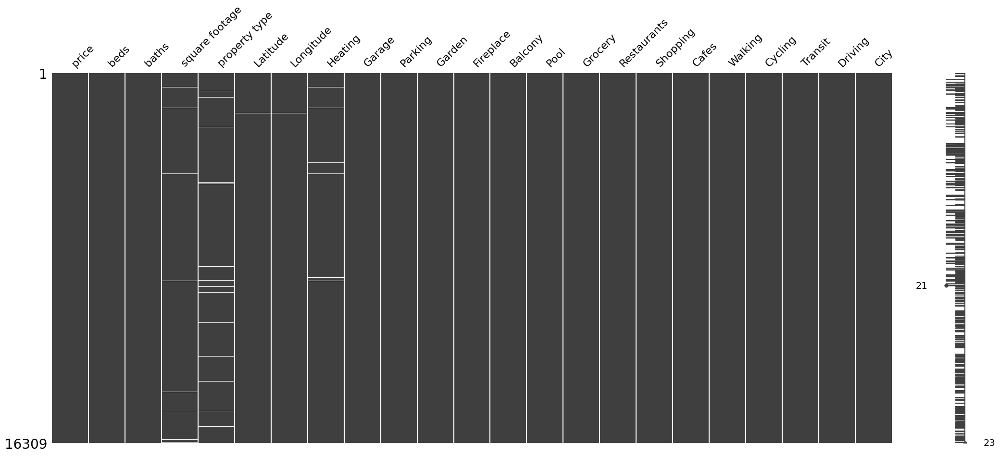

In [ ]:
msno.matrix(df)

In [ ]:
df.describe()

,price,beds,baths,square footage,Latitude,Longitude,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving
count,1.630900e+04,16309.000000,16309.000000,16108.000000,16290.000000,16290.000000,16309.000000,16309.000000,16309.000000,16309.000000,16309.000000,16309.000000,16309.000000,16309.000000
mean,2.051440e+06,2.840027,2.840027,1804.873417,49.264973,-123.090255,7.406162,7.396278,7.110013,7.117346,7.309872,7.305163,7.426035,6.959482
std,2.626297e+06,1.914464,1.914464,1894.818600,0.045795,0.071387,1.505383,1.516669,1.680619,1.684110,1.557664,1.556901,1.497766,1.778434
min,6.000000e+00,0.000000,0.000000,70.000000,49.116826,-123.305490,4.500000,4.500000,4.000000,4.000000,4.500000,4.500000,4.500000,2.500000
25%,7.890000e+05,2.000000,2.000000,800.000000,49.236362,-123.131250,6.100000,6.100000,5.700000,5.700000,5.900000,6.000000,6.200000,5.500000
50%,1.319000e+06,2.000000,2.000000,1187.000000,49.266067,-123.107202,7.400000,7.400000,7.100000,7.100000,7.300000,7.300000,7.400000,7.000000
75%,2.380000e+06,4.000000,4.000000,2243.250000,49.286141,-123.039932,8.700000,8.700000,8.600000,8.600000,8.700000,8.700000,8.700000,8.500000
max,5.880000e+07,21.000000,21.000000,52280.000000,49.477185,-122.889202,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [ ]:
df.columns

Index(['price', 'beds', 'baths', 'square footage', 'property type', 'Latitude',
       'Longitude', 'Heating', 'Garage', 'Parking', 'Garden', 'Fireplace',
       'Balcony', 'Pool', 'Grocery', 'Restaurants', 'Shopping', 'Cafes',
       'Walking', 'Cycling', 'Transit', 'Driving', 'City'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16309 entries, 0 to 16308
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   price           16309 non-null  int64  
 1   beds            16309 non-null  int64  
 2   baths           16309 non-null  int64  
 3   square footage  16108 non-null  float64
 4   property type   16141 non-null  object 
 5   Latitude        16290 non-null  float64
 6   Longitude       16290 non-null  float64
 7   Heating         16184 non-null  object 
 8   Garage          16309 non-null  object 
 9   Parking         16309 non-null  object 
 10  Garden          16309 non-null  object 
 11  Fireplace       16309 non-null  object 
 12  Balcony         16309 non-null  object 
 13  Pool            16309 non-null  object 
 14  Grocery         16309 non-null  float64
 15  Restaurants     16309 non-null  float64
 16  Shopping        16309 non-null  float64
 17  Cafes           16309 non-null 

In [ ]:
df['Heating'] = df['Heating'].str.strip()
df['Heating'] = df['Heating'].replace({
    '[Natural Gas': 'Natural Gas',
    '["Baseboard"]': 'Baseboard',
    'Natural gas': 'Natural Gas',
    '["Electric"]': 'Electric',
    'Forced':'Forced Air',
    'Mixed':'Other',
    'Radiant heaters':'Radiant',
    '["Heat Pump"]':'Heat Pump',
    'Baseboard heaters': 'Baseboard',
    'Radiant heat':'Radiant',
    'Forced air':'Forced Air'
})
df['Heating'] = df['Heating'].str.replace(r'\s+', ' ', regex=True)
df['Heating'].value_counts()

,count
Heating,
Baseboard,4998
Forced Air,3646
Heat Pump,2068
Electric,1997
Hot Water,953
Radiant,909
Natural Gas,858
Other,477
Geothermal,278


In [ ]:
df['City'].value_counts()

,count
City,
VANCOUVER,9001
BURNABY,2917
NORTH VANCOUVER,2088
WEST VANCOUVER,1232
RICHMOND,1071


In [ ]:
print("Number of duplicate rows:", df.duplicated().sum())

# Drop duplicate rows
df = df.drop_duplicates()

# Verify if duplicates are removed
print("Number of rows after removing duplicates:", len(df))

Number of duplicate rows: 0
Number of rows after removing duplicates: 16309


In [ ]:
df['property type'].value_counts()

,count
property type,
condo,8717
house,4659
townhouse,1558
duplex,1013
land,194


In [ ]:
df = df.dropna(subset=['Latitude','Longitude'])

In [ ]:
df = df[df['property type'] != 'land']
df['City'].value_counts()

,count
City,
VANCOUVER,8932
BURNABY,2880
NORTH VANCOUVER,2022
WEST VANCOUVER,1200
RICHMOND,1062


In [ ]:
df.isnull().sum()

,0
price,0
beds,0
baths,0
square footage,43
property type,168
Latitude,0
Longitude,0
Heating,45
Garage,0
Parking,0


In [ ]:
df_vancouver = df[df['City'] == 'VANCOUVER']
df_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
0,749900,2,2,792.0,condo,49.275734,-123.101635,Electric,Yes,Yes,...,No,9.0,9.3,10.0,8.9,10.0,9.7,10.0,2.6,VANCOUVER
1,1549900,2,2,1110.0,condo,49.274663,-123.112380,Baseboard,Yes,Yes,...,No,9.5,9.3,10.0,8.3,10.0,9.0,9.4,2.5,VANCOUVER
4,1098000,2,2,882.0,condo,49.287694,-123.125721,Electric,Yes,Yes,...,No,8.4,6.1,9.1,8.7,8.4,9.8,10.0,8.8,VANCOUVER
5,1348000,2,2,1078.0,townhouse,49.269413,-123.111259,Electric,Yes,Yes,...,No,8.3,9.0,8.5,7.0,6.4,9.6,7.3,6.3,VANCOUVER
7,449000,0,0,402.0,condo,49.288179,-123.127755,Baseboard,Yes,Yes,...,No,6.1,6.2,9.7,8.6,8.1,8.4,9.1,5.1,VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16302,3880000,6,6,1960.0,house,49.262273,-123.046440,Electric,Yes,Yes,...,No,7.1,5.8,7.6,7.9,8.5,5.3,7.1,5.2,VANCOUVER
16304,3350000,6,6,1872.0,house,49.257877,-123.088942,Natural Gas,No,Yes,...,No,5.8,5.0,4.7,5.7,8.6,8.9,9.6,9.6,VANCOUVER
16305,3408888,6,6,3257.0,house,49.257260,-123.128946,Forced Air,No,Yes,...,No,9.7,7.1,8.8,8.4,9.0,6.4,9.6,9.2,VANCOUVER
16306,3000,2,2,NaN,house,49.276786,-123.127133,Other,No,No,...,No,9.5,9.4,9.9,6.7,7.8,9.1,4.6,6.0,VANCOUVER


In [ ]:
df_burnaby = df[df['City'] == 'BURNABY']
df_burnaby

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
3,2388000,5,5,2324.0,house,49.235092,-123.006441,Forced Air,Yes,Yes,...,No,8.7,6.2,8.1,5.5,6.8,6.1,7.3,6.5,BURNABY
11,725000,2,2,1228.0,condo,49.224460,-122.989907,Baseboard,Yes,Yes,...,No,6.9,6.6,7.3,7.1,8.8,5.5,8.7,7.8,BURNABY
15,829000,3,3,973.0,condo,49.210263,-122.953027,Baseboard,Yes,Yes,...,No,8.1,6.9,5.5,8.9,5.7,6.8,6.0,9.9,BURNABY
16,938800,2,2,1042.0,condo,49.265877,-123.008050,Baseboard,Yes,Yes,...,No,9.7,5.3,8.4,4.7,6.9,8.3,6.3,6.7,BURNABY
17,968000,2,2,976.0,condo,49.225111,-123.004010,Electric,Yes,Yes,...,No,5.1,10.0,6.4,9.1,5.0,4.9,5.2,7.0,BURNABY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,797.0,condo,49.263236,-122.998963,Heat Pump,Yes,Yes,...,No,8.1,4.7,6.7,8.3,7.7,7.8,9.3,8.1,BURNABY
16222,1568000,3,3,1212.0,condo,49.263247,-123.003660,Heat Pump,Yes,Yes,...,No,6.1,9.6,7.4,9.4,5.0,6.7,6.2,9.1,BURNABY
16243,968888,1,1,531.0,condo,49.266649,-123.000654,Electric,Yes,Yes,...,No,7.4,5.8,8.0,7.3,6.1,5.2,7.5,5.8,BURNABY
16244,968888,1,1,531.0,condo,49.266649,-123.000654,Electric,Yes,Yes,...,No,9.4,7.5,6.1,5.4,8.0,7.3,6.5,8.3,BURNABY


In [ ]:
df_richmond = df[df['City'] == 'RICHMOND']
df_richmond

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
2,650000,2,2,732.0,condo,49.179185,-123.120570,Geothermal,Yes,Yes,...,No,9.5,6.9,8.1,4.5,7.2,6.9,4.9,7.3,RICHMOND
19,3690000,3,3,2045.0,condo,49.176185,-123.147197,Heat Pump,Yes,Yes,...,No,8.0,8.4,5.3,4.6,9.6,9.9,5.6,9.6,RICHMOND
54,599900,1,1,738.0,condo,49.175680,-123.125519,Electric,Yes,Yes,...,No,5.3,9.5,5.0,4.7,7.7,8.0,8.4,4.0,RICHMOND
67,1395000,4,4,1679.0,townhouse,49.177802,-123.096142,Forced Air,Yes,Yes,...,No,8.5,6.0,8.6,4.3,5.4,6.2,6.7,3.8,RICHMOND
68,1388000,2,2,1068.0,condo,49.176548,-123.148416,Forced Air,Yes,Yes,...,No,5.1,9.4,6.6,8.4,8.4,4.8,8.0,9.5,RICHMOND
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,1040.0,condo,49.175504,-123.148569,Heat Pump,Yes,Yes,...,No,5.6,5.6,4.8,8.8,4.6,5.9,5.3,9.9,RICHMOND
10095,2780000,4,4,4370.0,house,49.154923,-123.146758,Baseboard,Yes,Yes,...,No,7.8,6.1,9.4,9.7,5.2,6.7,8.0,7.3,RICHMOND
10096,2599000,5,5,3952.0,house,49.144139,-123.097768,Radiant,Yes,Yes,...,No,8.3,8.6,8.5,6.0,5.8,9.4,6.9,8.3,RICHMOND
10098,769900,2,2,1070.0,townhouse,49.195527,-123.114621,Electric,Yes,Yes,...,No,5.3,5.3,4.5,8.2,9.5,5.0,5.7,7.6,RICHMOND


In [ ]:
df_richmond.describe()

,price,beds,baths,square footage,Latitude,Longitude,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving
count,1.062000e+03,1062.000000,1062.000000,1061.000000,1062.000000,1062.000000,1062.000000,1062.000000,1062.000000,1062.000000,1062.000000,1062.000000,1062.000000,1062.000000
mean,1.288181e+06,2.831450,2.831450,1546.819039,49.166356,-123.133411,7.414407,7.435782,7.079096,7.054237,7.328908,7.335782,7.547646,6.850753
std,8.674808e+05,1.532196,1.532196,1092.981608,0.017853,0.031846,1.449993,1.504408,1.712409,1.665517,1.543904,1.519940,1.443066,1.818020
min,3.200000e+03,0.000000,0.000000,120.000000,49.116826,-123.194384,4.500000,4.500000,4.000000,4.000000,4.500000,4.500000,4.500000,3.500000
25%,6.990000e+05,2.000000,2.000000,845.000000,49.156078,-123.147148,6.200000,6.100000,5.600000,5.600000,6.000000,6.100000,6.325000,5.300000
50%,9.643500e+05,2.000000,2.000000,1157.000000,49.169482,-123.133407,7.500000,7.500000,7.100000,7.000000,7.300000,7.300000,7.600000,6.800000
75%,1.581000e+06,4.000000,4.000000,1874.000000,49.179185,-123.121611,8.700000,8.700000,8.600000,8.500000,8.700000,8.700000,8.800000,8.400000
max,6.888888e+06,10.000000,10.000000,10998.000000,49.199503,-122.965845,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [ ]:
df_richmond.isnull().sum()

,0
price,0
beds,0
baths,0
square footage,1
property type,7
Latitude,0
Longitude,0
Heating,0
Garage,0
Parking,0


In [ ]:
df_w_vancouver = df[df['City'] == 'WEST VANCOUVER']
df_w_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
198,999000,2,2,1286.0,condo,49.326391,-123.134442,Baseboard,Yes,Yes,...,No,9.8,5.7,5.9,7.2,5.5,6.6,7.3,7.2,WEST VANCOUVER
272,999900,2,2,780.0,condo,49.325654,-123.124699,Forced Air,Yes,Yes,...,No,6.9,9.1,9.1,8.8,5.9,6.5,8.0,8.3,WEST VANCOUVER
529,1399900,2,2,1029.0,condo,49.325654,-123.124701,Forced Air,Yes,Yes,...,No,6.2,10.0,5.1,5.0,9.1,5.8,9.4,8.2,WEST VANCOUVER
1030,169900,1,1,456.0,house,49.323967,-123.133471,Electric,No,Yes,...,No,6.2,6.7,6.1,7.9,5.8,8.6,9.8,6.5,WEST VANCOUVER
1409,789900,1,1,523.0,condo,49.325657,-123.124712,Forced Air,Yes,Yes,...,No,6.3,8.4,5.2,9.3,9.6,6.0,6.2,6.8,WEST VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,house,49.340936,-123.202161,Forced Air,Yes,Yes,...,No,9.1,5.1,4.7,6.4,9.4,9.4,7.5,6.7,WEST VANCOUVER
16286,2891000,4,4,2640.0,house,49.331369,-123.156732,Forced Air,No,Yes,...,No,9.4,6.1,5.2,8.9,9.5,5.0,9.6,8.0,WEST VANCOUVER
16287,2698750,2,2,732.0,house,49.331148,-123.156726,Forced Air,No,Yes,...,No,8.2,6.2,9.0,8.8,6.1,7.6,4.9,6.0,WEST VANCOUVER
16295,4238000,4,4,3864.0,house,49.367367,-123.283567,Forced Air,Yes,Yes,...,No,9.4,6.1,7.6,7.9,8.3,4.8,9.4,4.9,WEST VANCOUVER


In [ ]:
df_n_vancouver = df[df['City'] == 'NORTH VANCOUVER']
df_n_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
6,799000,1,1,980.0,condo,49.311136,-123.083163,Baseboard,Yes,Yes,...,No,6.1,8.0,4.5,5.8,6.2,8.2,6.2,6.8,NORTH VANCOUVER
20,679900,2,2,1025.0,condo,49.324933,-123.070351,Baseboard,Yes,Yes,...,No,8.2,6.9,9.0,7.9,9.1,9.9,9.6,3.9,NORTH VANCOUVER
35,899000,2,2,1030.0,condo,49.322862,-123.073689,Baseboard,Yes,Yes,...,No,7.7,6.0,5.3,5.5,6.4,9.3,6.2,7.9,NORTH VANCOUVER
37,1619000,3,3,1822.0,townhouse,49.315391,-123.067135,Baseboard,Yes,Yes,...,No,5.8,7.5,5.0,10.0,5.7,5.7,7.7,6.2,NORTH VANCOUVER
43,1124000,2,2,898.0,condo,49.324853,-123.122521,Heat Pump,Yes,Yes,...,No,9.5,7.1,8.5,9.2,6.8,6.7,8.8,3.6,NORTH VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16012,3948000,4,4,6158.0,house,49.352773,-123.107329,Electric,Yes,Yes,...,No,5.0,6.4,9.0,6.0,5.5,9.0,5.3,9.7,NORTH VANCOUVER
16129,835000,2,2,875.0,condo,49.323860,-123.101307,Electric,Yes,Yes,...,No,6.0,6.3,7.5,9.8,9.8,5.5,8.1,5.9,NORTH VANCOUVER
16144,3998000,5,5,4266.0,house,49.334973,-123.081166,Heat Pump,Yes,Yes,...,No,5.5,8.9,7.6,8.5,5.1,7.0,5.5,9.7,NORTH VANCOUVER
16178,1498000,2,2,1144.0,condo,49.309479,-123.078324,Forced Air,Yes,Yes,...,No,6.6,6.1,9.2,9.9,7.6,5.6,5.2,5.3,NORTH VANCOUVER


In [ ]:
df_n_vancouver.describe()

,price,beds,baths,square footage,Latitude,Longitude,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving
count,2.022000e+03,2022.000000,2022.000000,2019.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000,2022.000000
mean,1.682759e+06,2.961919,2.961919,1818.068846,49.323117,-123.060876,7.401978,7.402671,7.083531,7.096340,7.238427,7.358754,7.391939,6.957418
std,1.088466e+06,1.640360,1.640360,1297.729505,0.014361,0.041515,1.506830,1.534190,1.653731,1.667783,1.591187,1.562478,1.519306,1.782704
min,2.990000e+05,0.000000,0.000000,441.000000,49.255582,-123.123864,4.500000,4.500000,4.000000,4.000000,4.500000,4.500000,4.500000,3.500000
25%,8.590000e+05,2.000000,2.000000,902.000000,49.312587,-123.087226,6.200000,6.100000,5.700000,5.600000,5.800000,6.000000,6.100000,5.500000
50%,1.429900e+06,3.000000,3.000000,1376.000000,49.321848,-123.071088,7.400000,7.400000,7.000000,7.100000,7.200000,7.400000,7.400000,7.000000
75%,2.189000e+06,4.000000,4.000000,2445.500000,49.330859,-123.038129,8.700000,8.800000,8.500000,8.500000,8.700000,8.700000,8.700000,8.500000
max,1.398000e+07,10.000000,10.000000,12250.000000,49.366905,-122.912761,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [ ]:
df_n_vancouver.isnull().sum()

,0
price,0
beds,0
baths,0
square footage,3
property type,24
Latitude,0
Longitude,0
Heating,1
Garage,0
Parking,0


## Data Visualization

### For whole dataset

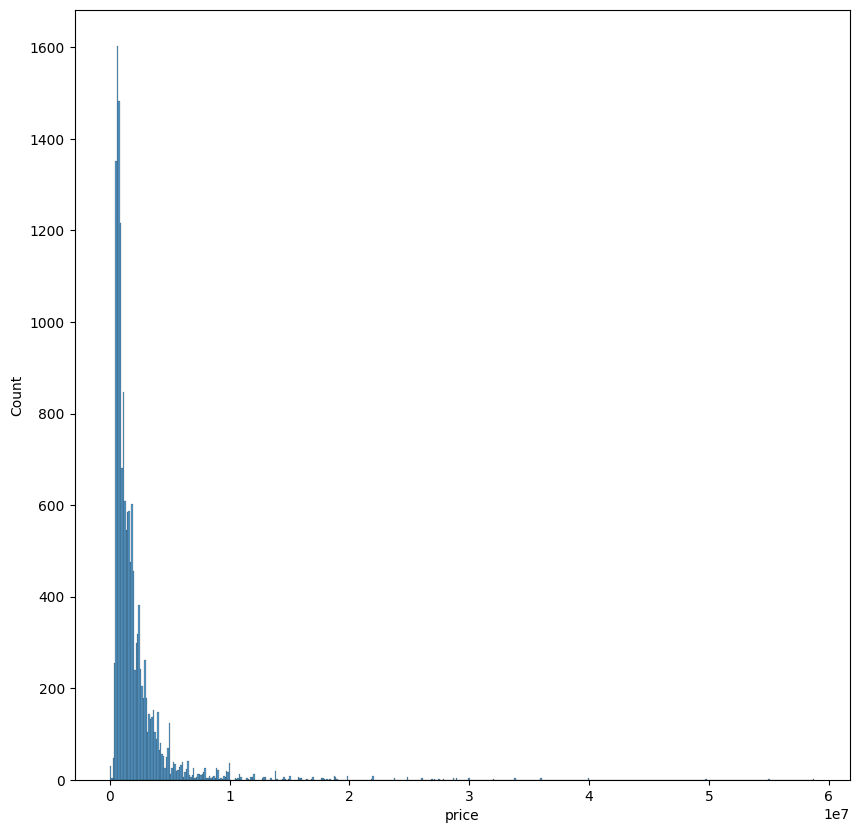

In [ ]:
plt.figure(figsize=(10,10))
sns.histplot(df['price'])
plt.show()

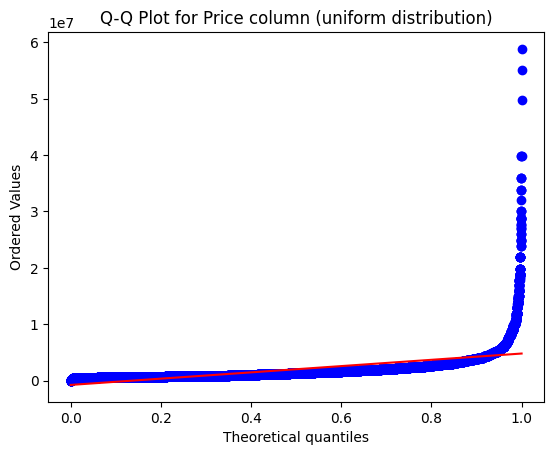

In [ ]:
stats.probplot(df["price"], dist="uniform", plot=plt)
plt.title("Q-Q Plot for Price column (uniform distribution)")
plt.show()

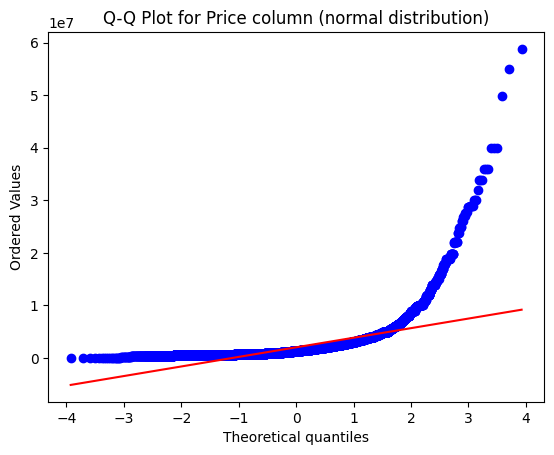

In [ ]:
stats.probplot(df["price"], dist="norm", plot=plt)
plt.title("Q-Q Plot for Price column (normal distribution)")
plt.show()

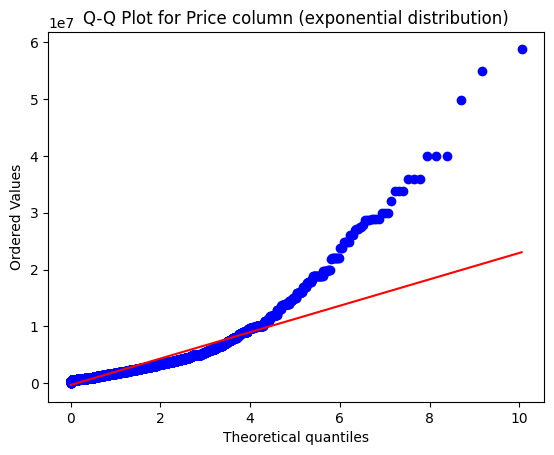

In [ ]:
stats.probplot(df["price"], dist="expon", plot=plt)
plt.title("Q-Q Plot for Price column (exponential distribution)")
plt.show()

In [ ]:
df['City'].value_counts()

,count
City,
VANCOUVER,8932
BURNABY,2880
NORTH VANCOUVER,2022
WEST VANCOUVER,1200
RICHMOND,1062


In [ ]:
municipalities = ['VANCOUVER', 'RICHMOND', 'BURNABY', 'WEST VANCOUVER', 'NORTH VANCOUVER']

summary_data = []

for city in municipalities:
    df_city = df[df['City'] == city]
    prices = df_city['price']

    if len(prices) == 0:
        continue  # Прескокни ако нема податоци

    # IQR метод за откривање outliers
    Q1 = prices.quantile(0.25)
    Q3 = prices.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = prices[(prices < lower_bound) | (prices > upper_bound)]

    summary_data.append({
        'Општина': city,
        'Вкупно имоти': len(prices),
        'Outliers (цена)': len(outliers),
        '% Outliers': round(len(outliers) / len(prices) * 100, 2),
        'Медијана цена': round(prices.median(), 0),
        'Просечна цена': round(prices.mean(), 0),
        'Максимална цена': round(prices.max(), 0),
        'Минимална цена': round(prices.min(), 0)
    })

# Креирање на финална табела
summary_df = pd.DataFrame(summary_data)

# Прикажи ја табелата
summary_df

,Општина,Вкупно имоти,Outliers (цена),% Outliers,Медијана цена,Просечна цена,Максимална цена,Минимална цена
0,VANCOUVER,8932,694,7.77,1358800.0,2041785.0,49800000,2300
1,RICHMOND,1062,73,6.87,964350.0,1288181.0,6888888,3200
2,BURNABY,2880,129,4.48,879000.0,1354194.0,55000000,1700
3,WEST VANCOUVER,1200,100,8.33,3688000.0,4688353.0,58800000,169900
4,NORTH VANCOUVER,2022,63,3.12,1429900.0,1682759.0,13980000,299000


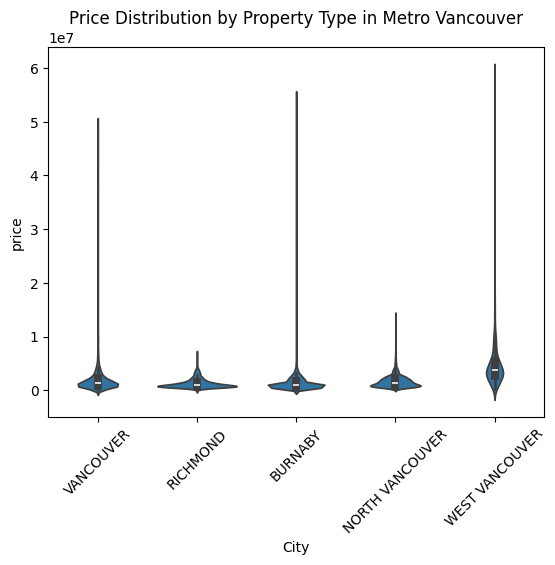

In [ ]:
sns.violinplot(x='City', y='price', data=df)
plt.xticks(rotation=45)
plt.title('Price Distribution by Property Type in Metro Vancouver')
plt.show()

/tmp/ipython-input-32-964637314.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=df, x='City', y='price', jitter=True, palette='Set2')


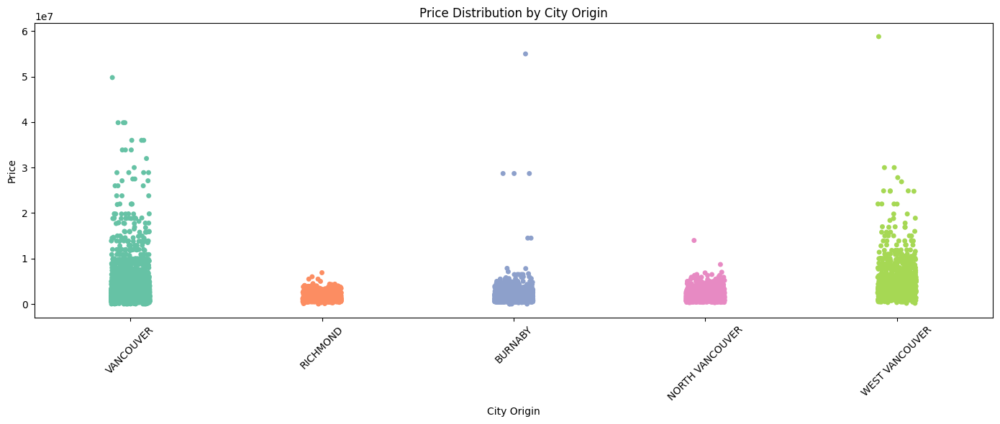

In [ ]:
plt.figure(figsize=(14, 6))
sns.stripplot(data=df, x='City', y='price', jitter=True, palette='Set2')

plt.xticks(rotation=45)
plt.title('Price Distribution by City Origin')
plt.xlabel('City Origin')
plt.ylabel('Price')
plt.tight_layout()
plt.show()

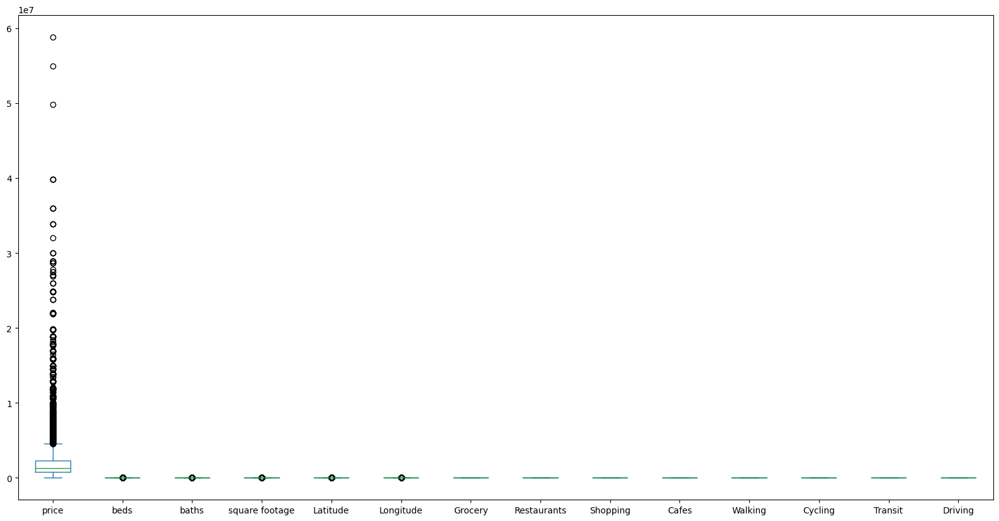

In [ ]:
df.plot.box(figsize=(20,10));
plt.show()

### Vancouver

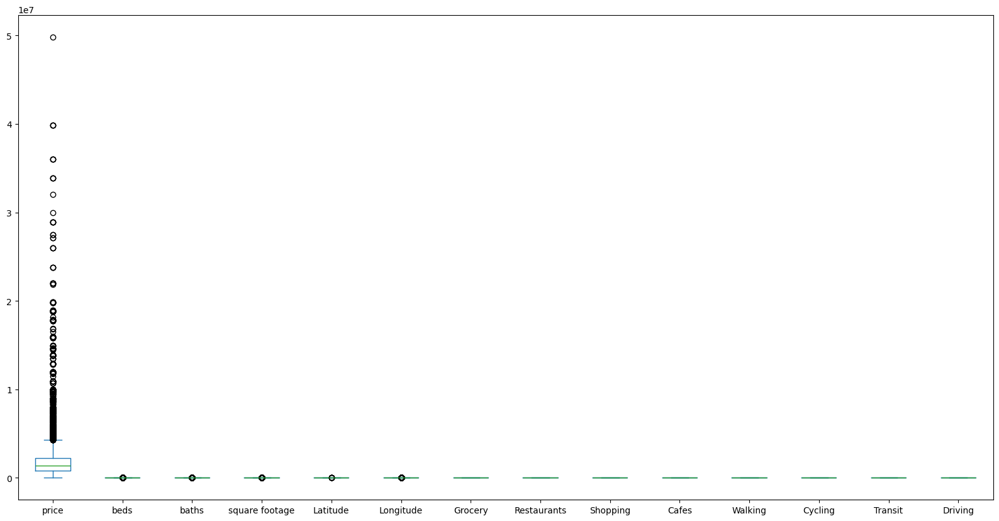

In [ ]:
df_vancouver.plot.box(figsize=(20,10));
plt.show()

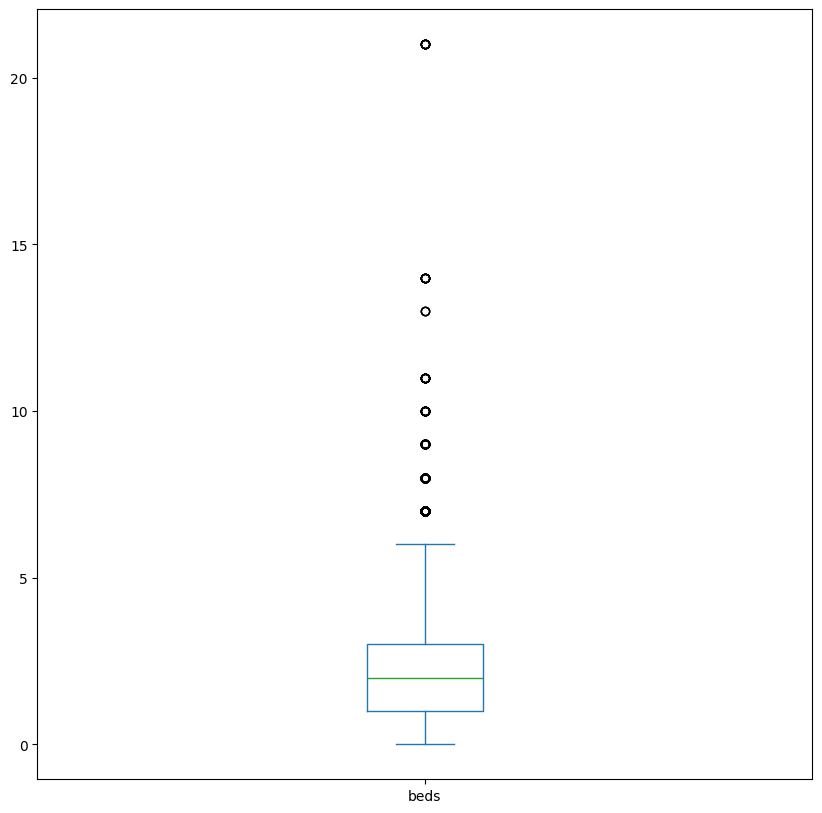

In [ ]:
df_vancouver['beds'].plot.box(figsize=(10,10))
plt.show()

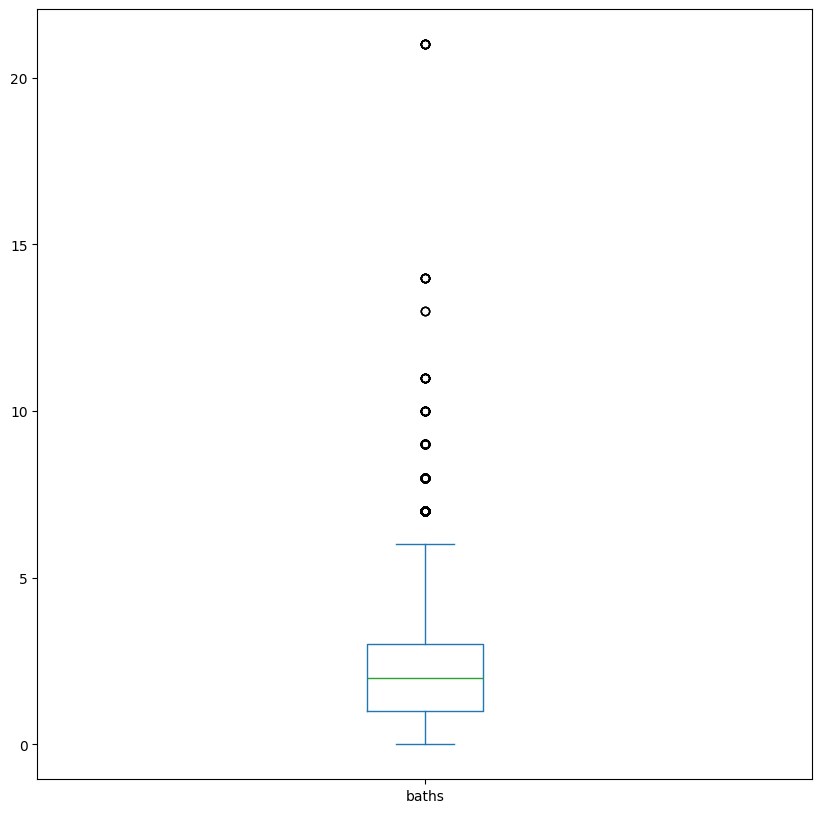

In [ ]:
df_vancouver['baths'].plot.box(figsize=(10,10))
plt.show()

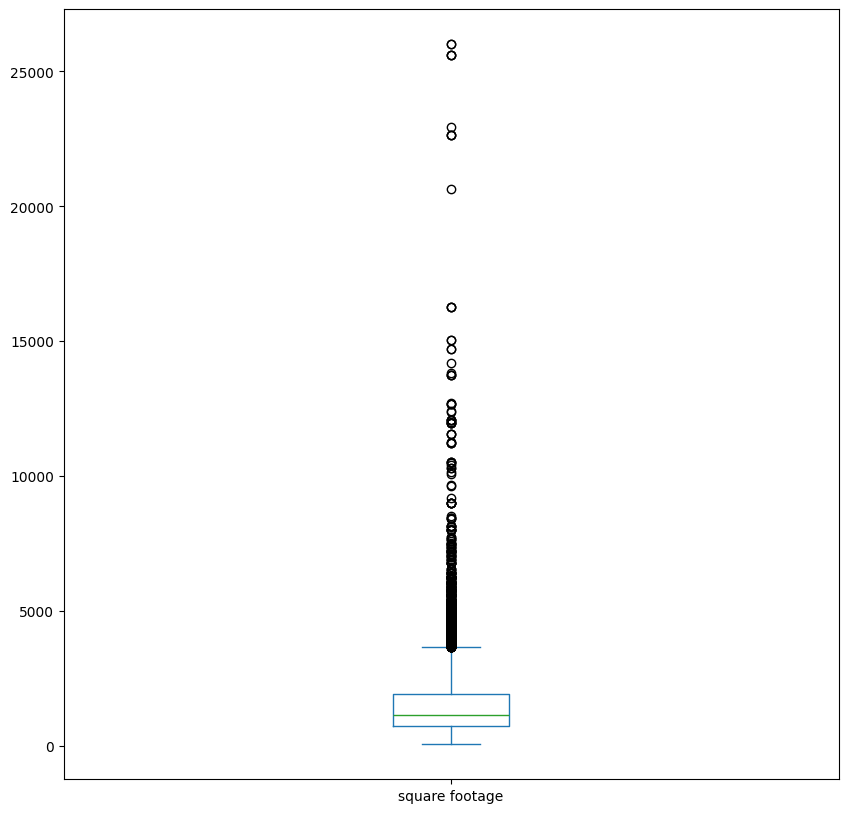

In [ ]:
df_vancouver['square footage'].plot.box(figsize=(10,10))
plt.show()

In [ ]:
df_vancouver = df_vancouver[df_vancouver['square footage']<=7000]
df_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
0,749900,2,2,792.0,condo,49.275734,-123.101635,Electric,Yes,Yes,...,No,9.0,9.3,10.0,8.9,10.0,9.7,10.0,2.6,VANCOUVER
1,1549900,2,2,1110.0,condo,49.274663,-123.112380,Baseboard,Yes,Yes,...,No,9.5,9.3,10.0,8.3,10.0,9.0,9.4,2.5,VANCOUVER
4,1098000,2,2,882.0,condo,49.287694,-123.125721,Electric,Yes,Yes,...,No,8.4,6.1,9.1,8.7,8.4,9.8,10.0,8.8,VANCOUVER
5,1348000,2,2,1078.0,townhouse,49.269413,-123.111259,Electric,Yes,Yes,...,No,8.3,9.0,8.5,7.0,6.4,9.6,7.3,6.3,VANCOUVER
7,449000,0,0,402.0,condo,49.288179,-123.127755,Baseboard,Yes,Yes,...,No,6.1,6.2,9.7,8.6,8.1,8.4,9.1,5.1,VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16301,3000000,5,5,2200.0,house,49.252931,-123.064532,Electric,No,Yes,...,No,7.6,4.6,7.7,8.2,4.7,6.3,8.9,9.9,VANCOUVER
16302,3880000,6,6,1960.0,house,49.262273,-123.046440,Electric,Yes,Yes,...,No,7.1,5.8,7.6,7.9,8.5,5.3,7.1,5.2,VANCOUVER
16304,3350000,6,6,1872.0,house,49.257877,-123.088942,Natural Gas,No,Yes,...,No,5.8,5.0,4.7,5.7,8.6,8.9,9.6,9.6,VANCOUVER
16305,3408888,6,6,3257.0,house,49.257260,-123.128946,Forced Air,No,Yes,...,No,9.7,7.1,8.8,8.4,9.0,6.4,9.6,9.2,VANCOUVER


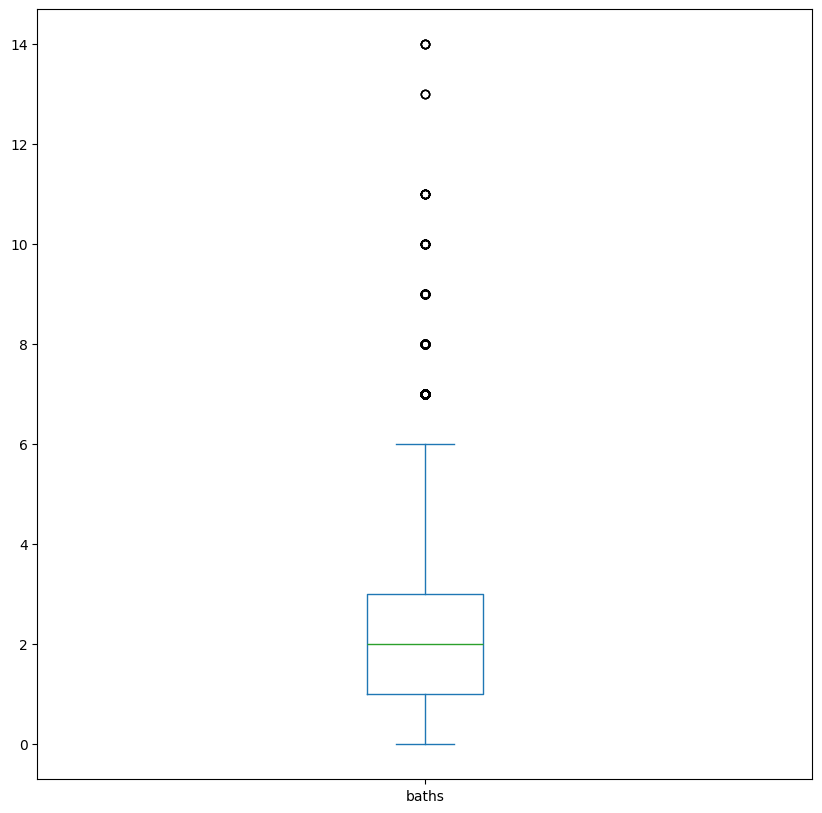

In [ ]:
df_vancouver['baths'].plot.box(figsize=(10,10))
plt.show()

In [ ]:
df_vancouver = df_vancouver[df_vancouver['baths']<=6]
df_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
0,749900,2,2,792.0,condo,49.275734,-123.101635,Electric,Yes,Yes,...,No,9.0,9.3,10.0,8.9,10.0,9.7,10.0,2.6,VANCOUVER
1,1549900,2,2,1110.0,condo,49.274663,-123.112380,Baseboard,Yes,Yes,...,No,9.5,9.3,10.0,8.3,10.0,9.0,9.4,2.5,VANCOUVER
4,1098000,2,2,882.0,condo,49.287694,-123.125721,Electric,Yes,Yes,...,No,8.4,6.1,9.1,8.7,8.4,9.8,10.0,8.8,VANCOUVER
5,1348000,2,2,1078.0,townhouse,49.269413,-123.111259,Electric,Yes,Yes,...,No,8.3,9.0,8.5,7.0,6.4,9.6,7.3,6.3,VANCOUVER
7,449000,0,0,402.0,condo,49.288179,-123.127755,Baseboard,Yes,Yes,...,No,6.1,6.2,9.7,8.6,8.1,8.4,9.1,5.1,VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,4220.0,house,49.252858,-123.130726,Forced Air,Yes,Yes,...,No,4.8,8.1,5.6,6.8,6.3,9.7,4.8,5.6,VANCOUVER
16301,3000000,5,5,2200.0,house,49.252931,-123.064532,Electric,No,Yes,...,No,7.6,4.6,7.7,8.2,4.7,6.3,8.9,9.9,VANCOUVER
16302,3880000,6,6,1960.0,house,49.262273,-123.046440,Electric,Yes,Yes,...,No,7.1,5.8,7.6,7.9,8.5,5.3,7.1,5.2,VANCOUVER
16304,3350000,6,6,1872.0,house,49.257877,-123.088942,Natural Gas,No,Yes,...,No,5.8,5.0,4.7,5.7,8.6,8.9,9.6,9.6,VANCOUVER


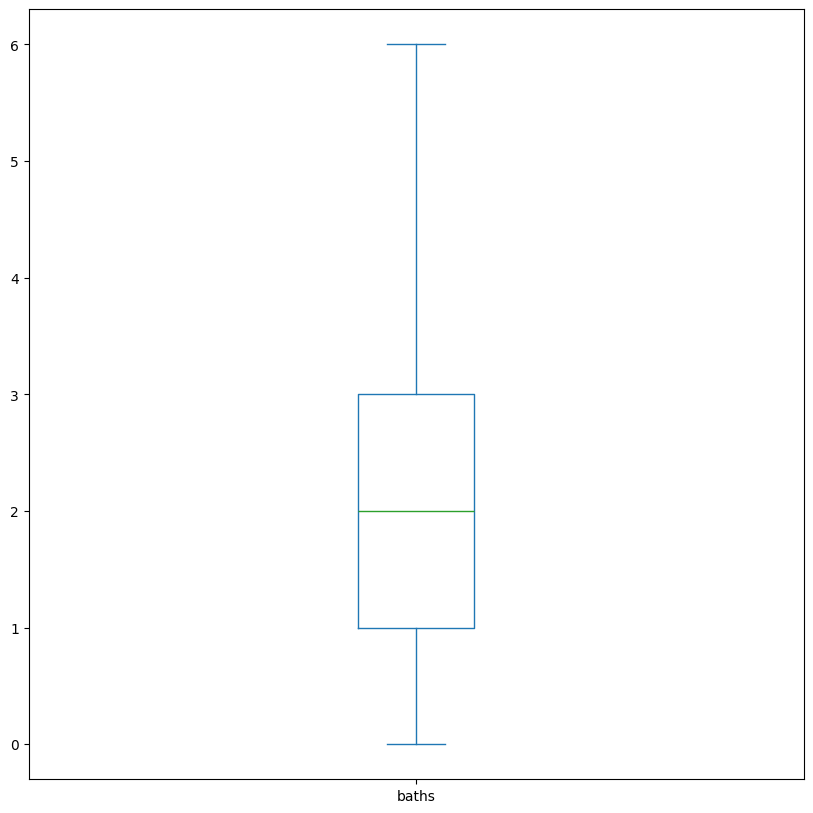

In [ ]:
df_vancouver['baths'].plot.box(figsize=(10,10))
plt.show()

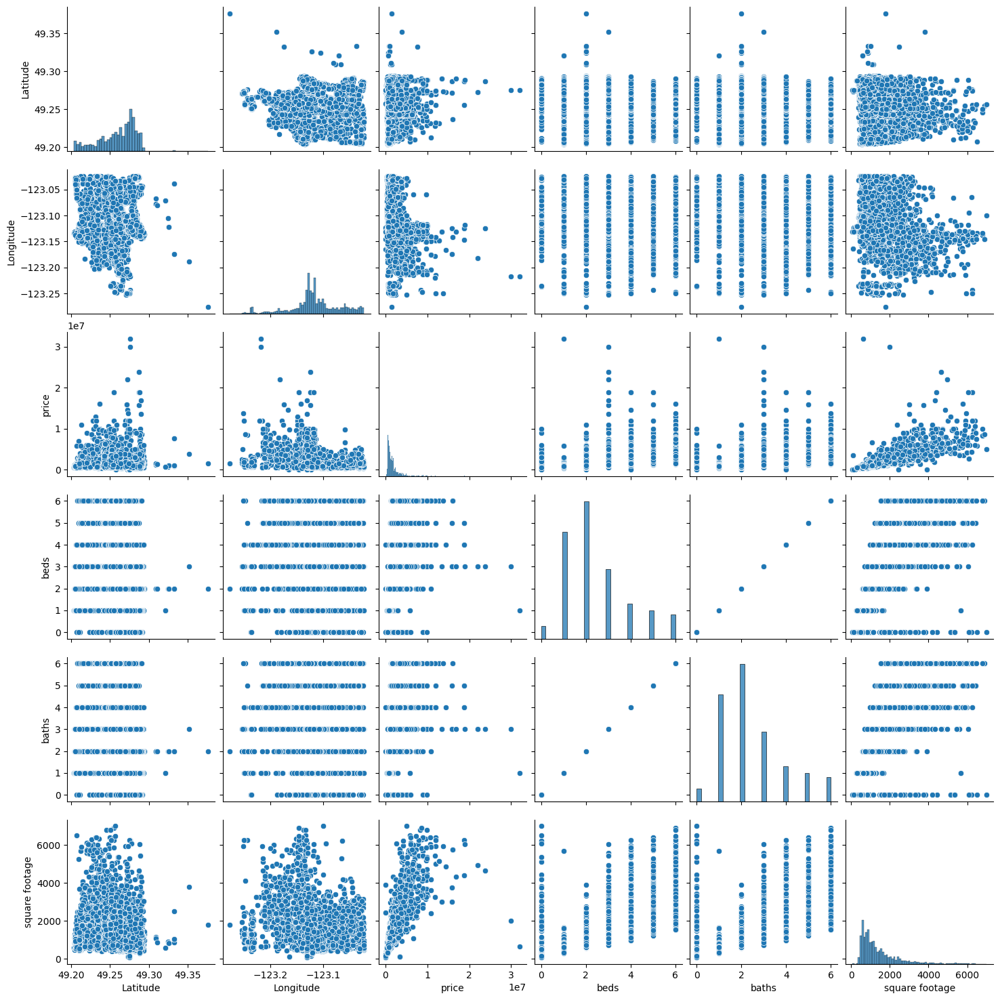

In [ ]:
plot = sns.pairplot(df_vancouver[['Latitude','Longitude','price','beds','baths','square footage']])
plot.savefig('pairplot_vancouver.png', dpi=300, bbox_inches='tight')

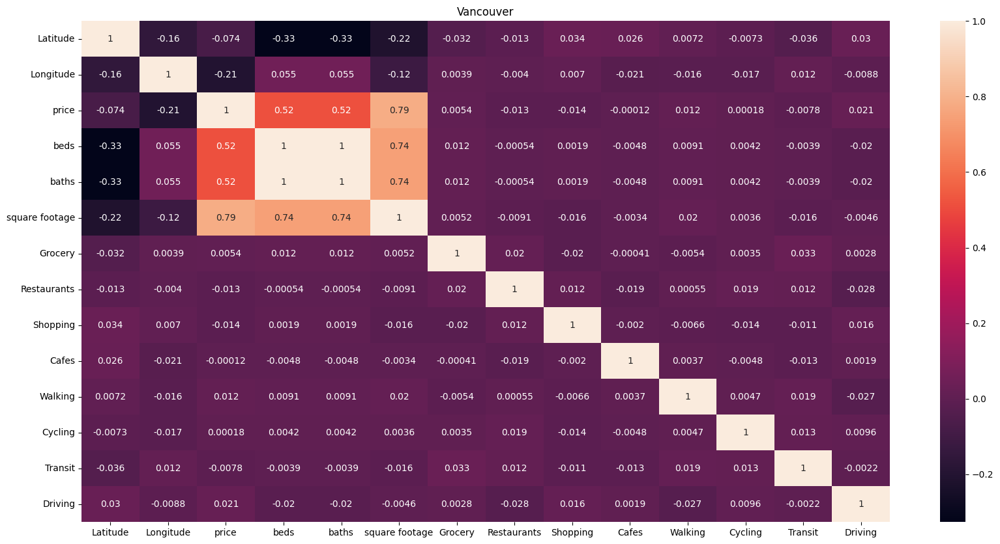

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df_vancouver[['Latitude','Longitude','price','beds','baths','square footage','Grocery','Restaurants','Shopping','Cafes','Walking','Cycling','Transit','Driving']]
            .corr(),annot=True)
plt.title('Vancouver')
plt.show()

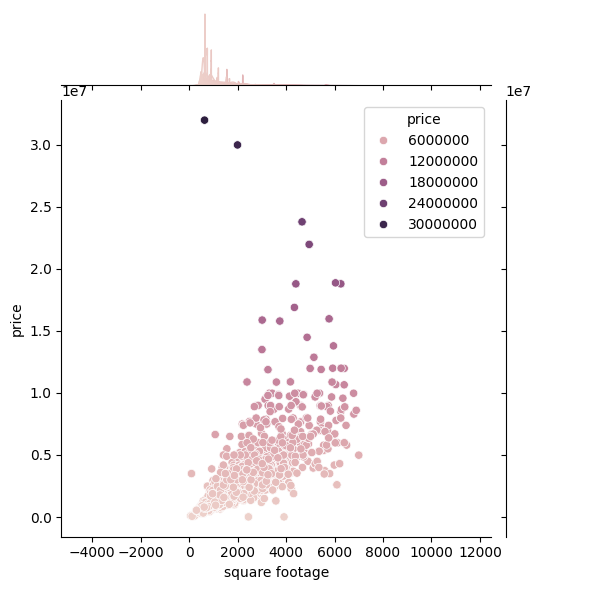

In [ ]:
sns.jointplot(x=df_vancouver['square footage'],y=df_vancouver['price'],hue=df_vancouver['price'])

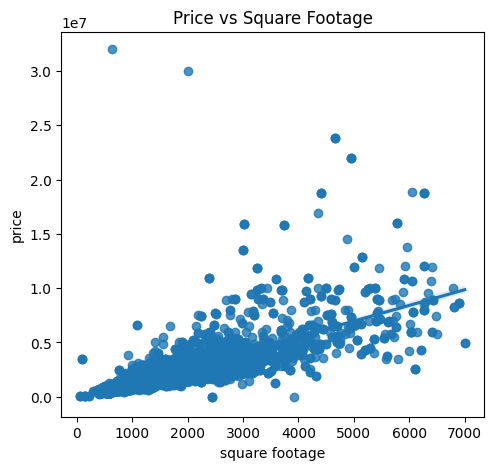

In [ ]:
plt.figure(figsize=(12, 5))

# Првиот subplot: Bore vs Engine-size
plt.subplot(1, 2, 1)
sns.regplot(data=df_vancouver, x='square footage', y='price')
plt.title('Price vs Square Footage')
plt.show()

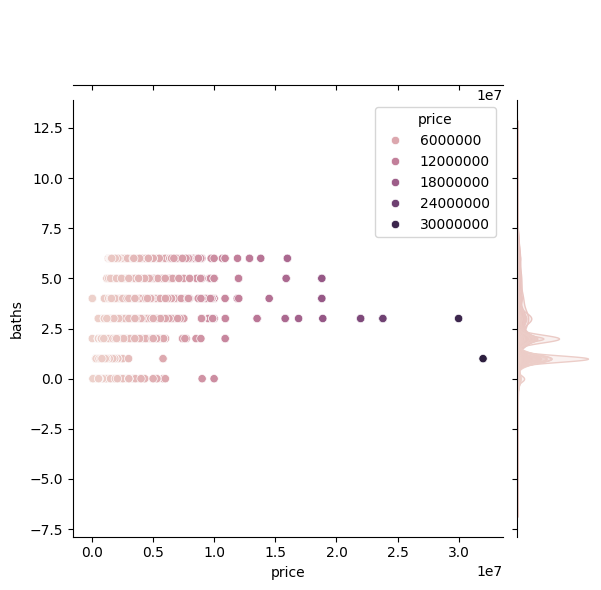

In [ ]:
sns.jointplot(x=df_vancouver['price'],y=df_vancouver['baths'],hue=df_vancouver['price'])

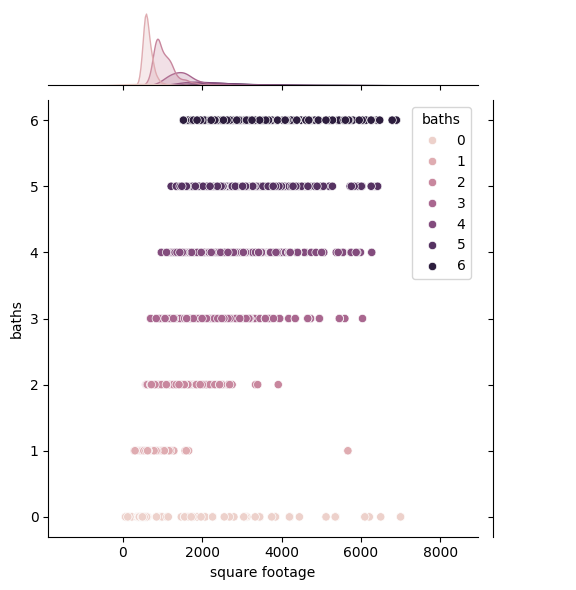

In [ ]:
sns.jointplot(x=df_vancouver['square footage'],y=df_vancouver['baths'],hue=df_vancouver['baths'])

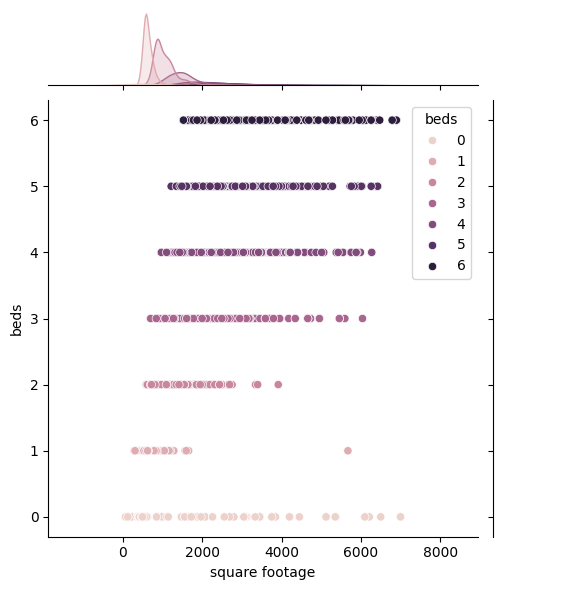

In [ ]:
sns.jointplot(x=df_vancouver['square footage'],y=df_vancouver['beds'],hue=df_vancouver['beds'])

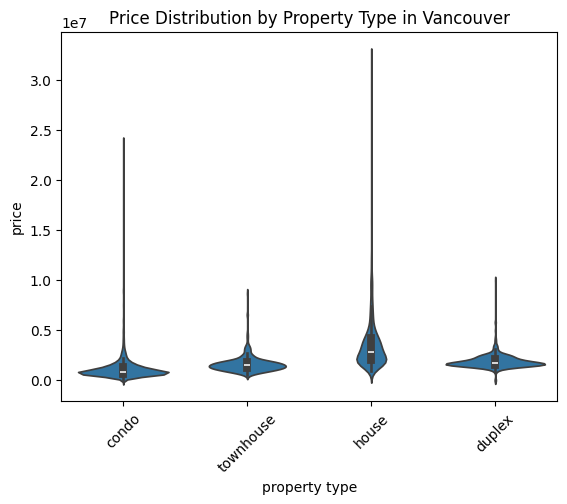

In [ ]:
sns.violinplot(x='property type', y='price', data=df_vancouver)
plt.xticks(rotation=45)
plt.title('Price Distribution by Property Type in Vancouver')
plt.show()

### Burnaby

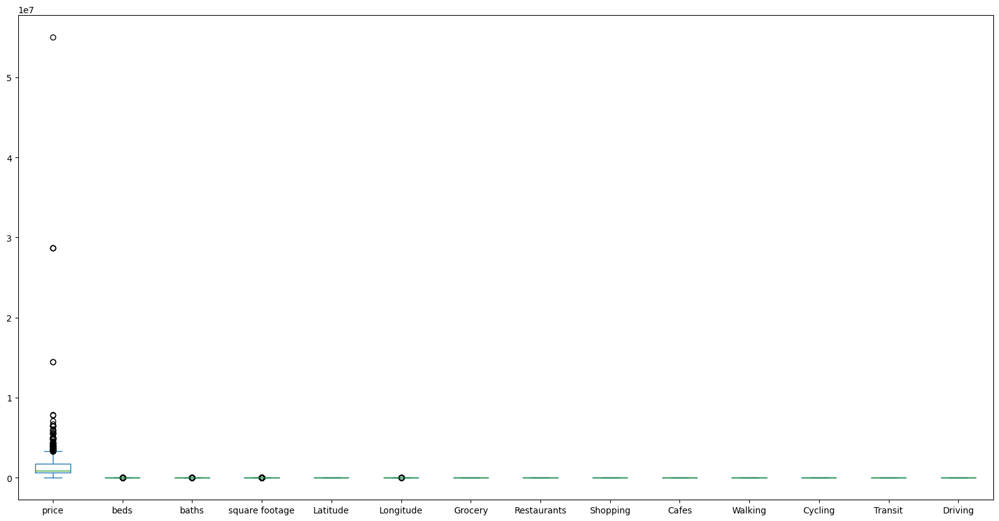

In [ ]:
df_burnaby.plot.box(figsize=(20,10));
plt.show()

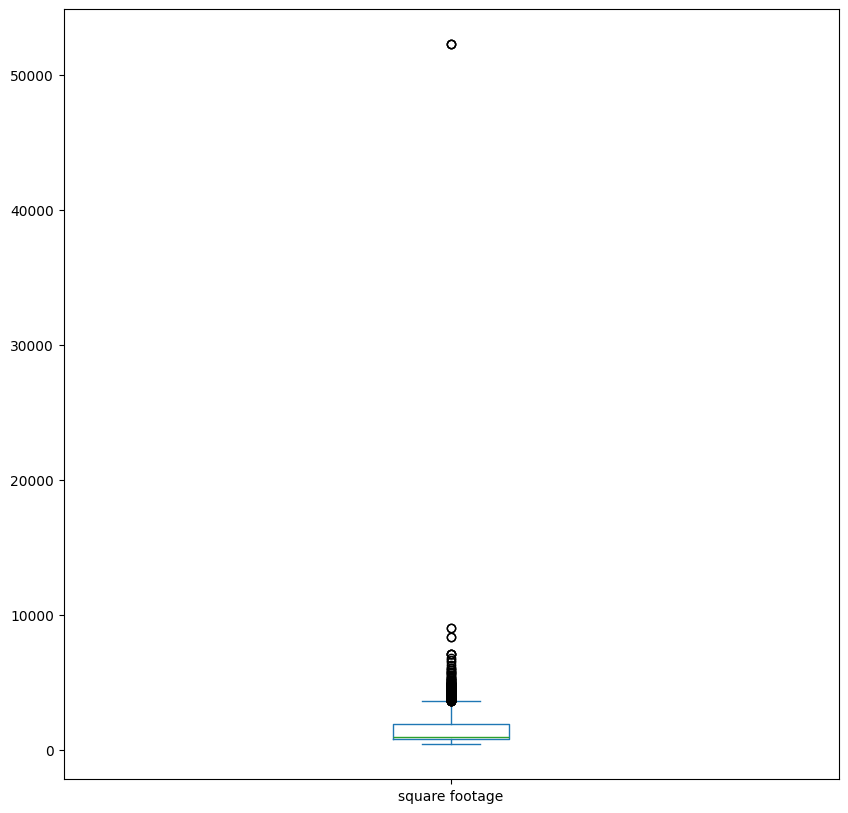

In [ ]:
df_burnaby['square footage'].plot.box(figsize=(10,10))
plt.show()

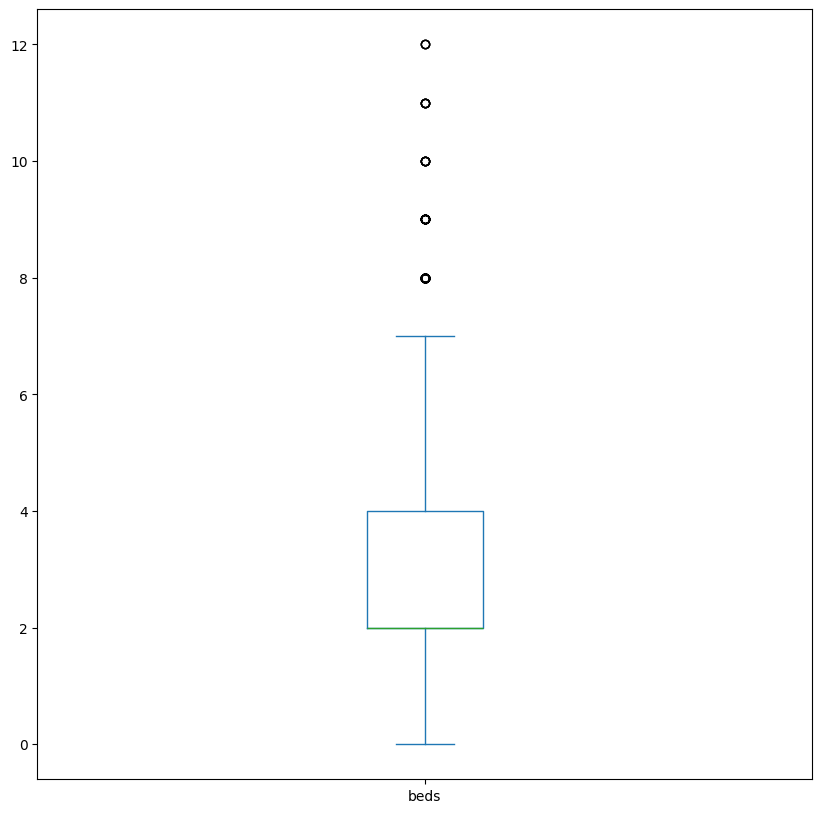

In [ ]:
df_burnaby['beds'].plot.box(figsize=(10,10))
plt.show()

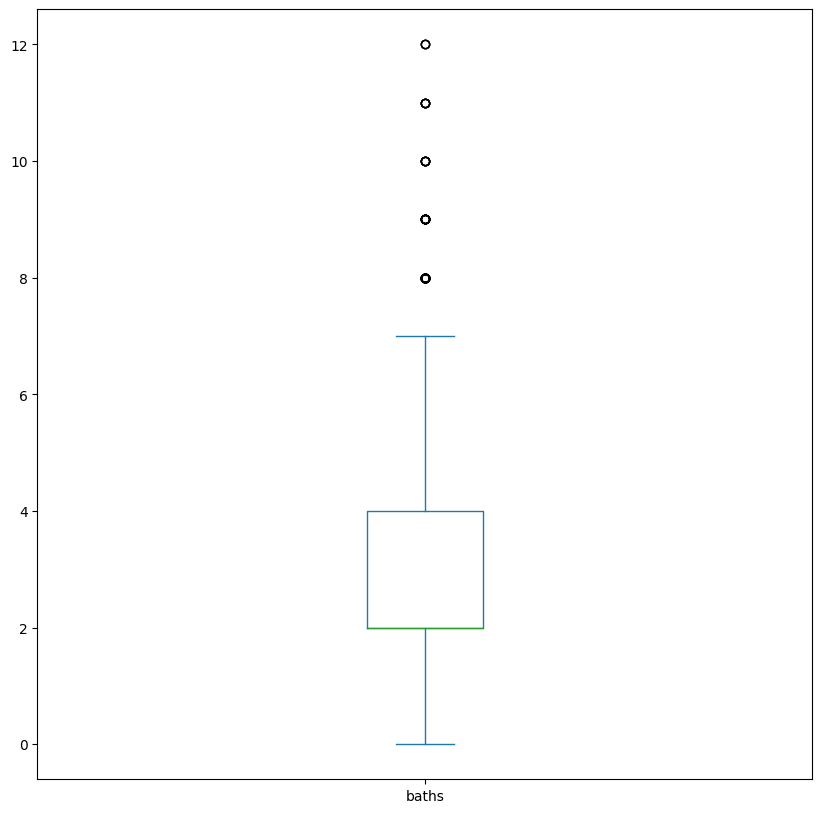

In [ ]:
df_burnaby['baths'].plot.box(figsize=(10,10))
plt.show()

In [ ]:
df_burnaby = df_burnaby[df_burnaby['square footage']<=7000]
df_burnaby

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
3,2388000,5,5,2324.0,house,49.235092,-123.006441,Forced Air,Yes,Yes,...,No,8.7,6.2,8.1,5.5,6.8,6.1,7.3,6.5,BURNABY
11,725000,2,2,1228.0,condo,49.224460,-122.989907,Baseboard,Yes,Yes,...,No,6.9,6.6,7.3,7.1,8.8,5.5,8.7,7.8,BURNABY
15,829000,3,3,973.0,condo,49.210263,-122.953027,Baseboard,Yes,Yes,...,No,8.1,6.9,5.5,8.9,5.7,6.8,6.0,9.9,BURNABY
16,938800,2,2,1042.0,condo,49.265877,-123.008050,Baseboard,Yes,Yes,...,No,9.7,5.3,8.4,4.7,6.9,8.3,6.3,6.7,BURNABY
17,968000,2,2,976.0,condo,49.225111,-123.004010,Electric,Yes,Yes,...,No,5.1,10.0,6.4,9.1,5.0,4.9,5.2,7.0,BURNABY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,797.0,condo,49.263236,-122.998963,Heat Pump,Yes,Yes,...,No,8.1,4.7,6.7,8.3,7.7,7.8,9.3,8.1,BURNABY
16222,1568000,3,3,1212.0,condo,49.263247,-123.003660,Heat Pump,Yes,Yes,...,No,6.1,9.6,7.4,9.4,5.0,6.7,6.2,9.1,BURNABY
16243,968888,1,1,531.0,condo,49.266649,-123.000654,Electric,Yes,Yes,...,No,7.4,5.8,8.0,7.3,6.1,5.2,7.5,5.8,BURNABY
16244,968888,1,1,531.0,condo,49.266649,-123.000654,Electric,Yes,Yes,...,No,9.4,7.5,6.1,5.4,8.0,7.3,6.5,8.3,BURNABY


In [ ]:
df_burnaby = df_burnaby[(df_burnaby['baths'] <= 3) & (df_burnaby['baths'] > 0)]

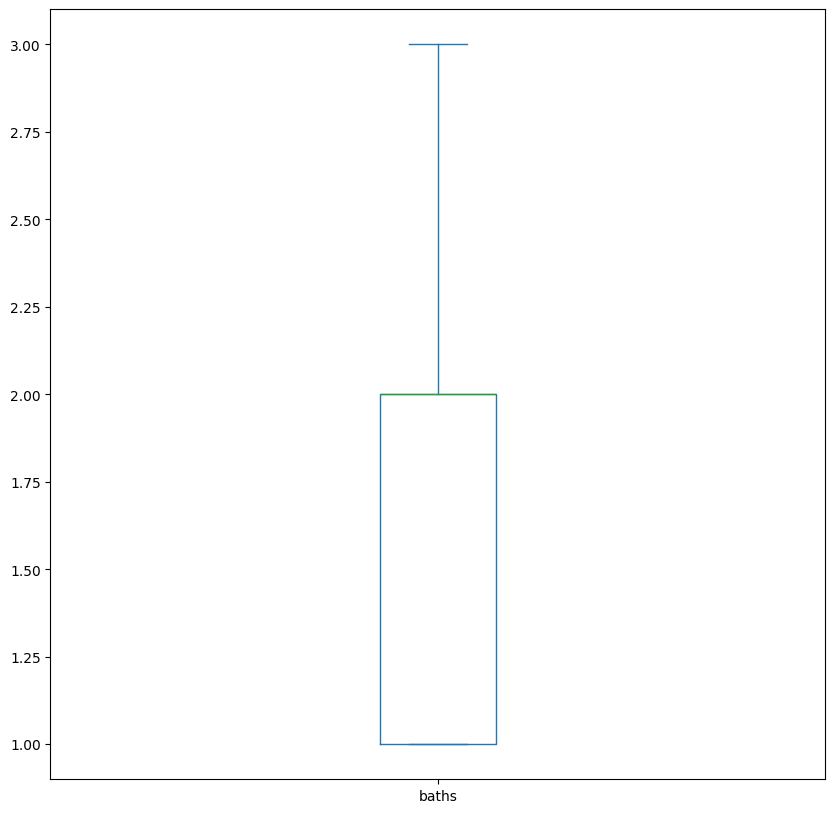

In [ ]:
df_burnaby['baths'].plot.box(figsize=(10,10))
plt.show()

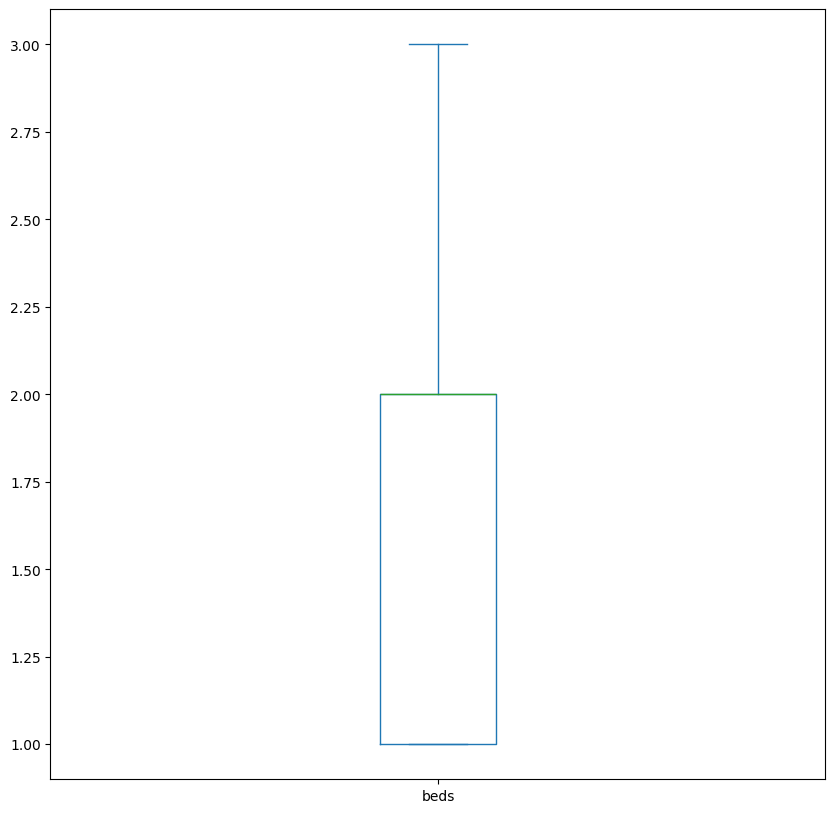

In [ ]:
df_burnaby['beds'].plot.box(figsize=(10,10))
plt.show()

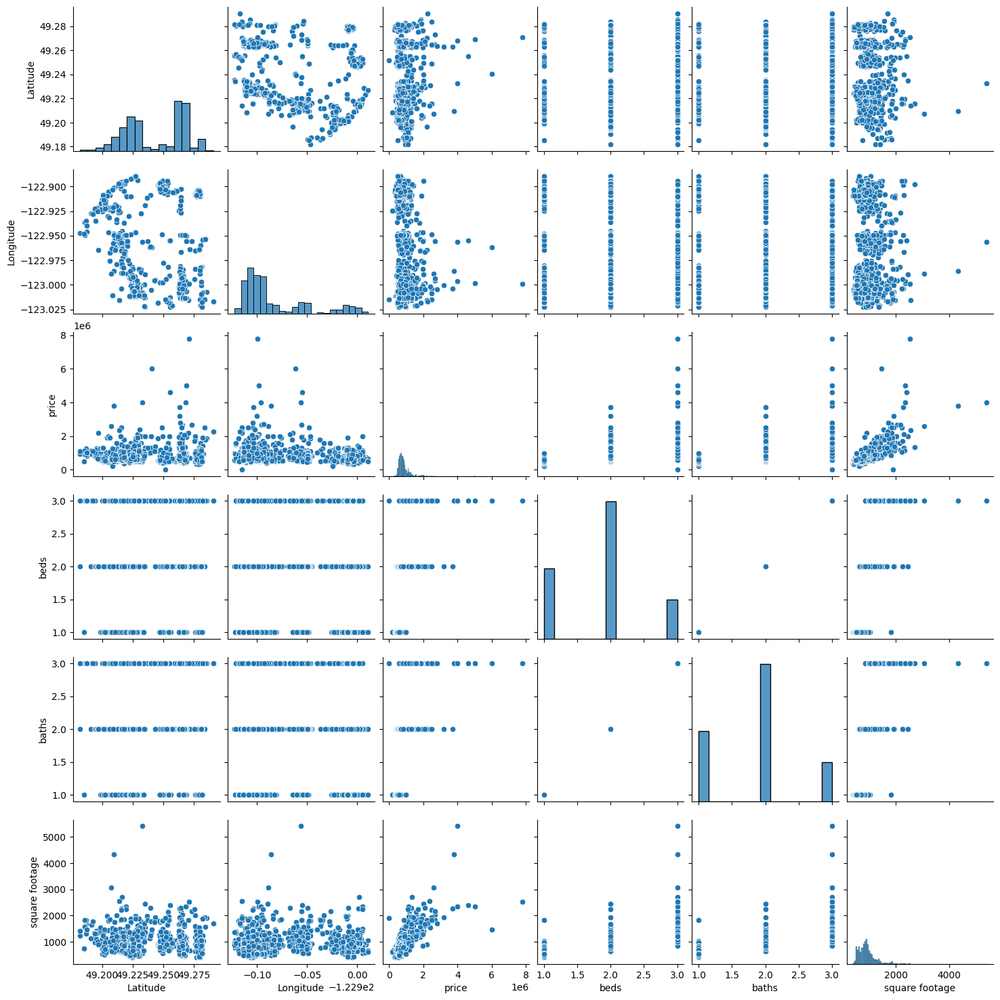

In [ ]:
sns.pairplot(df_burnaby[['Latitude','Longitude','price','beds','baths','square footage']])
plot.savefig('pairplot_burnaby.png', dpi=300, bbox_inches='tight')

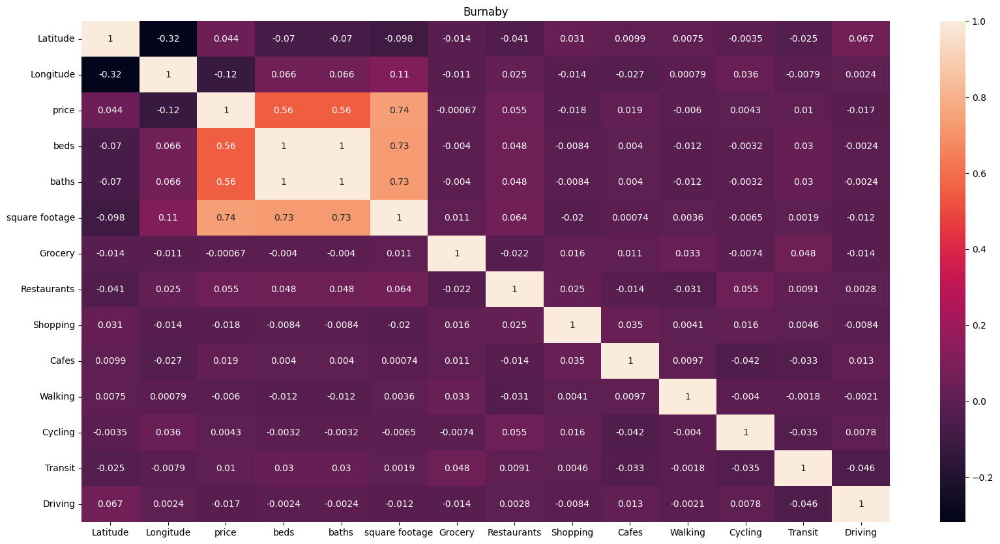

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df_burnaby[['Latitude','Longitude','price','beds','baths','square footage','Grocery','Restaurants','Shopping','Cafes','Walking','Cycling','Transit','Driving']]
            .corr(),annot=True)
plt.title('Burnaby')
plt.show()

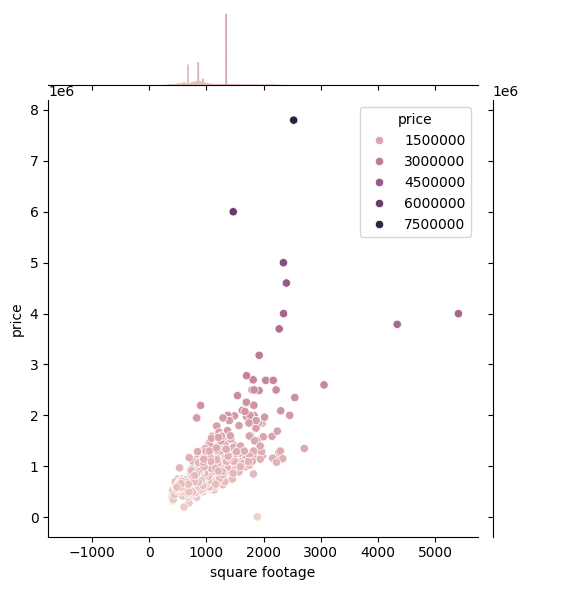

In [ ]:
sns.jointplot(x=df_burnaby['square footage'],y=df_burnaby['price'],hue=df_burnaby['price'])

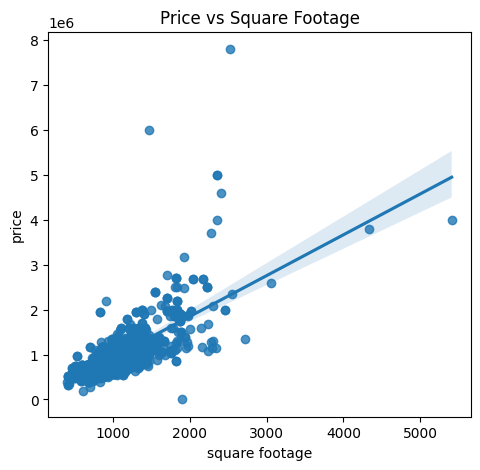

In [ ]:
plt.figure(figsize=(12, 5))

# Првиот subplot: Bore vs Engine-size
plt.subplot(1, 2, 1)
sns.regplot(data=df_burnaby, x='square footage', y='price')
plt.title('Price vs Square Footage')
plt.show()

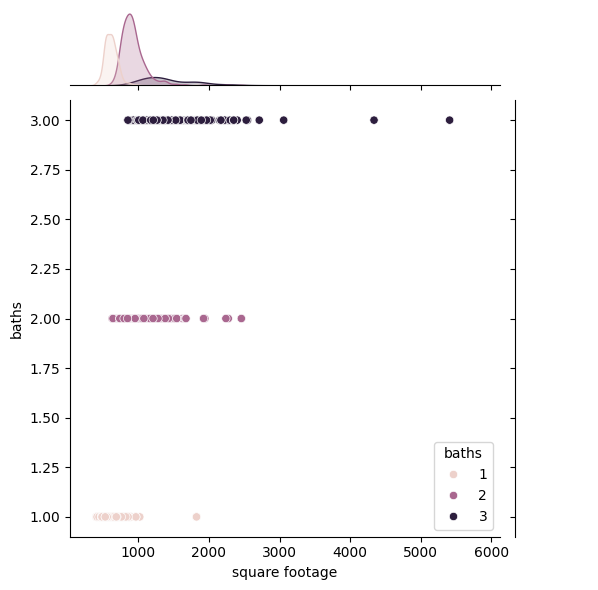

In [ ]:
sns.jointplot(x=df_burnaby['square footage'],y=df_burnaby['baths'],hue=df_burnaby['baths'])

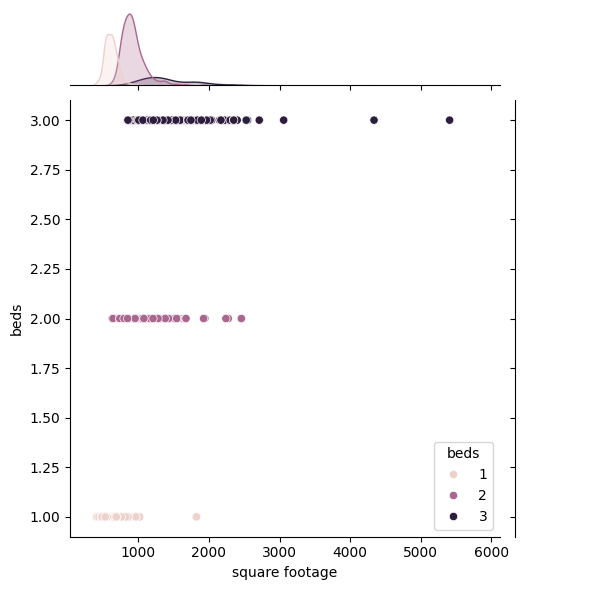

In [ ]:
sns.jointplot(x=df_burnaby['square footage'],y=df_burnaby['beds'],hue=df_burnaby['beds'])

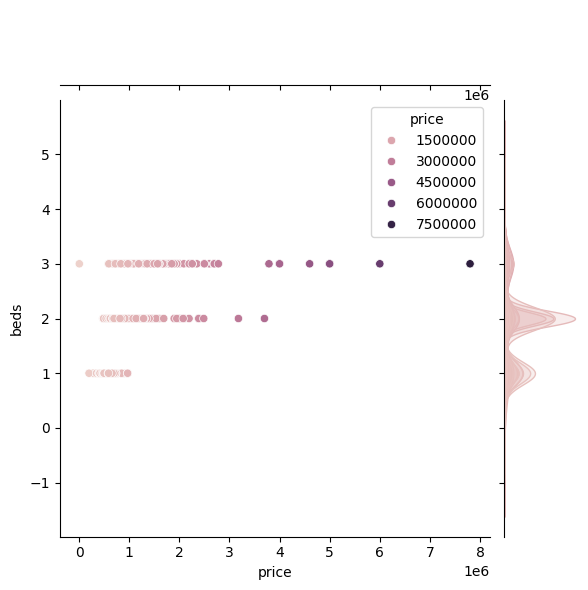

In [ ]:
sns.jointplot(x=df_burnaby['price'],y=df_burnaby['beds'],hue=df_burnaby['price'])

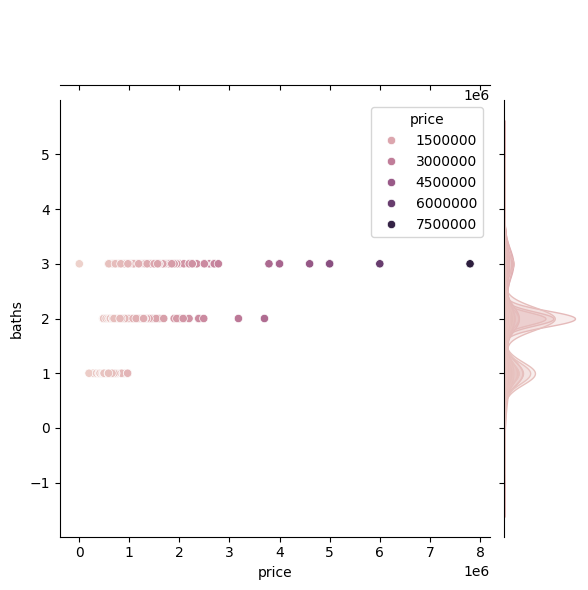

In [ ]:
sns.jointplot(x=df_burnaby['price'],y=df_burnaby['baths'],hue=df_burnaby['price'])

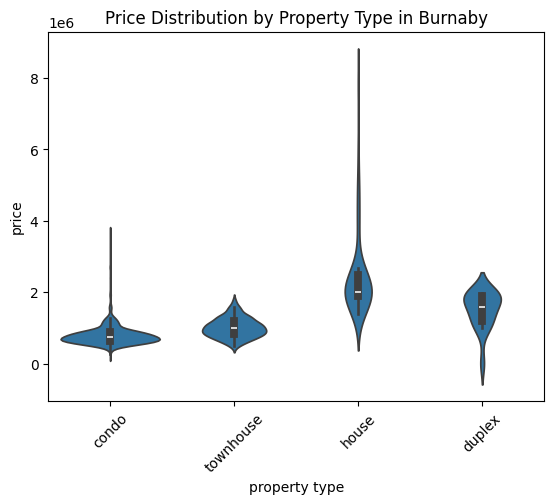

In [ ]:
sns.violinplot(x='property type', y='price', data=df_burnaby)
plt.xticks(rotation=45)
plt.title('Price Distribution by Property Type in Burnaby')
plt.show()

### Richmond

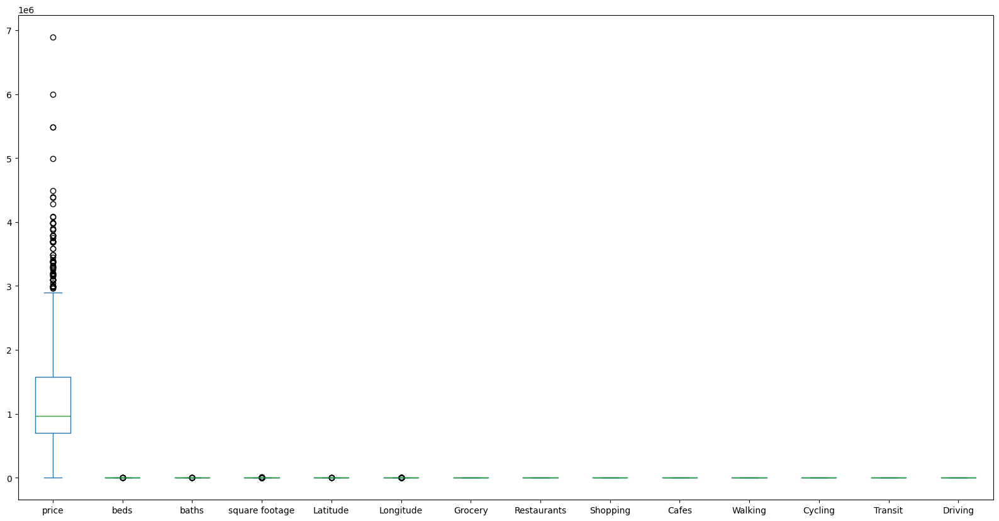

In [ ]:
df_richmond.plot.box(figsize=(20,10));
plt.show()

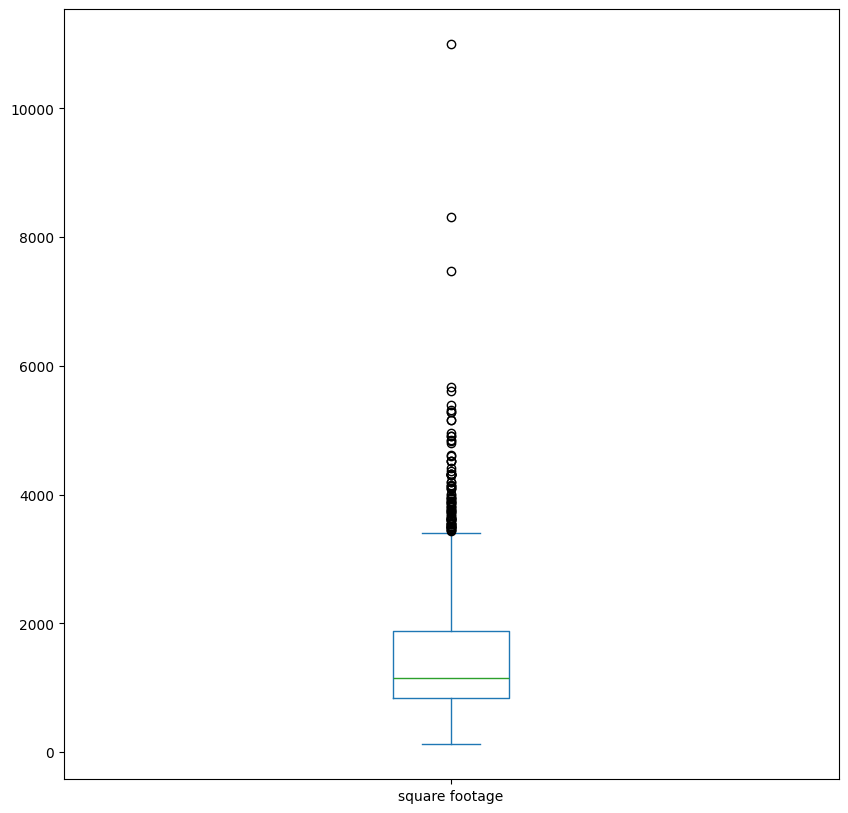

In [ ]:
df_richmond['square footage'].plot.box(figsize=(10,10))
plt.show()

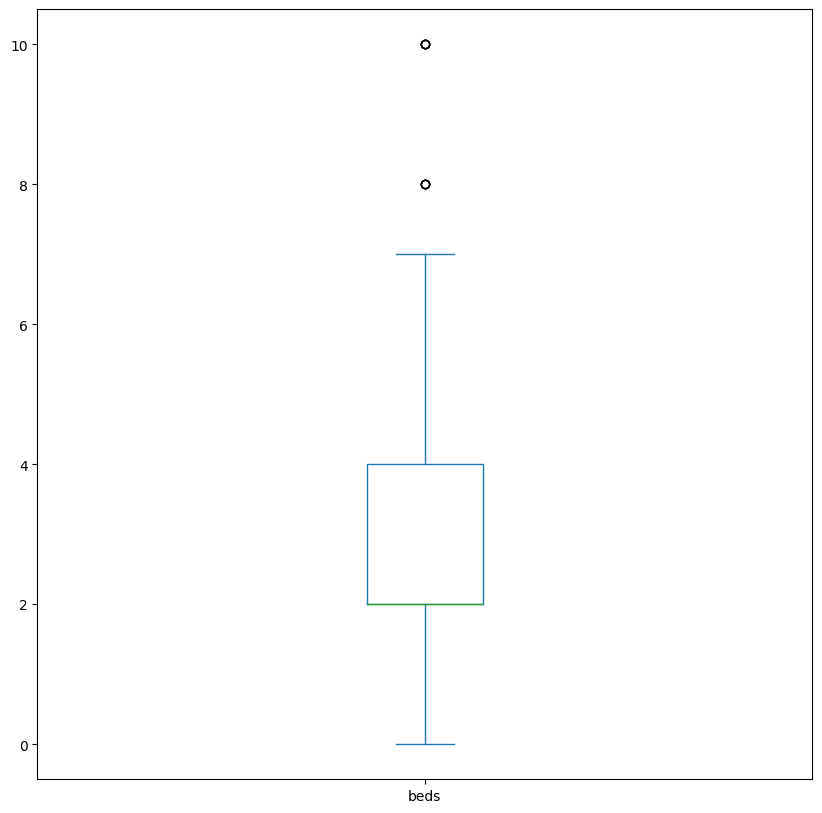

In [ ]:
df_richmond['beds'].plot.box(figsize=(10,10))
plt.show()

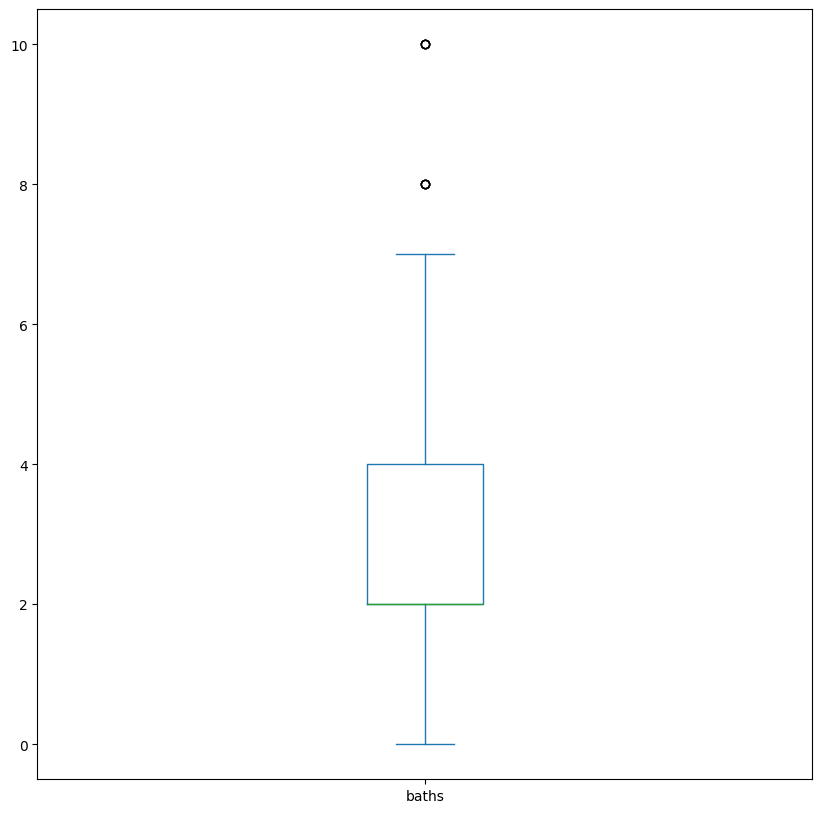

In [ ]:
df_richmond['baths'].plot.box(figsize=(10,10))
plt.show()

In [ ]:
df_richmond = df_richmond[df_richmond['square footage']<=6000]
df_richmond

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
2,650000,2,2,732.0,condo,49.179185,-123.120570,Geothermal,Yes,Yes,...,No,9.5,6.9,8.1,4.5,7.2,6.9,4.9,7.3,RICHMOND
19,3690000,3,3,2045.0,condo,49.176185,-123.147197,Heat Pump,Yes,Yes,...,No,8.0,8.4,5.3,4.6,9.6,9.9,5.6,9.6,RICHMOND
54,599900,1,1,738.0,condo,49.175680,-123.125519,Electric,Yes,Yes,...,No,5.3,9.5,5.0,4.7,7.7,8.0,8.4,4.0,RICHMOND
67,1395000,4,4,1679.0,townhouse,49.177802,-123.096142,Forced Air,Yes,Yes,...,No,8.5,6.0,8.6,4.3,5.4,6.2,6.7,3.8,RICHMOND
68,1388000,2,2,1068.0,condo,49.176548,-123.148416,Forced Air,Yes,Yes,...,No,5.1,9.4,6.6,8.4,8.4,4.8,8.0,9.5,RICHMOND
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,1040.0,condo,49.175504,-123.148569,Heat Pump,Yes,Yes,...,No,5.6,5.6,4.8,8.8,4.6,5.9,5.3,9.9,RICHMOND
10095,2780000,4,4,4370.0,house,49.154923,-123.146758,Baseboard,Yes,Yes,...,No,7.8,6.1,9.4,9.7,5.2,6.7,8.0,7.3,RICHMOND
10096,2599000,5,5,3952.0,house,49.144139,-123.097768,Radiant,Yes,Yes,...,No,8.3,8.6,8.5,6.0,5.8,9.4,6.9,8.3,RICHMOND
10098,769900,2,2,1070.0,townhouse,49.195527,-123.114621,Electric,Yes,Yes,...,No,5.3,5.3,4.5,8.2,9.5,5.0,5.7,7.6,RICHMOND


In [ ]:
df_richmond = df_richmond[df_richmond['baths']<=5]

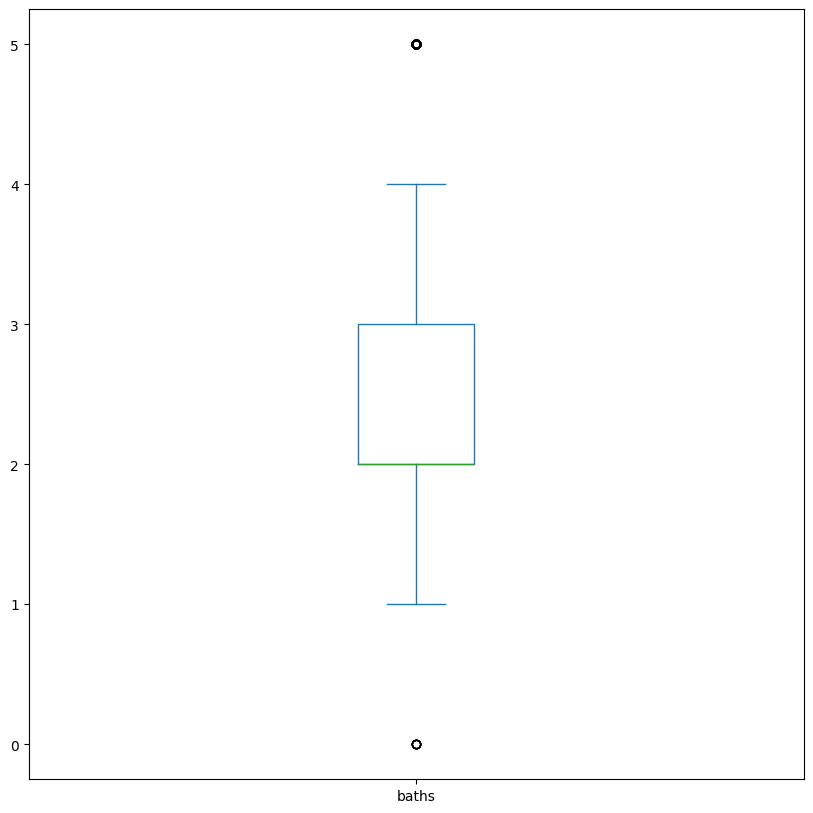

In [ ]:
df_richmond['baths'].plot.box(figsize=(10,10))
plt.show()

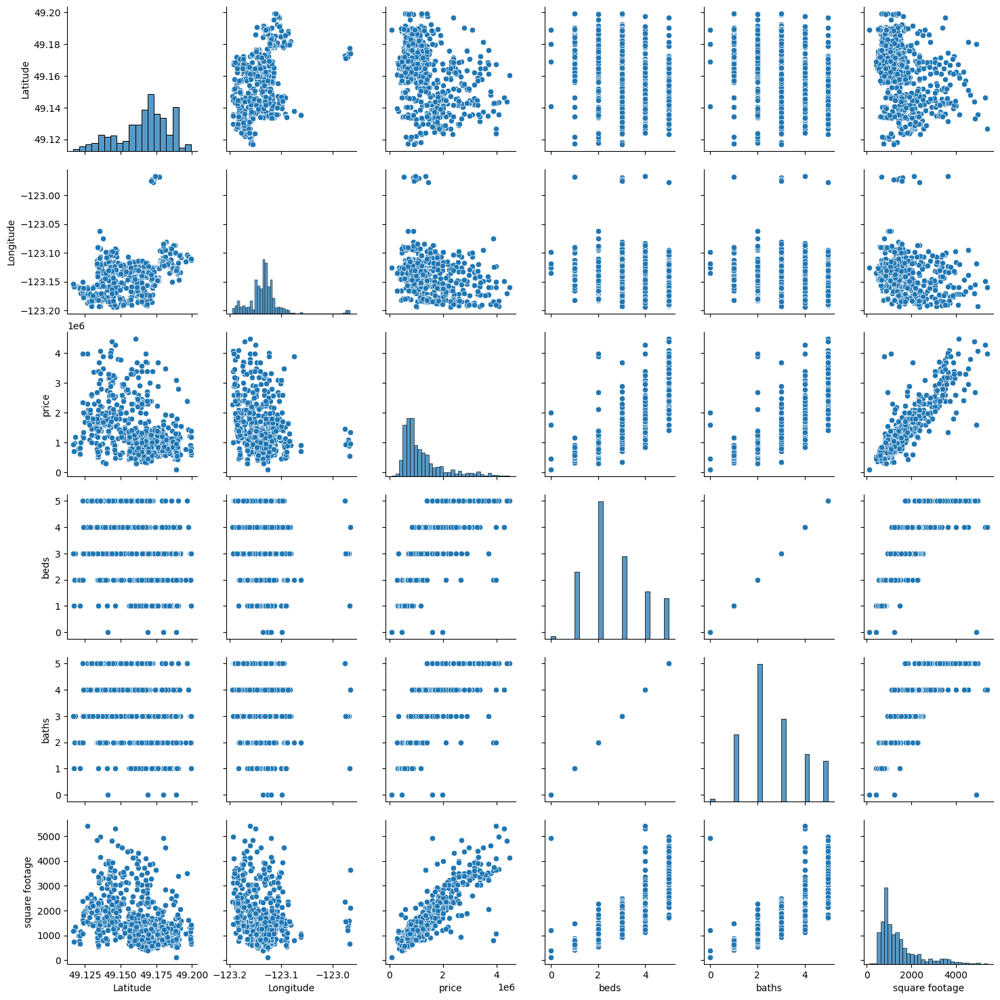

In [ ]:
sns.pairplot(df_richmond[['Latitude','Longitude','price','beds','baths','square footage']])

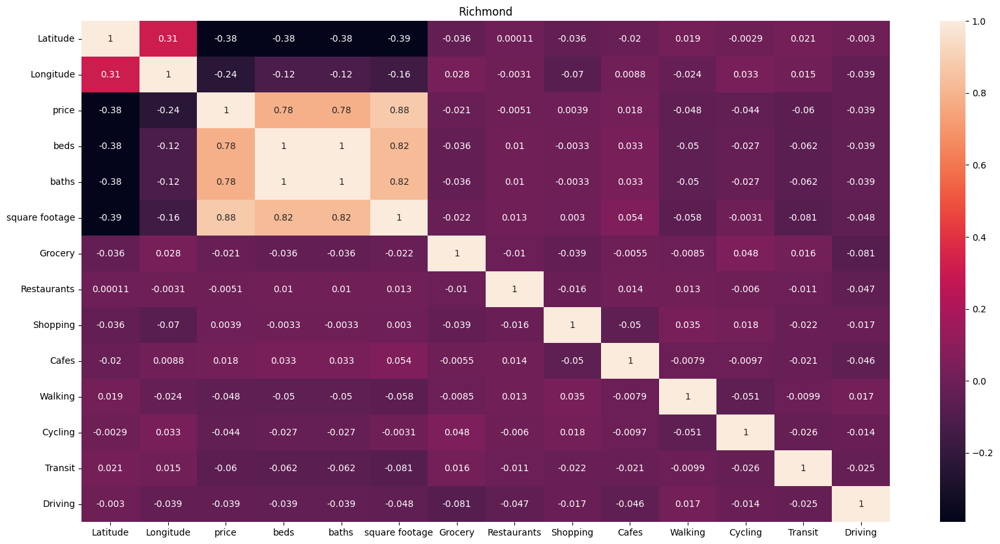

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df_richmond[['Latitude','Longitude','price','beds','baths','square footage','Grocery','Restaurants','Shopping','Cafes','Walking','Cycling','Transit','Driving']]
            .corr(),annot=True)
plt.title('Richmond')
plt.show()


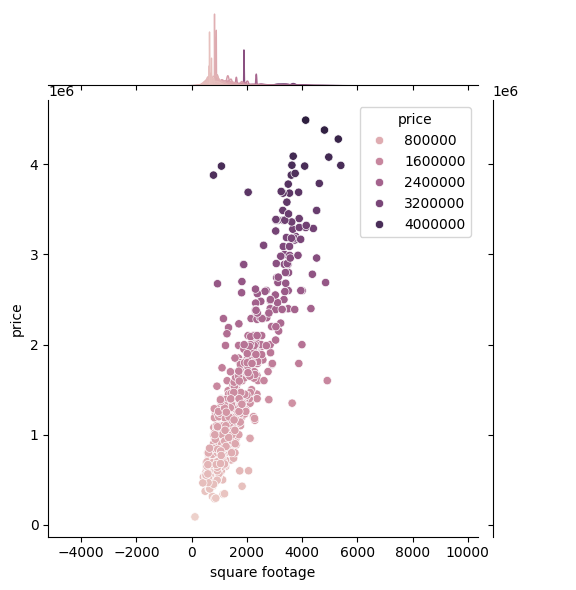

In [ ]:
sns.jointplot(x=df_richmond['square footage'],y=df_richmond['price'],hue=df_richmond['price'])

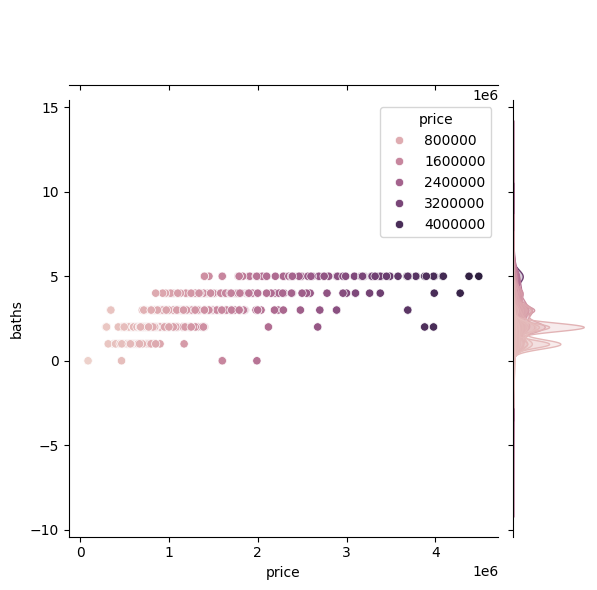

In [ ]:
sns.jointplot(x=df_richmond['price'],y=df_richmond['baths'],hue=df_richmond['price'])

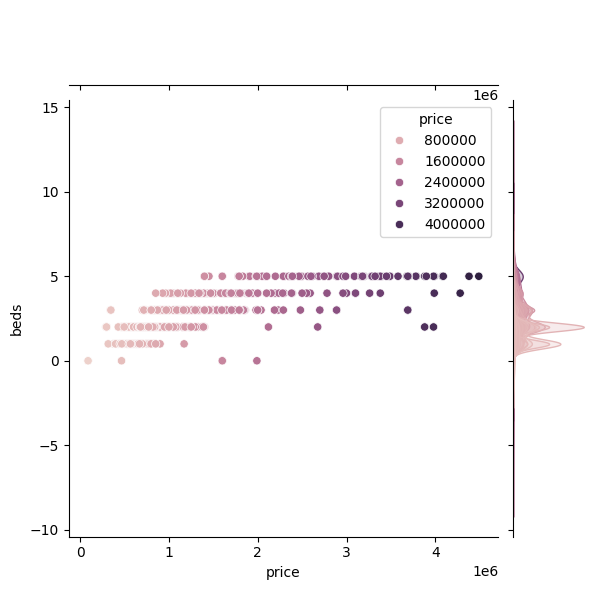

In [ ]:
sns.jointplot(x=df_richmond['price'],y=df_richmond['beds'],hue=df_richmond['price'])

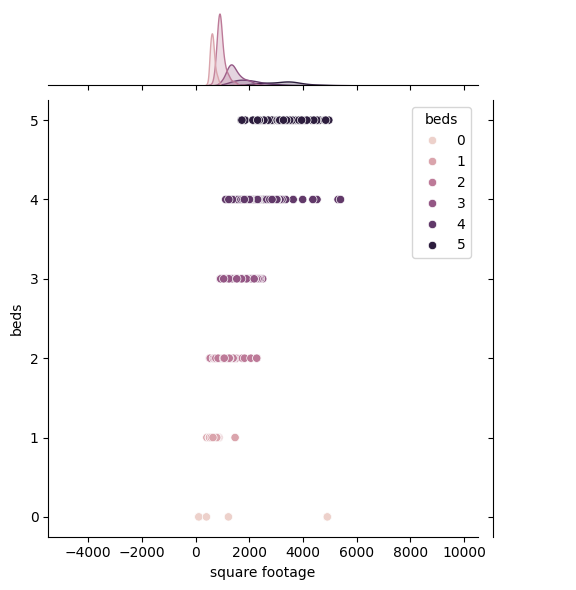

In [ ]:
sns.jointplot(x=df_richmond['square footage'],y=df_richmond['beds'],hue=df_richmond['beds'])

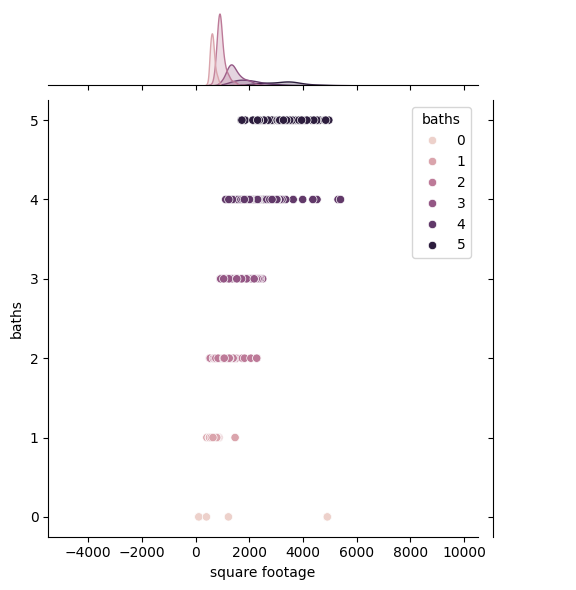

In [ ]:
sns.jointplot(x=df_richmond['square footage'],y=df_richmond['baths'],hue=df_richmond['baths'])

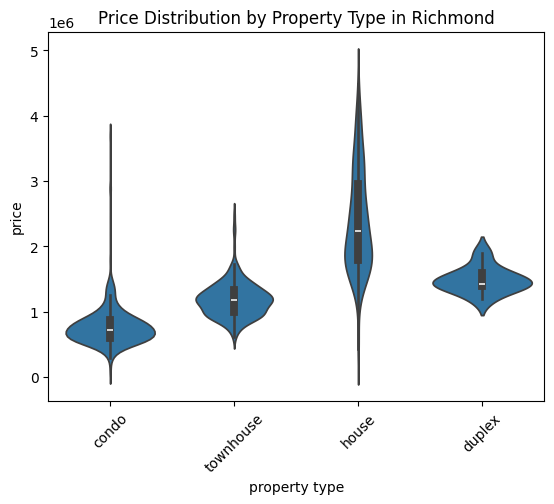

In [ ]:
sns.violinplot(x='property type', y='price', data=df_richmond)
plt.xticks(rotation=45)
plt.title('Price Distribution by Property Type in Richmond')
plt.show()

### West Vancouver

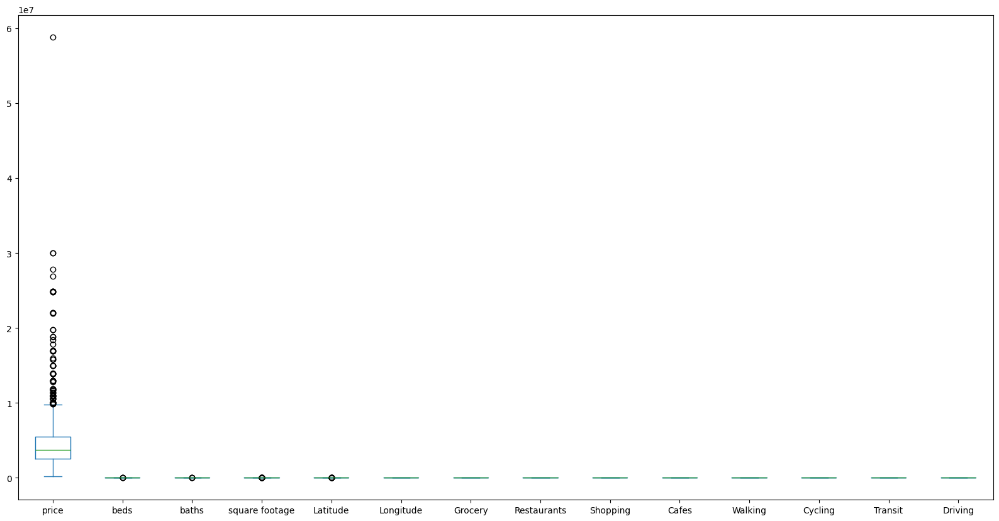

In [ ]:
df_w_vancouver.plot.box(figsize=(20,10));
plt.show()

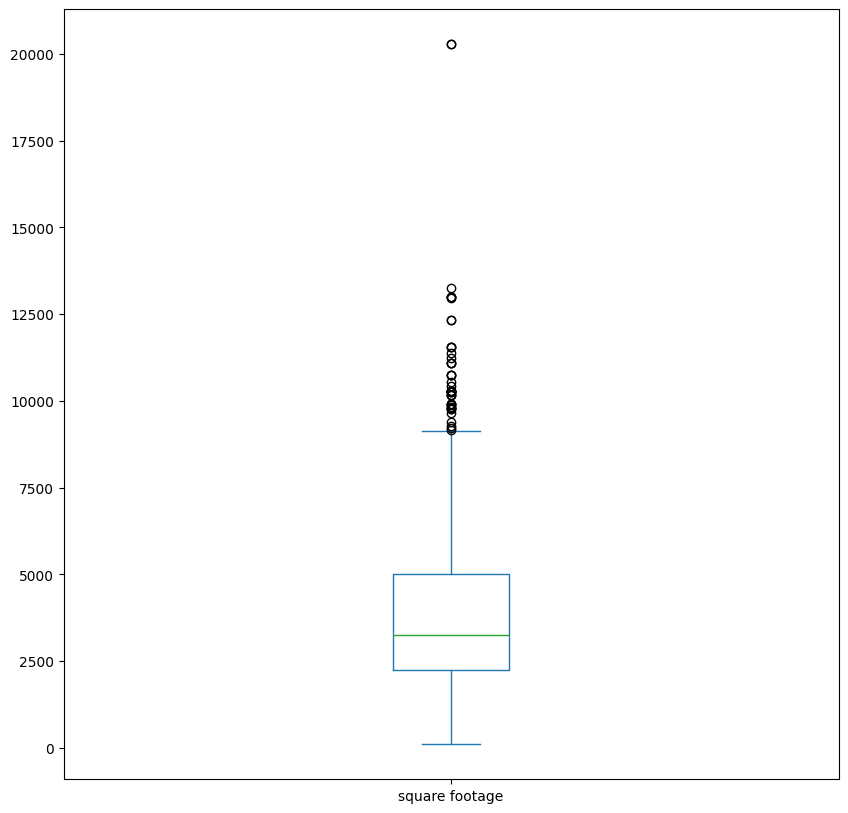

In [ ]:
df_w_vancouver['square footage'].plot.box(figsize=(10,10))
plt.show()

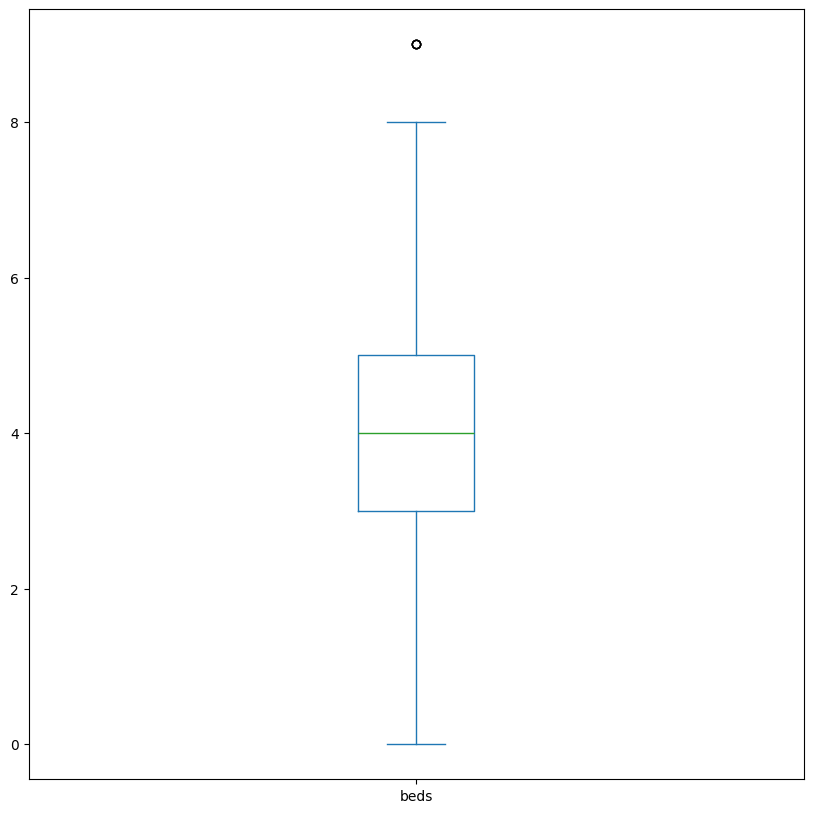

In [ ]:
df_w_vancouver['beds'].plot.box(figsize=(10,10))
plt.show()

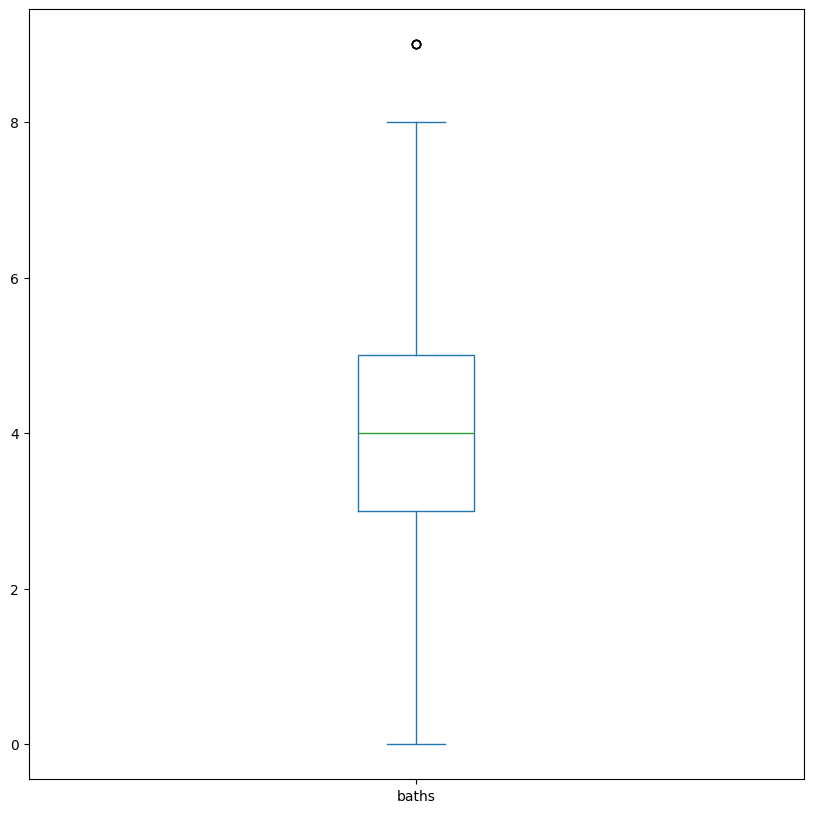

In [ ]:
df_w_vancouver['baths'].plot.box(figsize=(10,10))
plt.show()

In [ ]:
df_w_vancouver= df_w_vancouver[df_w_vancouver['square footage']<=12000]
df_w_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
198,999000,2,2,1286.0,condo,49.326391,-123.134442,Baseboard,Yes,Yes,...,No,9.8,5.7,5.9,7.2,5.5,6.6,7.3,7.2,WEST VANCOUVER
272,999900,2,2,780.0,condo,49.325654,-123.124699,Forced Air,Yes,Yes,...,No,6.9,9.1,9.1,8.8,5.9,6.5,8.0,8.3,WEST VANCOUVER
529,1399900,2,2,1029.0,condo,49.325654,-123.124701,Forced Air,Yes,Yes,...,No,6.2,10.0,5.1,5.0,9.1,5.8,9.4,8.2,WEST VANCOUVER
1030,169900,1,1,456.0,house,49.323967,-123.133471,Electric,No,Yes,...,No,6.2,6.7,6.1,7.9,5.8,8.6,9.8,6.5,WEST VANCOUVER
1409,789900,1,1,523.0,condo,49.325657,-123.124712,Forced Air,Yes,Yes,...,No,6.3,8.4,5.2,9.3,9.6,6.0,6.2,6.8,WEST VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,house,49.340936,-123.202161,Forced Air,Yes,Yes,...,No,9.1,5.1,4.7,6.4,9.4,9.4,7.5,6.7,WEST VANCOUVER
16286,2891000,4,4,2640.0,house,49.331369,-123.156732,Forced Air,No,Yes,...,No,9.4,6.1,5.2,8.9,9.5,5.0,9.6,8.0,WEST VANCOUVER
16287,2698750,2,2,732.0,house,49.331148,-123.156726,Forced Air,No,Yes,...,No,8.2,6.2,9.0,8.8,6.1,7.6,4.9,6.0,WEST VANCOUVER
16295,4238000,4,4,3864.0,house,49.367367,-123.283567,Forced Air,Yes,Yes,...,No,9.4,6.1,7.6,7.9,8.3,4.8,9.4,4.9,WEST VANCOUVER


In [ ]:
df_w_vancouver= df_w_vancouver[df_w_vancouver['baths']<8]
df_w_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
198,999000,2,2,1286.0,condo,49.326391,-123.134442,Baseboard,Yes,Yes,...,No,9.8,5.7,5.9,7.2,5.5,6.6,7.3,7.2,WEST VANCOUVER
272,999900,2,2,780.0,condo,49.325654,-123.124699,Forced Air,Yes,Yes,...,No,6.9,9.1,9.1,8.8,5.9,6.5,8.0,8.3,WEST VANCOUVER
529,1399900,2,2,1029.0,condo,49.325654,-123.124701,Forced Air,Yes,Yes,...,No,6.2,10.0,5.1,5.0,9.1,5.8,9.4,8.2,WEST VANCOUVER
1030,169900,1,1,456.0,house,49.323967,-123.133471,Electric,No,Yes,...,No,6.2,6.7,6.1,7.9,5.8,8.6,9.8,6.5,WEST VANCOUVER
1409,789900,1,1,523.0,condo,49.325657,-123.124712,Forced Air,Yes,Yes,...,No,6.3,8.4,5.2,9.3,9.6,6.0,6.2,6.8,WEST VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,house,49.340936,-123.202161,Forced Air,Yes,Yes,...,No,9.1,5.1,4.7,6.4,9.4,9.4,7.5,6.7,WEST VANCOUVER
16286,2891000,4,4,2640.0,house,49.331369,-123.156732,Forced Air,No,Yes,...,No,9.4,6.1,5.2,8.9,9.5,5.0,9.6,8.0,WEST VANCOUVER
16287,2698750,2,2,732.0,house,49.331148,-123.156726,Forced Air,No,Yes,...,No,8.2,6.2,9.0,8.8,6.1,7.6,4.9,6.0,WEST VANCOUVER
16295,4238000,4,4,3864.0,house,49.367367,-123.283567,Forced Air,Yes,Yes,...,No,9.4,6.1,7.6,7.9,8.3,4.8,9.4,4.9,WEST VANCOUVER


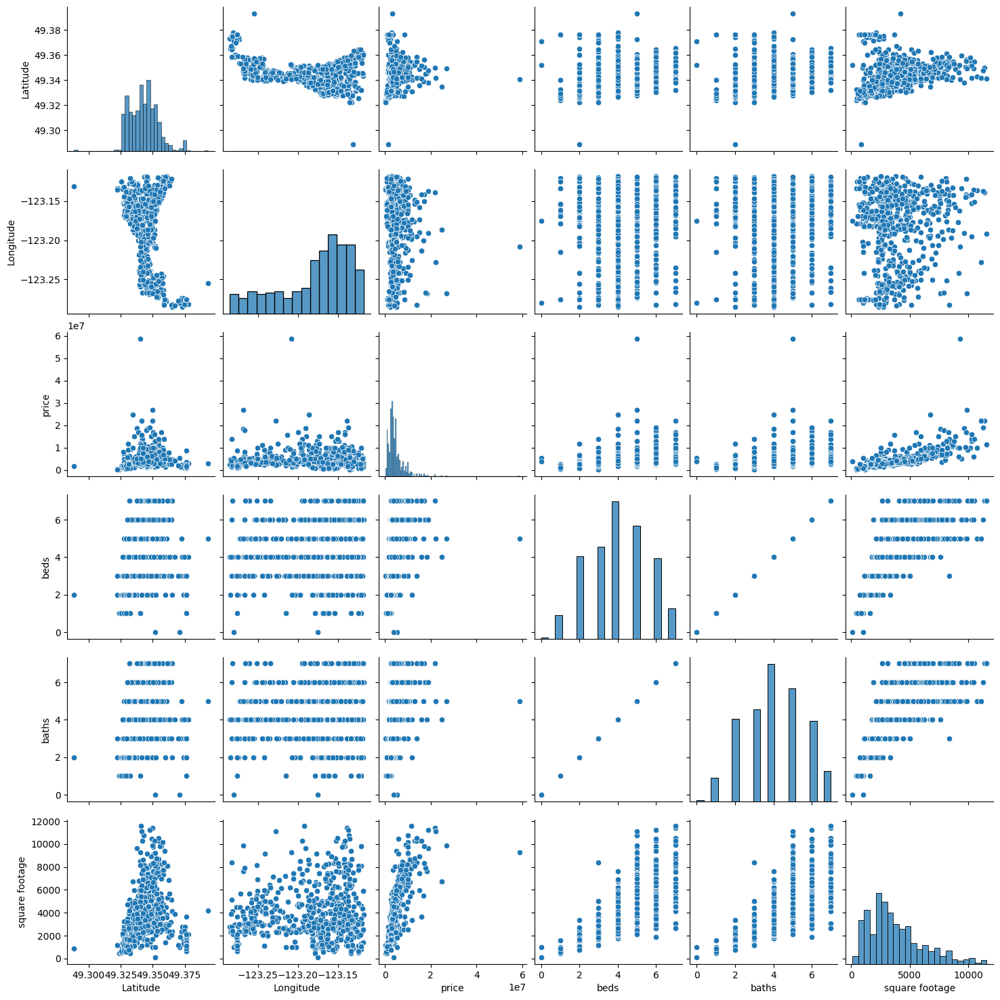

In [ ]:
sns.pairplot(df_w_vancouver[['Latitude','Longitude','price','beds','baths','square footage']])


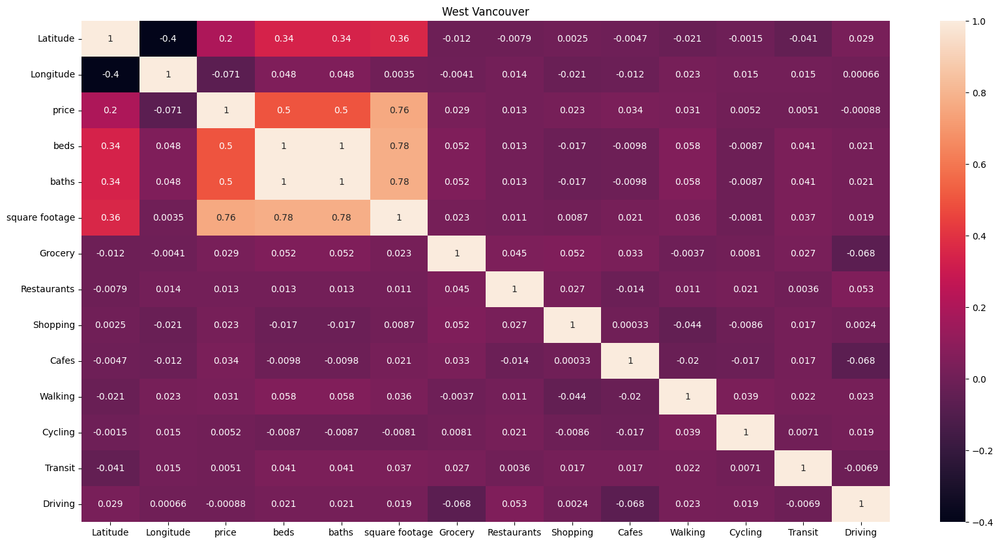

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df_w_vancouver[['Latitude','Longitude','price','beds','baths','square footage','Grocery','Restaurants','Shopping','Cafes','Walking','Cycling','Transit','Driving']]
            .corr(),annot=True)
plt.title('West Vancouver')
plt.show()


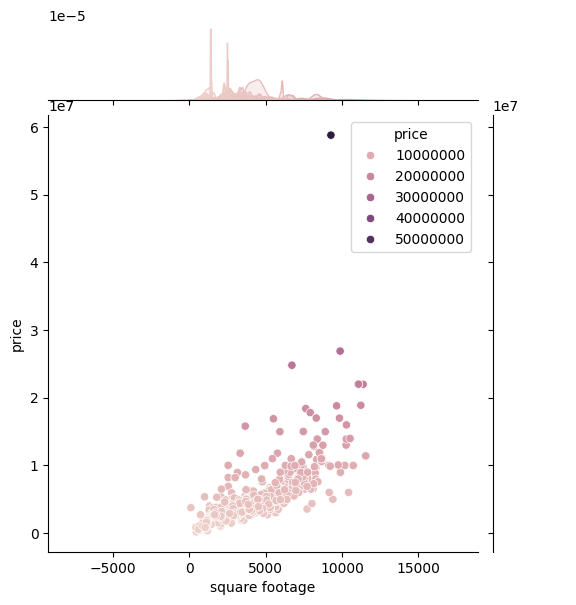

In [ ]:
sns.jointplot(x=df_w_vancouver['square footage'],y=df_w_vancouver['price'],hue=df_w_vancouver['price'])

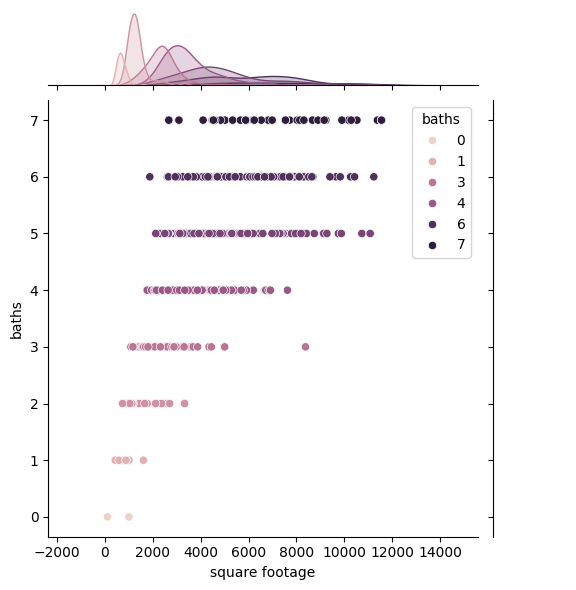

In [ ]:
sns.jointplot(x=df_w_vancouver['square footage'],y=df_w_vancouver['baths'],hue=df_w_vancouver['baths'])

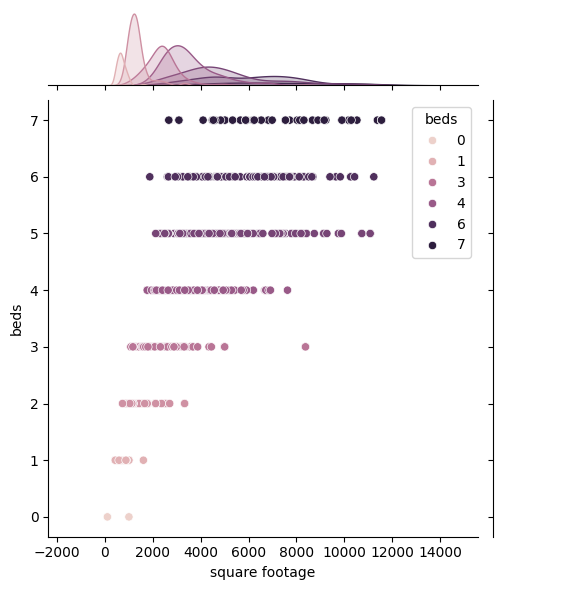

In [ ]:
sns.jointplot(x=df_w_vancouver['square footage'],y=df_w_vancouver['beds'],hue=df_w_vancouver['beds'])

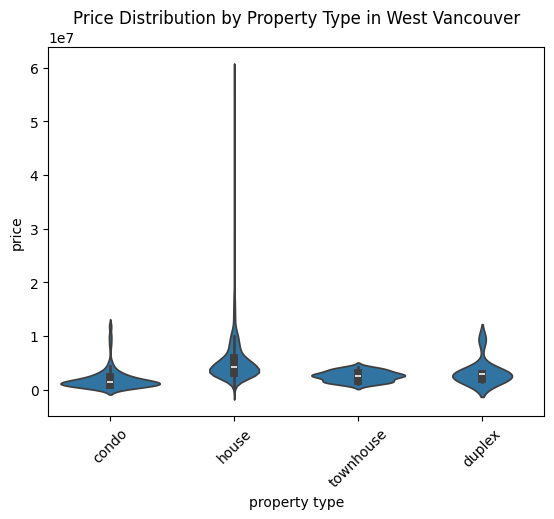

In [ ]:
sns.violinplot(x='property type', y='price', data=df_w_vancouver)
plt.xticks(rotation=45)
plt.title('Price Distribution by Property Type in West Vancouver')
plt.show()

### North Vancouver

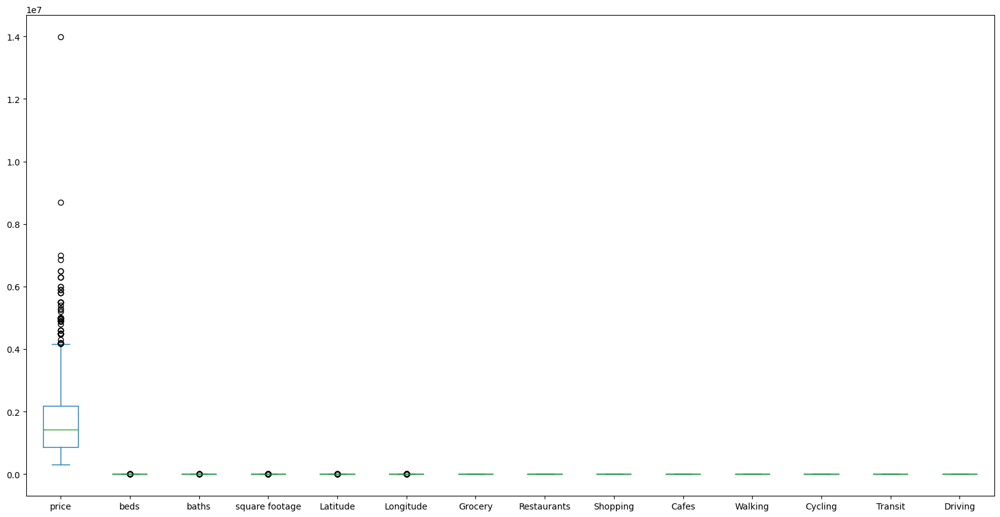

In [ ]:
df_n_vancouver.plot.box(figsize=(20,10));
plt.show()

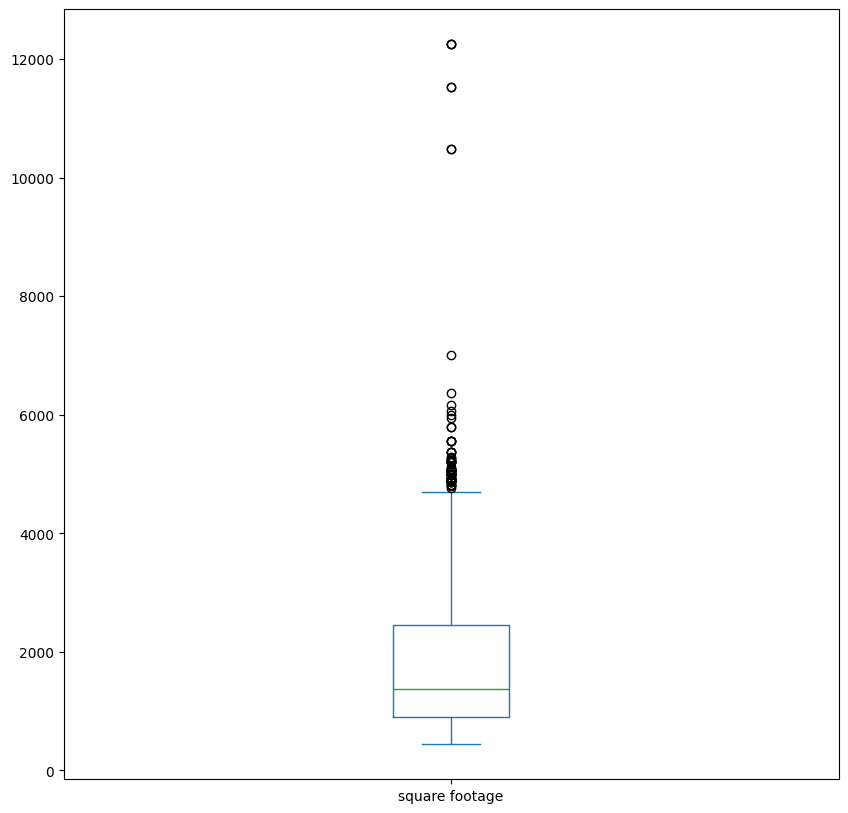

In [ ]:
df_n_vancouver['square footage'].plot.box(figsize=(10,10))
plt.show()

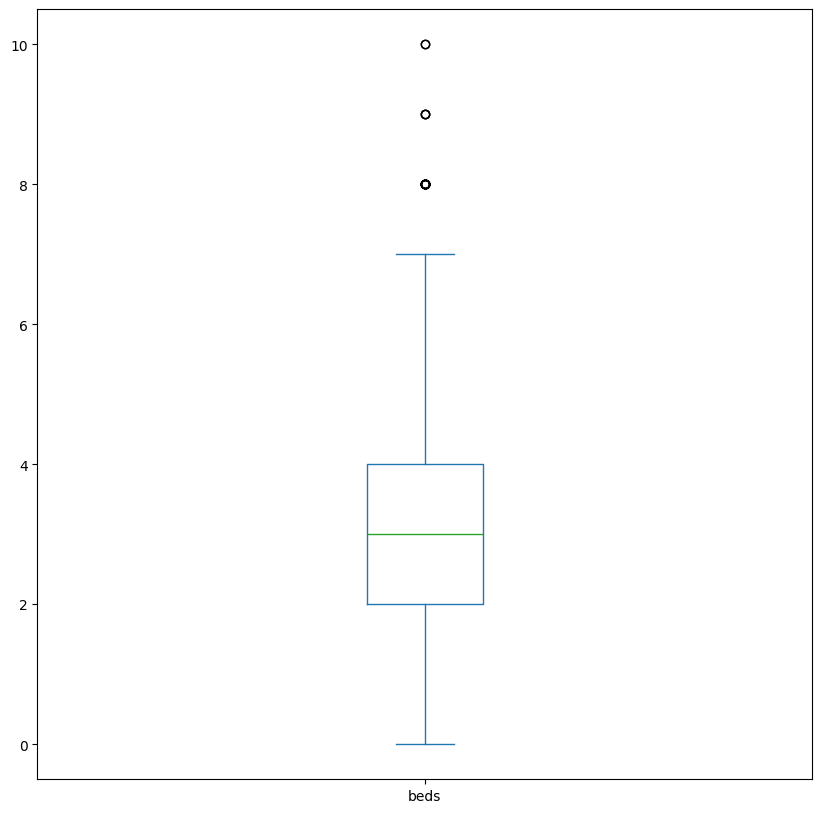

In [ ]:
df_n_vancouver['beds'].plot.box(figsize=(10,10))
plt.show()

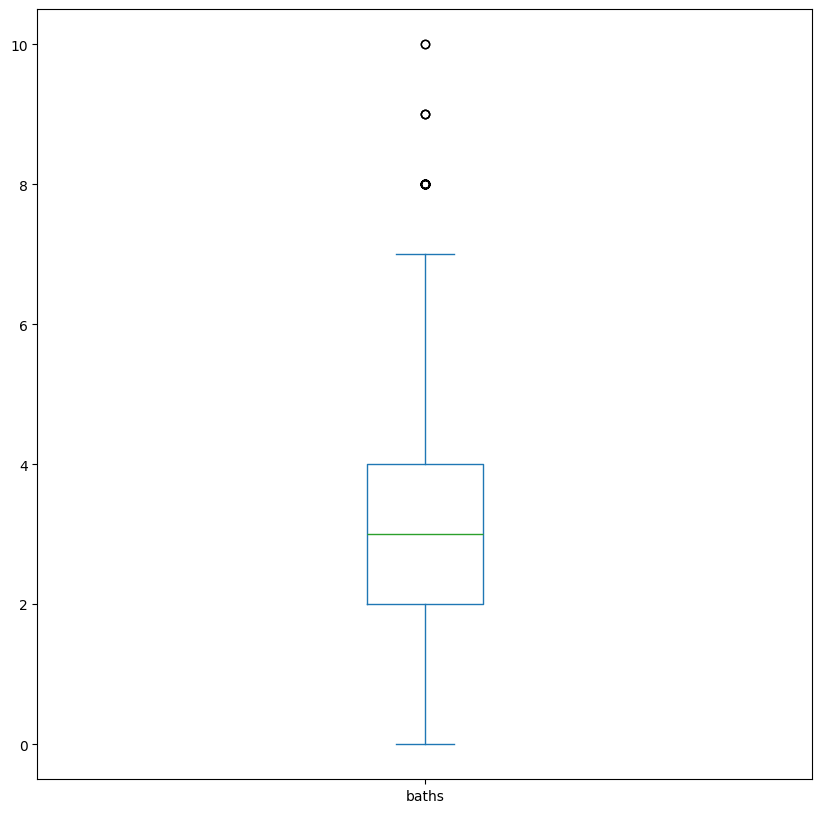

In [ ]:
df_n_vancouver['baths'].plot.box(figsize=(10,10))
plt.show()

In [ ]:
df_n_vancouver = df_n_vancouver[df_n_vancouver['square footage']<=6000]
df_n_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
6,799000,1,1,980.0,condo,49.311136,-123.083163,Baseboard,Yes,Yes,...,No,6.1,8.0,4.5,5.8,6.2,8.2,6.2,6.8,NORTH VANCOUVER
20,679900,2,2,1025.0,condo,49.324933,-123.070351,Baseboard,Yes,Yes,...,No,8.2,6.9,9.0,7.9,9.1,9.9,9.6,3.9,NORTH VANCOUVER
35,899000,2,2,1030.0,condo,49.322862,-123.073689,Baseboard,Yes,Yes,...,No,7.7,6.0,5.3,5.5,6.4,9.3,6.2,7.9,NORTH VANCOUVER
37,1619000,3,3,1822.0,townhouse,49.315391,-123.067135,Baseboard,Yes,Yes,...,No,5.8,7.5,5.0,10.0,5.7,5.7,7.7,6.2,NORTH VANCOUVER
43,1124000,2,2,898.0,condo,49.324853,-123.122521,Heat Pump,Yes,Yes,...,No,9.5,7.1,8.5,9.2,6.8,6.7,8.8,3.6,NORTH VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,880.0,condo,49.319716,-123.070948,Forced Air,Yes,Yes,...,No,8.9,6.7,9.1,5.0,7.9,9.9,5.7,8.0,NORTH VANCOUVER
16129,835000,2,2,875.0,condo,49.323860,-123.101307,Electric,Yes,Yes,...,No,6.0,6.3,7.5,9.8,9.8,5.5,8.1,5.9,NORTH VANCOUVER
16144,3998000,5,5,4266.0,house,49.334973,-123.081166,Heat Pump,Yes,Yes,...,No,5.5,8.9,7.6,8.5,5.1,7.0,5.5,9.7,NORTH VANCOUVER
16178,1498000,2,2,1144.0,condo,49.309479,-123.078324,Forced Air,Yes,Yes,...,No,6.6,6.1,9.2,9.9,7.6,5.6,5.2,5.3,NORTH VANCOUVER


In [ ]:
df_n_vancouver = df_n_vancouver[df_n_vancouver['beds']<=6]

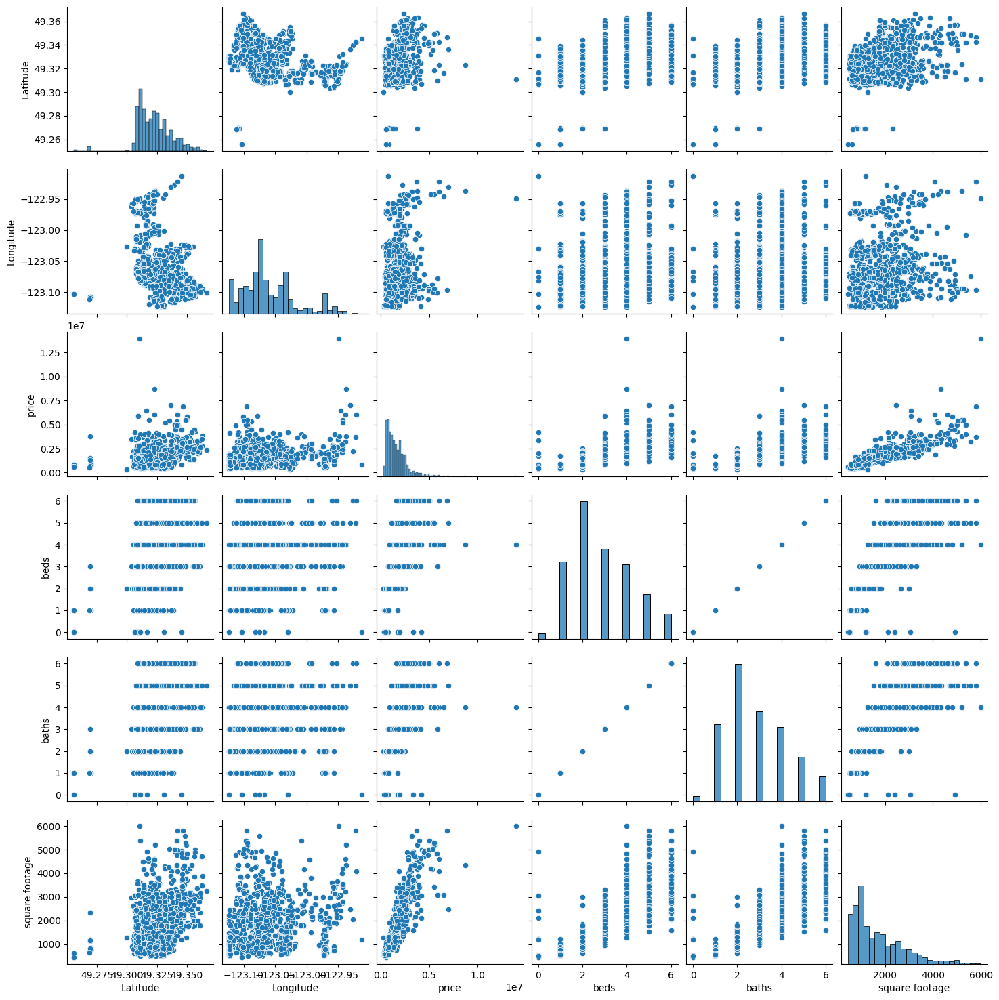

In [ ]:
sns.pairplot(df_n_vancouver[['Latitude','Longitude','price','beds','baths','square footage']])

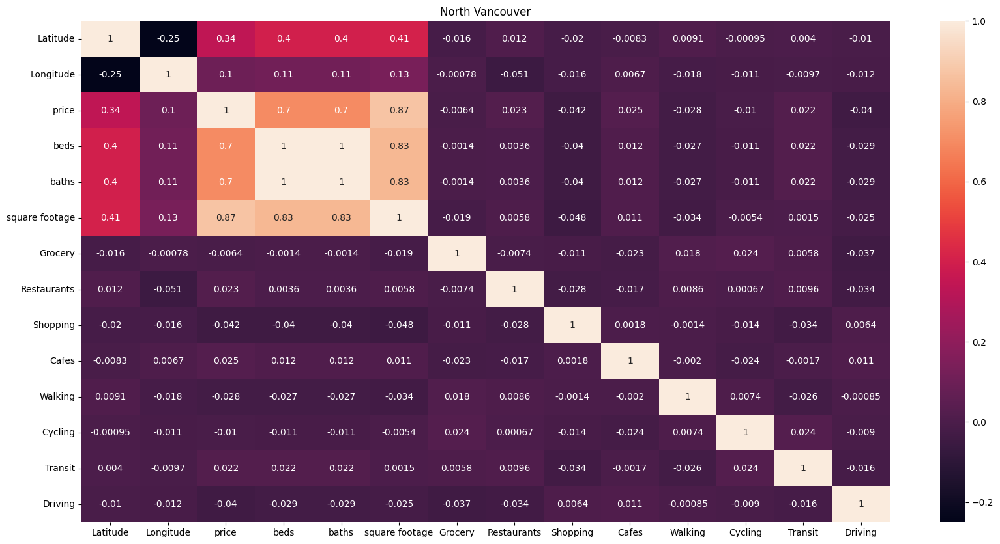

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df_n_vancouver[['Latitude','Longitude','price','beds','baths','square footage','Grocery','Restaurants','Shopping','Cafes','Walking','Cycling','Transit','Driving']]
            .corr(),annot=True)
plt.title('North Vancouver')
plt.show()

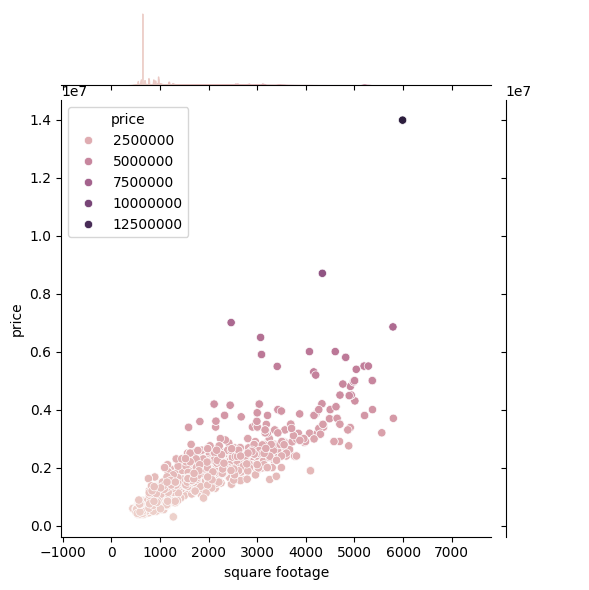

In [ ]:
sns.jointplot(x=df_n_vancouver['square footage'],y=df_n_vancouver['price'],hue=df_n_vancouver['price'])

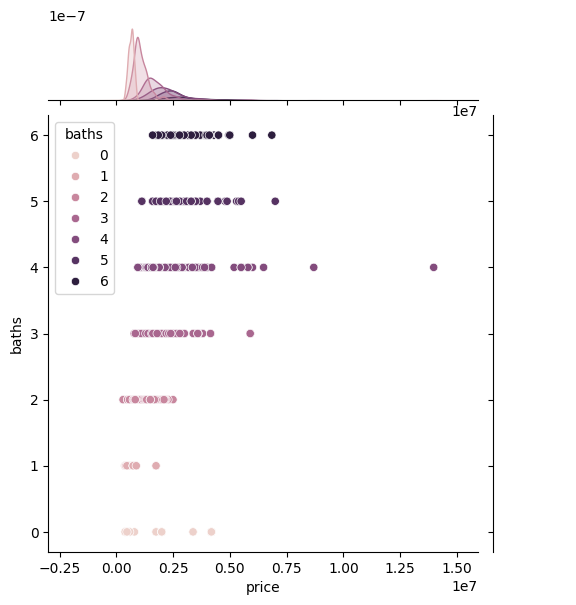

In [ ]:
sns.jointplot(x=df_n_vancouver['price'],y=df_n_vancouver['baths'],hue=df_n_vancouver['baths'])

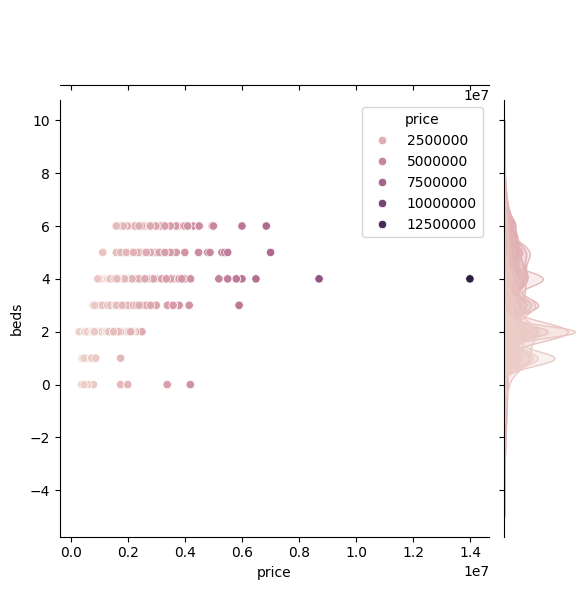

In [ ]:
sns.jointplot(x=df_n_vancouver['price'],y=df_n_vancouver['beds'],hue=df_n_vancouver['price'])

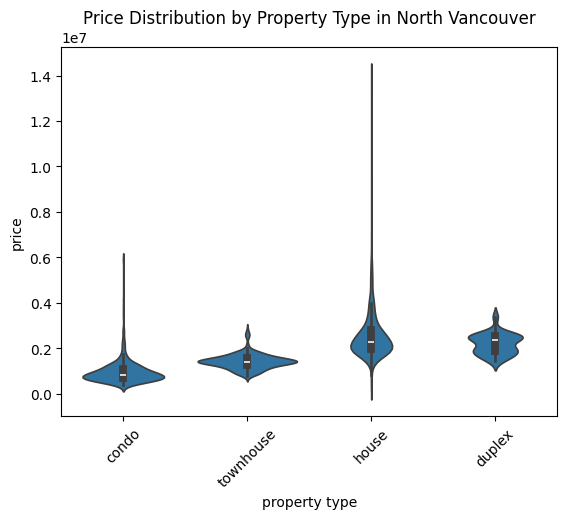

In [ ]:
sns.violinplot(x='property type', y='price', data=df_n_vancouver)
plt.xticks(rotation=45)
plt.title('Price Distribution by Property Type in North Vancouver')
plt.show()

## Data preparation

### Vancouver

<Axes: >

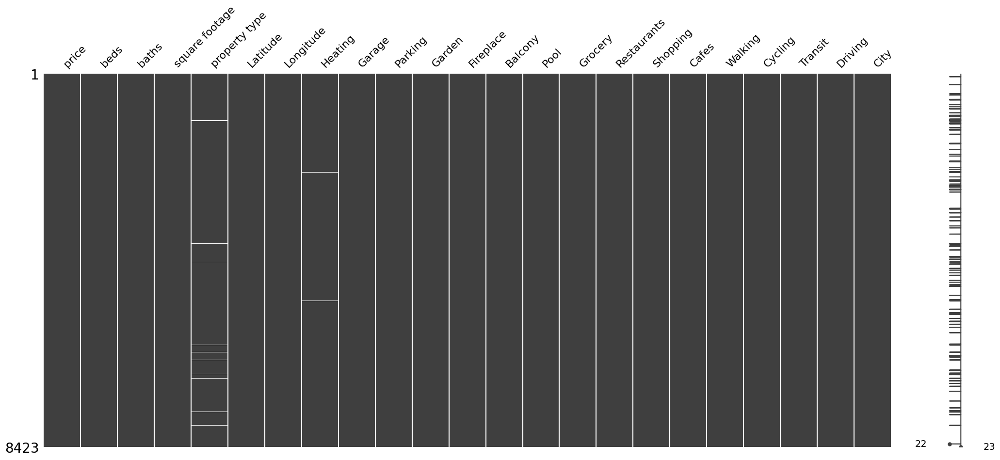

In [ ]:
msno.matrix(df_vancouver)

<Axes: >

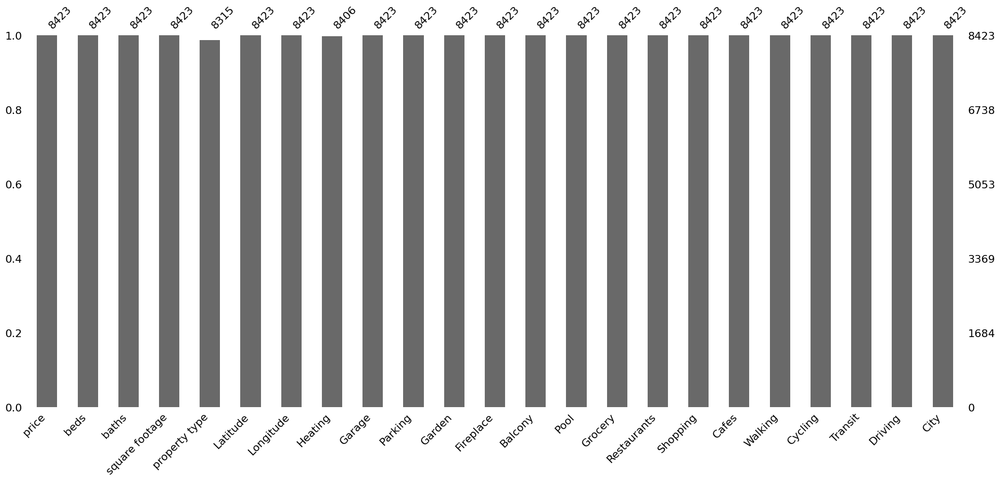

In [ ]:
msno.bar(df_vancouver)

In [ ]:
missing_percent = df_vancouver.isnull().mean()*100
print(missing_percent)

price             0.000000
beds              0.000000
baths             0.000000
square footage    0.000000
property type     1.282203
Latitude          0.000000
Longitude         0.000000
Heating           0.201828
Garage            0.000000
Parking           0.000000
Garden            0.000000
Fireplace         0.000000
Balcony           0.000000
Pool              0.000000
Grocery           0.000000
Restaurants       0.000000
Shopping          0.000000
Cafes             0.000000
Walking           0.000000
Cycling           0.000000
Transit           0.000000
Driving           0.000000
City              0.000000
dtype: float64


In [ ]:
df_vancouver['Heating'].value_counts()

,count
Heating,
Baseboard,2871
Forced Air,1711
Heat Pump,1230
Electric,1151
Radiant,412
Hot Water,400
Natural Gas,323
Other,160
Geothermal,148


In [ ]:
df_vancouver['Heating'] = df_vancouver['Heating'].replace('nan', np.nan)

imputer = SimpleImputer(strategy='most_frequent')
df_vancouver['Heating'] = imputer.fit_transform(df_vancouver[['Heating']]).ravel()

/tmp/ipython-input-110-1725040758.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vancouver['Heating'] = df_vancouver['Heating'].replace('nan', np.nan)
/tmp/ipython-input-110-1725040758.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vancouver['Heating'] = imputer.fit_transform(df_vancouver[['Heating']]).ravel()


In [ ]:
df_vancouver['Heating'].isna().sum()

np.int64(0)

In [ ]:
imputer = SimpleImputer(strategy='constant',fill_value='Unknown')
df_vancouver['property type'] = imputer.fit_transform(df_vancouver[['property type']]).ravel()

/tmp/ipython-input-112-1961030801.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vancouver['property type'] = imputer.fit_transform(df_vancouver[['property type']]).ravel()


In [ ]:
df_vancouver['property type'].value_counts()

,count
property type,
condo,5171
house,1685
townhouse,746
duplex,713
Unknown,108


In [ ]:
def apply_fun(word):
  return 1 if word=='Yes' else 0

In [ ]:
cols = ['Garage', 'Parking', 'Garden', 'Fireplace', 'Balcony', 'Pool']
df_vancouver[cols] = df_vancouver[cols].applymap(apply_fun)
df_vancouver

/tmp/ipython-input-115-4268966188.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_vancouver[cols] = df_vancouver[cols].applymap(apply_fun)
/tmp/ipython-input-115-4268966188.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vancouver[cols] = df_vancouver[cols].applymap(apply_fun)


,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
0,749900,2,2,792.0,condo,49.275734,-123.101635,Electric,1,1,...,0,9.0,9.3,10.0,8.9,10.0,9.7,10.0,2.6,VANCOUVER
1,1549900,2,2,1110.0,condo,49.274663,-123.112380,Baseboard,1,1,...,0,9.5,9.3,10.0,8.3,10.0,9.0,9.4,2.5,VANCOUVER
4,1098000,2,2,882.0,condo,49.287694,-123.125721,Electric,1,1,...,0,8.4,6.1,9.1,8.7,8.4,9.8,10.0,8.8,VANCOUVER
5,1348000,2,2,1078.0,townhouse,49.269413,-123.111259,Electric,1,1,...,0,8.3,9.0,8.5,7.0,6.4,9.6,7.3,6.3,VANCOUVER
7,449000,0,0,402.0,condo,49.288179,-123.127755,Baseboard,1,1,...,0,6.1,6.2,9.7,8.6,8.1,8.4,9.1,5.1,VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,4220.0,house,49.252858,-123.130726,Forced Air,1,1,...,0,4.8,8.1,5.6,6.8,6.3,9.7,4.8,5.6,VANCOUVER
16301,3000000,5,5,2200.0,house,49.252931,-123.064532,Electric,0,1,...,0,7.6,4.6,7.7,8.2,4.7,6.3,8.9,9.9,VANCOUVER
16302,3880000,6,6,1960.0,house,49.262273,-123.046440,Electric,1,1,...,0,7.1,5.8,7.6,7.9,8.5,5.3,7.1,5.2,VANCOUVER
16304,3350000,6,6,1872.0,house,49.257877,-123.088942,Natural Gas,0,1,...,0,5.8,5.0,4.7,5.7,8.6,8.9,9.6,9.6,VANCOUVER


In [ ]:
df_vancouver = df_vancouver.drop(columns=['City'],axis=1)
df_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Balcony,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving
0,749900,2,2,792.0,condo,49.275734,-123.101635,Electric,1,1,...,1,0,9.0,9.3,10.0,8.9,10.0,9.7,10.0,2.6
1,1549900,2,2,1110.0,condo,49.274663,-123.112380,Baseboard,1,1,...,1,0,9.5,9.3,10.0,8.3,10.0,9.0,9.4,2.5
4,1098000,2,2,882.0,condo,49.287694,-123.125721,Electric,1,1,...,1,0,8.4,6.1,9.1,8.7,8.4,9.8,10.0,8.8
5,1348000,2,2,1078.0,townhouse,49.269413,-123.111259,Electric,1,1,...,1,0,8.3,9.0,8.5,7.0,6.4,9.6,7.3,6.3
7,449000,0,0,402.0,condo,49.288179,-123.127755,Baseboard,1,1,...,0,0,6.1,6.2,9.7,8.6,8.1,8.4,9.1,5.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,4220.0,house,49.252858,-123.130726,Forced Air,1,1,...,1,0,4.8,8.1,5.6,6.8,6.3,9.7,4.8,5.6
16301,3000000,5,5,2200.0,house,49.252931,-123.064532,Electric,0,1,...,0,0,7.6,4.6,7.7,8.2,4.7,6.3,8.9,9.9
16302,3880000,6,6,1960.0,house,49.262273,-123.046440,Electric,1,1,...,0,0,7.1,5.8,7.6,7.9,8.5,5.3,7.1,5.2
16304,3350000,6,6,1872.0,house,49.257877,-123.088942,Natural Gas,0,1,...,0,0,5.8,5.0,4.7,5.7,8.6,8.9,9.6,9.6


In [ ]:
df_sim_vancouver = pd.get_dummies(df_vancouver, columns=['Heating'], drop_first=False)
df_sim_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
0,749900,2,2,792.0,condo,49.275734,-123.101635,1,1,0,...,2.6,False,True,False,False,False,False,False,False,False
1,1549900,2,2,1110.0,condo,49.274663,-123.112380,1,1,0,...,2.5,True,False,False,False,False,False,False,False,False
4,1098000,2,2,882.0,condo,49.287694,-123.125721,1,1,1,...,8.8,False,True,False,False,False,False,False,False,False
5,1348000,2,2,1078.0,townhouse,49.269413,-123.111259,1,1,0,...,6.3,False,True,False,False,False,False,False,False,False
7,449000,0,0,402.0,condo,49.288179,-123.127755,1,1,0,...,5.1,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,4220.0,house,49.252858,-123.130726,1,1,0,...,5.6,False,False,True,False,False,False,False,False,False
16301,3000000,5,5,2200.0,house,49.252931,-123.064532,0,1,0,...,9.9,False,True,False,False,False,False,False,False,False
16302,3880000,6,6,1960.0,house,49.262273,-123.046440,1,1,0,...,5.2,False,True,False,False,False,False,False,False,False
16304,3350000,6,6,1872.0,house,49.257877,-123.088942,0,1,0,...,9.6,False,False,False,False,False,False,True,False,False


In [ ]:
df_vancouver = pd.get_dummies(df_vancouver, columns=['property type', 'Heating'], drop_first=False)
df_vancouver

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
0,749900,2,2,792.0,49.275734,-123.101635,1,1,0,1,...,False,False,True,False,False,False,False,False,False,False
1,1549900,2,2,1110.0,49.274663,-123.112380,1,1,0,1,...,False,True,False,False,False,False,False,False,False,False
4,1098000,2,2,882.0,49.287694,-123.125721,1,1,1,1,...,False,False,True,False,False,False,False,False,False,False
5,1348000,2,2,1078.0,49.269413,-123.111259,1,1,0,0,...,True,False,True,False,False,False,False,False,False,False
7,449000,0,0,402.0,49.288179,-123.127755,1,1,0,0,...,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,4220.0,49.252858,-123.130726,1,1,0,1,...,False,False,False,True,False,False,False,False,False,False
16301,3000000,5,5,2200.0,49.252931,-123.064532,0,1,0,1,...,False,False,True,False,False,False,False,False,False,False
16302,3880000,6,6,1960.0,49.262273,-123.046440,1,1,0,1,...,False,False,True,False,False,False,False,False,False,False
16304,3350000,6,6,1872.0,49.257877,-123.088942,0,1,0,0,...,False,False,False,False,False,False,False,True,False,False


In [ ]:
def transform_integer(word):
  return 1 if word else 0

In [ ]:
df_vancouver.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8423 entries, 0 to 16305
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   price                    8423 non-null   int64  
 1   beds                     8423 non-null   int64  
 2   baths                    8423 non-null   int64  
 3   square footage           8423 non-null   float64
 4   Latitude                 8423 non-null   float64
 5   Longitude                8423 non-null   float64
 6   Garage                   8423 non-null   int64  
 7   Parking                  8423 non-null   int64  
 8   Garden                   8423 non-null   int64  
 9   Fireplace                8423 non-null   int64  
 10  Balcony                  8423 non-null   int64  
 11  Pool                     8423 non-null   int64  
 12  Grocery                  8423 non-null   float64
 13  Restaurants              8423 non-null   float64
 14  Shopping                 842

In [ ]:
cols = ['Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_sim_vancouver[cols] = df_sim_vancouver[cols].applymap(transform_integer)
df_sim_vancouver

/tmp/ipython-input-121-4080023779.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_sim_vancouver[cols] = df_sim_vancouver[cols].applymap(transform_integer)


,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
0,749900,2,2,792.0,condo,49.275734,-123.101635,1,1,0,...,2.6,0,1,0,0,0,0,0,0,0
1,1549900,2,2,1110.0,condo,49.274663,-123.112380,1,1,0,...,2.5,1,0,0,0,0,0,0,0,0
4,1098000,2,2,882.0,condo,49.287694,-123.125721,1,1,1,...,8.8,0,1,0,0,0,0,0,0,0
5,1348000,2,2,1078.0,townhouse,49.269413,-123.111259,1,1,0,...,6.3,0,1,0,0,0,0,0,0,0
7,449000,0,0,402.0,condo,49.288179,-123.127755,1,1,0,...,5.1,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,4220.0,house,49.252858,-123.130726,1,1,0,...,5.6,0,0,1,0,0,0,0,0,0
16301,3000000,5,5,2200.0,house,49.252931,-123.064532,0,1,0,...,9.9,0,1,0,0,0,0,0,0,0
16302,3880000,6,6,1960.0,house,49.262273,-123.046440,1,1,0,...,5.2,0,1,0,0,0,0,0,0,0
16304,3350000,6,6,1872.0,house,49.257877,-123.088942,0,1,0,...,9.6,0,0,0,0,0,0,1,0,0


In [ ]:
cols = ['property type_Unknown', 'property type_condo',
       'property type_duplex', 'property type_house',
       'property type_townhouse', 'Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_vancouver[cols] = df_vancouver[cols].applymap(transform_integer)
df_vancouver

/tmp/ipython-input-122-4250357213.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_vancouver[cols] = df_vancouver[cols].applymap(transform_integer)


,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
0,749900,2,2,792.0,49.275734,-123.101635,1,1,0,1,...,0,0,1,0,0,0,0,0,0,0
1,1549900,2,2,1110.0,49.274663,-123.112380,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
4,1098000,2,2,882.0,49.287694,-123.125721,1,1,1,1,...,0,0,1,0,0,0,0,0,0,0
5,1348000,2,2,1078.0,49.269413,-123.111259,1,1,0,0,...,1,0,1,0,0,0,0,0,0,0
7,449000,0,0,402.0,49.288179,-123.127755,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,4220.0,49.252858,-123.130726,1,1,0,1,...,0,0,0,1,0,0,0,0,0,0
16301,3000000,5,5,2200.0,49.252931,-123.064532,0,1,0,1,...,0,0,1,0,0,0,0,0,0,0
16302,3880000,6,6,1960.0,49.262273,-123.046440,1,1,0,1,...,0,0,1,0,0,0,0,0,0,0
16304,3350000,6,6,1872.0,49.257877,-123.088942,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
def scaler(df:pd.DataFrame,columns:list):
  for col in columns:
    scaler = MinMaxScaler()
    df[col] = scaler.fit_transform(df[[col]])
  return df

In [ ]:
df_scaled_vancouver = scaler(df_vancouver,['square footage'])
df_scaled_vancouver

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
0,749900,2,2,0.104185,49.275734,-123.101635,1,1,0,1,...,0,0,1,0,0,0,0,0,0,0
1,1549900,2,2,0.150072,49.274663,-123.112380,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
4,1098000,2,2,0.117172,49.287694,-123.125721,1,1,1,1,...,0,0,1,0,0,0,0,0,0,0
5,1348000,2,2,0.145455,49.269413,-123.111259,1,1,0,0,...,1,0,1,0,0,0,0,0,0,0
7,449000,0,0,0.047908,49.288179,-123.127755,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,0.598846,49.252858,-123.130726,1,1,0,1,...,0,0,0,1,0,0,0,0,0,0
16301,3000000,5,5,0.307359,49.252931,-123.064532,0,1,0,1,...,0,0,1,0,0,0,0,0,0,0
16302,3880000,6,6,0.272727,49.262273,-123.046440,1,1,0,1,...,0,0,1,0,0,0,0,0,0,0
16304,3350000,6,6,0.260029,49.257877,-123.088942,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
df_sim_vancouver =  scaler(df_sim_vancouver,['square footage'])
df_sim_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
0,749900,2,2,0.104185,condo,49.275734,-123.101635,1,1,0,...,2.6,0,1,0,0,0,0,0,0,0
1,1549900,2,2,0.150072,condo,49.274663,-123.112380,1,1,0,...,2.5,1,0,0,0,0,0,0,0,0
4,1098000,2,2,0.117172,condo,49.287694,-123.125721,1,1,1,...,8.8,0,1,0,0,0,0,0,0,0
5,1348000,2,2,0.145455,townhouse,49.269413,-123.111259,1,1,0,...,6.3,0,1,0,0,0,0,0,0,0
7,449000,0,0,0.047908,condo,49.288179,-123.127755,1,1,0,...,5.1,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,0.598846,house,49.252858,-123.130726,1,1,0,...,5.6,0,0,1,0,0,0,0,0,0
16301,3000000,5,5,0.307359,house,49.252931,-123.064532,0,1,0,...,9.9,0,1,0,0,0,0,0,0,0
16302,3880000,6,6,0.272727,house,49.262273,-123.046440,1,1,0,...,5.2,0,1,0,0,0,0,0,0,0
16304,3350000,6,6,0.260029,house,49.257877,-123.088942,0,1,0,...,9.6,0,0,0,0,0,0,1,0,0


### Burnaby

<Axes: >

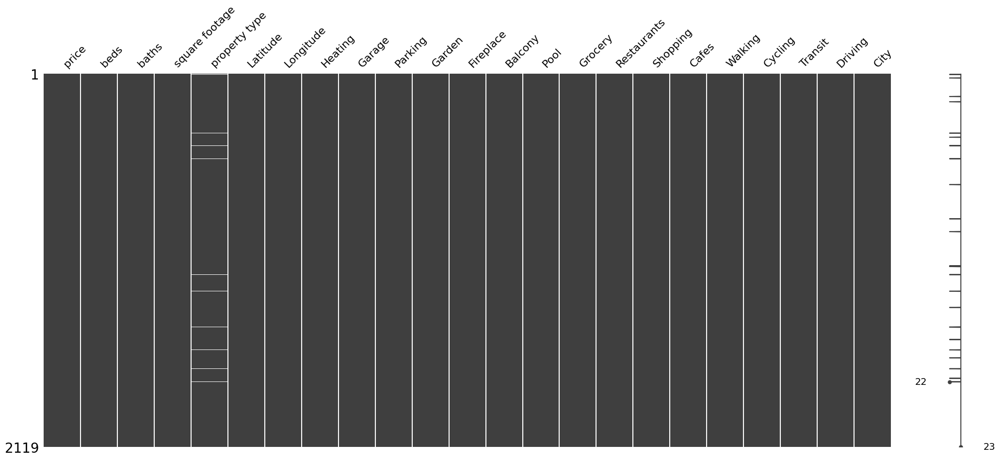

In [ ]:
msno.matrix(df_burnaby)

<Axes: >

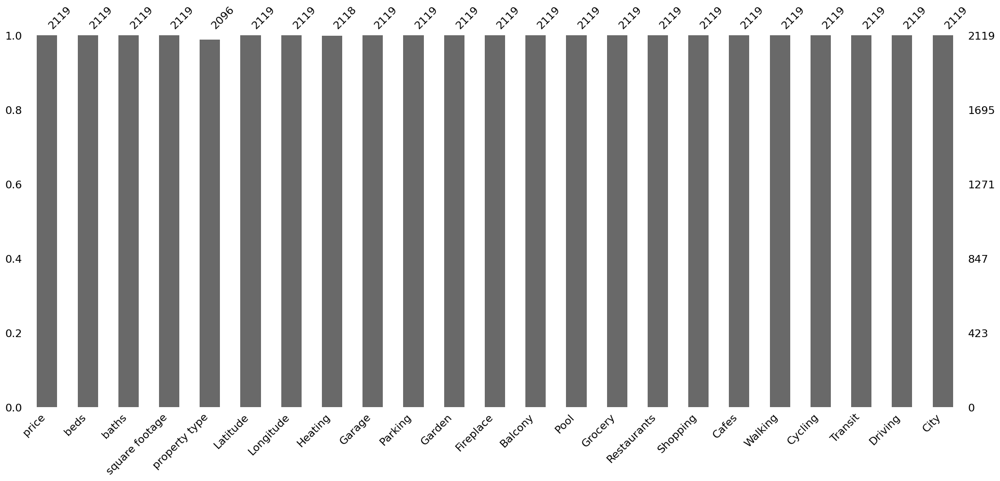

In [ ]:
msno.bar(df_burnaby)

In [ ]:
missing_percent = df_burnaby.isnull().mean()*100
print(missing_percent)

price             0.000000
beds              0.000000
baths             0.000000
square footage    0.000000
property type     1.085418
Latitude          0.000000
Longitude         0.000000
Heating           0.047192
Garage            0.000000
Parking           0.000000
Garden            0.000000
Fireplace         0.000000
Balcony           0.000000
Pool              0.000000
Grocery           0.000000
Restaurants       0.000000
Shopping          0.000000
Cafes             0.000000
Walking           0.000000
Cycling           0.000000
Transit           0.000000
Driving           0.000000
City              0.000000
dtype: float64


In [ ]:
df_burnaby['Heating'].value_counts()

,count
Heating,
Baseboard,962
Heat Pump,406
Forced Air,357
Electric,240
Hot Water,44
Geothermal,41
Other,37
Natural Gas,16
Radiant,15


In [ ]:
df_burnaby['Heating'] = df_burnaby['Heating'].replace('nan', np.nan)

imputer = SimpleImputer(strategy='most_frequent')
df_burnaby['Heating'] = imputer.fit_transform(df_burnaby[['Heating']]).ravel()

/tmp/ipython-input-130-3524589679.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_burnaby['Heating'] = df_burnaby['Heating'].replace('nan', np.nan)
/tmp/ipython-input-130-3524589679.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_burnaby['Heating'] = imputer.fit_transform(df_burnaby[['Heating']]).ravel()


In [ ]:
imputer = SimpleImputer(strategy='constant',fill_value='Unknown')
df_burnaby['property type'] = imputer.fit_transform(df_burnaby[['property type']]).ravel()
df_burnaby['property type'].value_counts()

/tmp/ipython-input-131-927224295.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_burnaby['property type'] = imputer.fit_transform(df_burnaby[['property type']]).ravel()


,count
property type,
condo,1791
townhouse,229
house,59
Unknown,23
duplex,17


In [ ]:
cols = ['Garage', 'Parking', 'Garden', 'Fireplace', 'Balcony', 'Pool']
df_burnaby[cols] = df_burnaby[cols].applymap(apply_fun)
df_burnaby

/tmp/ipython-input-132-2980888088.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_burnaby[cols] = df_burnaby[cols].applymap(apply_fun)
/tmp/ipython-input-132-2980888088.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_burnaby[cols] = df_burnaby[cols].applymap(apply_fun)


,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
11,725000,2,2,1228.0,condo,49.224460,-122.989907,Baseboard,1,1,...,0,6.9,6.6,7.3,7.1,8.8,5.5,8.7,7.8,BURNABY
15,829000,3,3,973.0,condo,49.210263,-122.953027,Baseboard,1,1,...,0,8.1,6.9,5.5,8.9,5.7,6.8,6.0,9.9,BURNABY
16,938800,2,2,1042.0,condo,49.265877,-123.008050,Baseboard,1,1,...,0,9.7,5.3,8.4,4.7,6.9,8.3,6.3,6.7,BURNABY
17,968000,2,2,976.0,condo,49.225111,-123.004010,Electric,1,1,...,0,5.1,10.0,6.4,9.1,5.0,4.9,5.2,7.0,BURNABY
23,788000,3,3,1236.0,Unknown,49.262587,-122.924565,Baseboard,0,1,...,0,8.2,6.0,5.6,9.2,5.2,7.9,5.6,6.4,BURNABY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,797.0,condo,49.263236,-122.998963,Heat Pump,1,1,...,0,8.1,4.7,6.7,8.3,7.7,7.8,9.3,8.1,BURNABY
16222,1568000,3,3,1212.0,condo,49.263247,-123.003660,Heat Pump,1,1,...,0,6.1,9.6,7.4,9.4,5.0,6.7,6.2,9.1,BURNABY
16243,968888,1,1,531.0,condo,49.266649,-123.000654,Electric,1,1,...,0,7.4,5.8,8.0,7.3,6.1,5.2,7.5,5.8,BURNABY
16244,968888,1,1,531.0,condo,49.266649,-123.000654,Electric,1,1,...,0,9.4,7.5,6.1,5.4,8.0,7.3,6.5,8.3,BURNABY


In [ ]:
df_burnaby = df_burnaby.drop(columns=['City'],axis=1)
df_burnaby

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Balcony,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving
11,725000,2,2,1228.0,condo,49.224460,-122.989907,Baseboard,1,1,...,1,0,6.9,6.6,7.3,7.1,8.8,5.5,8.7,7.8
15,829000,3,3,973.0,condo,49.210263,-122.953027,Baseboard,1,1,...,1,0,8.1,6.9,5.5,8.9,5.7,6.8,6.0,9.9
16,938800,2,2,1042.0,condo,49.265877,-123.008050,Baseboard,1,1,...,1,0,9.7,5.3,8.4,4.7,6.9,8.3,6.3,6.7
17,968000,2,2,976.0,condo,49.225111,-123.004010,Electric,1,1,...,1,0,5.1,10.0,6.4,9.1,5.0,4.9,5.2,7.0
23,788000,3,3,1236.0,Unknown,49.262587,-122.924565,Baseboard,0,1,...,1,0,8.2,6.0,5.6,9.2,5.2,7.9,5.6,6.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,797.0,condo,49.263236,-122.998963,Heat Pump,1,1,...,1,0,8.1,4.7,6.7,8.3,7.7,7.8,9.3,8.1
16222,1568000,3,3,1212.0,condo,49.263247,-123.003660,Heat Pump,1,1,...,1,0,6.1,9.6,7.4,9.4,5.0,6.7,6.2,9.1
16243,968888,1,1,531.0,condo,49.266649,-123.000654,Electric,1,1,...,1,0,7.4,5.8,8.0,7.3,6.1,5.2,7.5,5.8
16244,968888,1,1,531.0,condo,49.266649,-123.000654,Electric,1,1,...,1,0,9.4,7.5,6.1,5.4,8.0,7.3,6.5,8.3


In [ ]:
df_sim_burnaby = pd.get_dummies(df_burnaby, columns=['Heating'], drop_first=False)
df_sim_burnaby

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
11,725000,2,2,1228.0,condo,49.224460,-122.989907,1,1,0,...,7.8,True,False,False,False,False,False,False,False,False
15,829000,3,3,973.0,condo,49.210263,-122.953027,1,1,0,...,9.9,True,False,False,False,False,False,False,False,False
16,938800,2,2,1042.0,condo,49.265877,-123.008050,1,1,0,...,6.7,True,False,False,False,False,False,False,False,False
17,968000,2,2,976.0,condo,49.225111,-123.004010,1,1,1,...,7.0,False,True,False,False,False,False,False,False,False
23,788000,3,3,1236.0,Unknown,49.262587,-122.924565,0,1,0,...,6.4,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,797.0,condo,49.263236,-122.998963,1,1,0,...,8.1,False,False,False,False,True,False,False,False,False
16222,1568000,3,3,1212.0,condo,49.263247,-123.003660,1,1,1,...,9.1,False,False,False,False,True,False,False,False,False
16243,968888,1,1,531.0,condo,49.266649,-123.000654,1,1,0,...,5.8,False,True,False,False,False,False,False,False,False
16244,968888,1,1,531.0,condo,49.266649,-123.000654,1,1,0,...,8.3,False,True,False,False,False,False,False,False,False


In [ ]:
df_burnaby = pd.get_dummies(df_burnaby, columns=['property type', 'Heating'], drop_first=False)
df_burnaby

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
11,725000,2,2,1228.0,49.224460,-122.989907,1,1,0,0,...,False,True,False,False,False,False,False,False,False,False
15,829000,3,3,973.0,49.210263,-122.953027,1,1,0,0,...,False,True,False,False,False,False,False,False,False,False
16,938800,2,2,1042.0,49.265877,-123.008050,1,1,0,1,...,False,True,False,False,False,False,False,False,False,False
17,968000,2,2,976.0,49.225111,-123.004010,1,1,1,0,...,False,False,True,False,False,False,False,False,False,False
23,788000,3,3,1236.0,49.262587,-122.924565,0,1,0,0,...,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,797.0,49.263236,-122.998963,1,1,0,0,...,False,False,False,False,False,True,False,False,False,False
16222,1568000,3,3,1212.0,49.263247,-123.003660,1,1,1,0,...,False,False,False,False,False,True,False,False,False,False
16243,968888,1,1,531.0,49.266649,-123.000654,1,1,0,0,...,False,False,True,False,False,False,False,False,False,False
16244,968888,1,1,531.0,49.266649,-123.000654,1,1,0,0,...,False,False,True,False,False,False,False,False,False,False


In [ ]:
cols = ['Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_sim_burnaby[cols] = df_sim_burnaby[cols].applymap(transform_integer)
df_sim_burnaby

/tmp/ipython-input-136-3150977379.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_sim_burnaby[cols] = df_sim_burnaby[cols].applymap(transform_integer)


,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
11,725000,2,2,1228.0,condo,49.224460,-122.989907,1,1,0,...,7.8,1,0,0,0,0,0,0,0,0
15,829000,3,3,973.0,condo,49.210263,-122.953027,1,1,0,...,9.9,1,0,0,0,0,0,0,0,0
16,938800,2,2,1042.0,condo,49.265877,-123.008050,1,1,0,...,6.7,1,0,0,0,0,0,0,0,0
17,968000,2,2,976.0,condo,49.225111,-123.004010,1,1,1,...,7.0,0,1,0,0,0,0,0,0,0
23,788000,3,3,1236.0,Unknown,49.262587,-122.924565,0,1,0,...,6.4,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,797.0,condo,49.263236,-122.998963,1,1,0,...,8.1,0,0,0,0,1,0,0,0,0
16222,1568000,3,3,1212.0,condo,49.263247,-123.003660,1,1,1,...,9.1,0,0,0,0,1,0,0,0,0
16243,968888,1,1,531.0,condo,49.266649,-123.000654,1,1,0,...,5.8,0,1,0,0,0,0,0,0,0
16244,968888,1,1,531.0,condo,49.266649,-123.000654,1,1,0,...,8.3,0,1,0,0,0,0,0,0,0


In [ ]:
cols = ['property type_Unknown', 'property type_condo',
       'property type_duplex', 'property type_house',
       'property type_townhouse', 'Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_burnaby[cols] = df_burnaby[cols].applymap(transform_integer)
df_burnaby

/tmp/ipython-input-137-1498253493.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_burnaby[cols] = df_burnaby[cols].applymap(transform_integer)


,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
11,725000,2,2,1228.0,49.224460,-122.989907,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
15,829000,3,3,973.0,49.210263,-122.953027,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
16,938800,2,2,1042.0,49.265877,-123.008050,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
17,968000,2,2,976.0,49.225111,-123.004010,1,1,1,0,...,0,0,1,0,0,0,0,0,0,0
23,788000,3,3,1236.0,49.262587,-122.924565,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,797.0,49.263236,-122.998963,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
16222,1568000,3,3,1212.0,49.263247,-123.003660,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
16243,968888,1,1,531.0,49.266649,-123.000654,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
16244,968888,1,1,531.0,49.266649,-123.000654,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
df_scaled_burnaby= scaler(df_burnaby,['square footage'])
df_scaled_burnaby

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
11,725000,2,2,0.164769,49.224460,-122.989907,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
15,829000,3,3,0.113841,49.210263,-122.953027,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
16,938800,2,2,0.127621,49.265877,-123.008050,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
17,968000,2,2,0.114440,49.225111,-123.004010,1,1,1,0,...,0,0,1,0,0,0,0,0,0,0
23,788000,3,3,0.166367,49.262587,-122.924565,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,0.078690,49.263236,-122.998963,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
16222,1568000,3,3,0.161574,49.263247,-123.003660,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
16243,968888,1,1,0.025564,49.266649,-123.000654,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
16244,968888,1,1,0.025564,49.266649,-123.000654,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
df_sim_burnaby =  scaler(df_sim_burnaby,['square footage'])
df_sim_burnaby

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
11,725000,2,2,0.164769,condo,49.224460,-122.989907,1,1,0,...,7.8,1,0,0,0,0,0,0,0,0
15,829000,3,3,0.113841,condo,49.210263,-122.953027,1,1,0,...,9.9,1,0,0,0,0,0,0,0,0
16,938800,2,2,0.127621,condo,49.265877,-123.008050,1,1,0,...,6.7,1,0,0,0,0,0,0,0,0
17,968000,2,2,0.114440,condo,49.225111,-123.004010,1,1,1,...,7.0,0,1,0,0,0,0,0,0,0
23,788000,3,3,0.166367,Unknown,49.262587,-122.924565,0,1,0,...,6.4,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,0.078690,condo,49.263236,-122.998963,1,1,0,...,8.1,0,0,0,0,1,0,0,0,0
16222,1568000,3,3,0.161574,condo,49.263247,-123.003660,1,1,1,...,9.1,0,0,0,0,1,0,0,0,0
16243,968888,1,1,0.025564,condo,49.266649,-123.000654,1,1,0,...,5.8,0,1,0,0,0,0,0,0,0
16244,968888,1,1,0.025564,condo,49.266649,-123.000654,1,1,0,...,8.3,0,1,0,0,0,0,0,0,0


### Richmond

<Axes: >

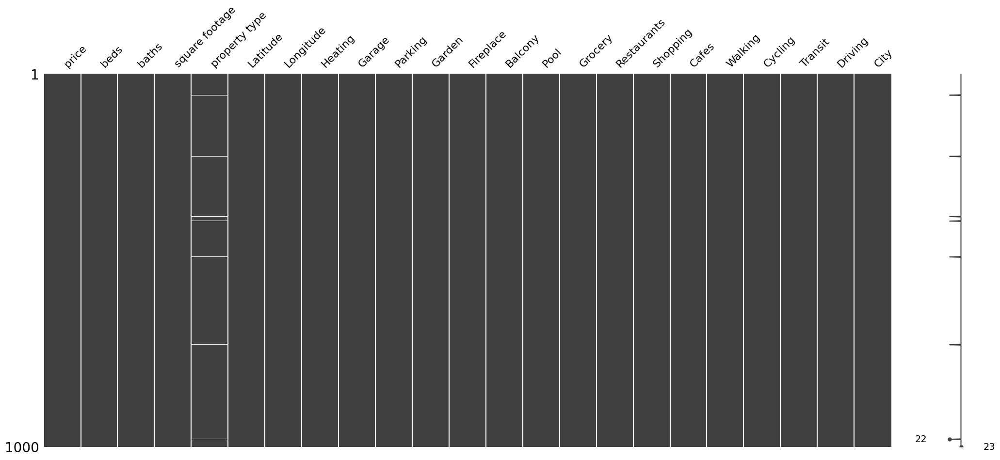

In [ ]:
msno.matrix(df_richmond)

<Axes: >

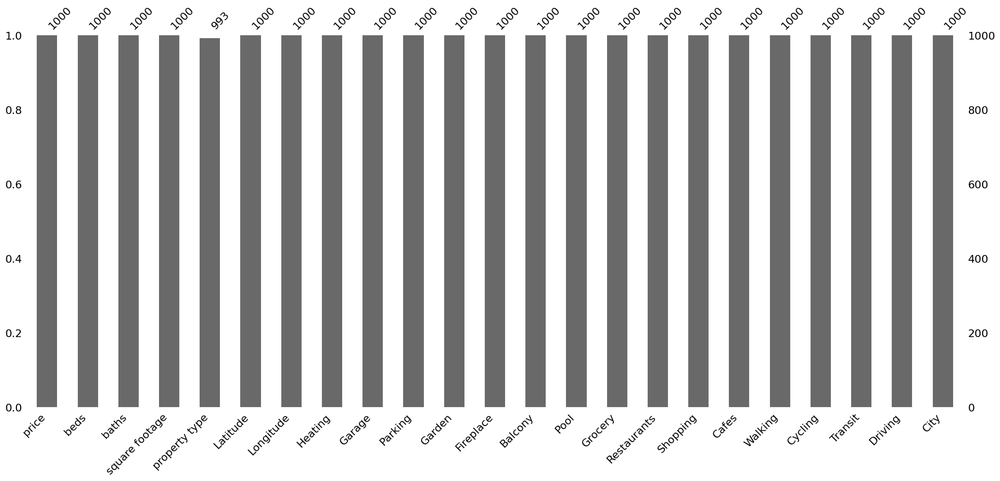

In [ ]:
msno.bar(df_richmond)

In [ ]:
missing_percent = df_richmond.isnull().mean()*100
print(missing_percent)

price             0.0
beds              0.0
baths             0.0
square footage    0.0
property type     0.7
Latitude          0.0
Longitude         0.0
Heating           0.0
Garage            0.0
Parking           0.0
Garden            0.0
Fireplace         0.0
Balcony           0.0
Pool              0.0
Grocery           0.0
Restaurants       0.0
Shopping          0.0
Cafes             0.0
Walking           0.0
Cycling           0.0
Transit           0.0
Driving           0.0
City              0.0
dtype: float64


In [ ]:
imputer = SimpleImputer(strategy='constant',fill_value='Unknown')
df_richmond['property type'] = imputer.fit_transform(df_richmond[['property type']]).ravel()
df_richmond['property type'].value_counts()

/tmp/ipython-input-143-3093602638.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_richmond['property type'] = imputer.fit_transform(df_richmond[['property type']]).ravel()


,count
property type,
condo,566
townhouse,213
house,205
duplex,9
Unknown,7


In [ ]:
cols = ['Garage', 'Parking', 'Garden', 'Fireplace', 'Balcony', 'Pool']
df_richmond[cols] = df_richmond[cols].applymap(apply_fun)
df_richmond

/tmp/ipython-input-144-3092717524.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_richmond[cols] = df_richmond[cols].applymap(apply_fun)
/tmp/ipython-input-144-3092717524.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_richmond[cols] = df_richmond[cols].applymap(apply_fun)


,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
2,650000,2,2,732.0,condo,49.179185,-123.120570,Geothermal,1,1,...,0,9.5,6.9,8.1,4.5,7.2,6.9,4.9,7.3,RICHMOND
19,3690000,3,3,2045.0,condo,49.176185,-123.147197,Heat Pump,1,1,...,0,8.0,8.4,5.3,4.6,9.6,9.9,5.6,9.6,RICHMOND
54,599900,1,1,738.0,condo,49.175680,-123.125519,Electric,1,1,...,0,5.3,9.5,5.0,4.7,7.7,8.0,8.4,4.0,RICHMOND
67,1395000,4,4,1679.0,townhouse,49.177802,-123.096142,Forced Air,1,1,...,0,8.5,6.0,8.6,4.3,5.4,6.2,6.7,3.8,RICHMOND
68,1388000,2,2,1068.0,condo,49.176548,-123.148416,Forced Air,1,1,...,0,5.1,9.4,6.6,8.4,8.4,4.8,8.0,9.5,RICHMOND
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,1040.0,condo,49.175504,-123.148569,Heat Pump,1,1,...,0,5.6,5.6,4.8,8.8,4.6,5.9,5.3,9.9,RICHMOND
10095,2780000,4,4,4370.0,house,49.154923,-123.146758,Baseboard,1,1,...,0,7.8,6.1,9.4,9.7,5.2,6.7,8.0,7.3,RICHMOND
10096,2599000,5,5,3952.0,house,49.144139,-123.097768,Radiant,1,1,...,0,8.3,8.6,8.5,6.0,5.8,9.4,6.9,8.3,RICHMOND
10098,769900,2,2,1070.0,townhouse,49.195527,-123.114621,Electric,1,1,...,0,5.3,5.3,4.5,8.2,9.5,5.0,5.7,7.6,RICHMOND


In [ ]:
df_richmond = df_richmond.drop(columns=['City'],axis=1)
df_richmond

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Balcony,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving
2,650000,2,2,732.0,condo,49.179185,-123.120570,Geothermal,1,1,...,1,0,9.5,6.9,8.1,4.5,7.2,6.9,4.9,7.3
19,3690000,3,3,2045.0,condo,49.176185,-123.147197,Heat Pump,1,1,...,1,0,8.0,8.4,5.3,4.6,9.6,9.9,5.6,9.6
54,599900,1,1,738.0,condo,49.175680,-123.125519,Electric,1,1,...,1,0,5.3,9.5,5.0,4.7,7.7,8.0,8.4,4.0
67,1395000,4,4,1679.0,townhouse,49.177802,-123.096142,Forced Air,1,1,...,1,0,8.5,6.0,8.6,4.3,5.4,6.2,6.7,3.8
68,1388000,2,2,1068.0,condo,49.176548,-123.148416,Forced Air,1,1,...,1,0,5.1,9.4,6.6,8.4,8.4,4.8,8.0,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,1040.0,condo,49.175504,-123.148569,Heat Pump,1,1,...,1,0,5.6,5.6,4.8,8.8,4.6,5.9,5.3,9.9
10095,2780000,4,4,4370.0,house,49.154923,-123.146758,Baseboard,1,1,...,0,0,7.8,6.1,9.4,9.7,5.2,6.7,8.0,7.3
10096,2599000,5,5,3952.0,house,49.144139,-123.097768,Radiant,1,1,...,0,0,8.3,8.6,8.5,6.0,5.8,9.4,6.9,8.3
10098,769900,2,2,1070.0,townhouse,49.195527,-123.114621,Electric,1,1,...,0,0,5.3,5.3,4.5,8.2,9.5,5.0,5.7,7.6


In [ ]:
df_sim_richmond = pd.get_dummies(df_richmond, columns=['Heating'], drop_first=False)
df_sim_richmond

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
2,650000,2,2,732.0,condo,49.179185,-123.120570,1,1,0,...,7.3,False,False,False,True,False,False,False,False,False
19,3690000,3,3,2045.0,condo,49.176185,-123.147197,1,1,1,...,9.6,False,False,False,False,True,False,False,False,False
54,599900,1,1,738.0,condo,49.175680,-123.125519,1,1,0,...,4.0,False,True,False,False,False,False,False,False,False
67,1395000,4,4,1679.0,townhouse,49.177802,-123.096142,1,1,0,...,3.8,False,False,True,False,False,False,False,False,False
68,1388000,2,2,1068.0,condo,49.176548,-123.148416,1,1,0,...,9.5,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,1040.0,condo,49.175504,-123.148569,1,1,1,...,9.9,False,False,False,False,True,False,False,False,False
10095,2780000,4,4,4370.0,house,49.154923,-123.146758,1,1,0,...,7.3,True,False,False,False,False,False,False,False,False
10096,2599000,5,5,3952.0,house,49.144139,-123.097768,1,1,0,...,8.3,False,False,False,False,False,False,False,False,True
10098,769900,2,2,1070.0,townhouse,49.195527,-123.114621,1,1,1,...,7.6,False,True,False,False,False,False,False,False,False


In [ ]:
df_richmond = pd.get_dummies(df_richmond, columns=['property type', 'Heating'], drop_first=False)
df_richmond

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
2,650000,2,2,732.0,49.179185,-123.120570,1,1,0,0,...,False,False,False,False,True,False,False,False,False,False
19,3690000,3,3,2045.0,49.176185,-123.147197,1,1,1,0,...,False,False,False,False,False,True,False,False,False,False
54,599900,1,1,738.0,49.175680,-123.125519,1,1,0,0,...,False,False,True,False,False,False,False,False,False,False
67,1395000,4,4,1679.0,49.177802,-123.096142,1,1,0,0,...,True,False,False,True,False,False,False,False,False,False
68,1388000,2,2,1068.0,49.176548,-123.148416,1,1,0,0,...,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,1040.0,49.175504,-123.148569,1,1,1,0,...,False,False,False,False,False,True,False,False,False,False
10095,2780000,4,4,4370.0,49.154923,-123.146758,1,1,0,1,...,False,True,False,False,False,False,False,False,False,False
10096,2599000,5,5,3952.0,49.144139,-123.097768,1,1,0,1,...,False,False,False,False,False,False,False,False,False,True
10098,769900,2,2,1070.0,49.195527,-123.114621,1,1,1,1,...,True,False,True,False,False,False,False,False,False,False


In [ ]:
cols = ['Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_sim_richmond[cols] = df_sim_richmond[cols].applymap(transform_integer)
df_sim_richmond

/tmp/ipython-input-148-2154274483.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_sim_richmond[cols] = df_sim_richmond[cols].applymap(transform_integer)


,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
2,650000,2,2,732.0,condo,49.179185,-123.120570,1,1,0,...,7.3,0,0,0,1,0,0,0,0,0
19,3690000,3,3,2045.0,condo,49.176185,-123.147197,1,1,1,...,9.6,0,0,0,0,1,0,0,0,0
54,599900,1,1,738.0,condo,49.175680,-123.125519,1,1,0,...,4.0,0,1,0,0,0,0,0,0,0
67,1395000,4,4,1679.0,townhouse,49.177802,-123.096142,1,1,0,...,3.8,0,0,1,0,0,0,0,0,0
68,1388000,2,2,1068.0,condo,49.176548,-123.148416,1,1,0,...,9.5,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,1040.0,condo,49.175504,-123.148569,1,1,1,...,9.9,0,0,0,0,1,0,0,0,0
10095,2780000,4,4,4370.0,house,49.154923,-123.146758,1,1,0,...,7.3,1,0,0,0,0,0,0,0,0
10096,2599000,5,5,3952.0,house,49.144139,-123.097768,1,1,0,...,8.3,0,0,0,0,0,0,0,0,1
10098,769900,2,2,1070.0,townhouse,49.195527,-123.114621,1,1,1,...,7.6,0,1,0,0,0,0,0,0,0


In [ ]:
cols = ['property type_Unknown', 'property type_condo',
       'property type_duplex', 'property type_house',
       'property type_townhouse', 'Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_richmond[cols] = df_richmond[cols].applymap(transform_integer)
df_richmond

/tmp/ipython-input-149-4285083010.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_richmond[cols] = df_richmond[cols].applymap(transform_integer)


,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
2,650000,2,2,732.0,49.179185,-123.120570,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0
19,3690000,3,3,2045.0,49.176185,-123.147197,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
54,599900,1,1,738.0,49.175680,-123.125519,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
67,1395000,4,4,1679.0,49.177802,-123.096142,1,1,0,0,...,1,0,0,1,0,0,0,0,0,0
68,1388000,2,2,1068.0,49.176548,-123.148416,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,1040.0,49.175504,-123.148569,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
10095,2780000,4,4,4370.0,49.154923,-123.146758,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
10096,2599000,5,5,3952.0,49.144139,-123.097768,1,1,0,1,...,0,0,0,0,0,0,0,0,0,1
10098,769900,2,2,1070.0,49.195527,-123.114621,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0


In [ ]:
df_scaled_richmond= scaler(df_richmond,['square footage'])
df_scaled_richmond

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
2,650000,2,2,0.115909,49.179185,-123.120570,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0
19,3690000,3,3,0.364583,49.176185,-123.147197,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
54,599900,1,1,0.117045,49.175680,-123.125519,1,1,0,0,...,0,0,1,0,0,0,0,0,0,0
67,1395000,4,4,0.295265,49.177802,-123.096142,1,1,0,0,...,1,0,0,1,0,0,0,0,0,0
68,1388000,2,2,0.179545,49.176548,-123.148416,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,0.174242,49.175504,-123.148569,1,1,1,0,...,0,0,0,0,0,1,0,0,0,0
10095,2780000,4,4,0.804924,49.154923,-123.146758,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
10096,2599000,5,5,0.725758,49.144139,-123.097768,1,1,0,1,...,0,0,0,0,0,0,0,0,0,1
10098,769900,2,2,0.179924,49.195527,-123.114621,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0


In [ ]:
df_sim_richmond=  scaler(df_sim_richmond,['square footage'])
df_sim_richmond

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
2,650000,2,2,0.115909,condo,49.179185,-123.120570,1,1,0,...,7.3,0,0,0,1,0,0,0,0,0
19,3690000,3,3,0.364583,condo,49.176185,-123.147197,1,1,1,...,9.6,0,0,0,0,1,0,0,0,0
54,599900,1,1,0.117045,condo,49.175680,-123.125519,1,1,0,...,4.0,0,1,0,0,0,0,0,0,0
67,1395000,4,4,0.295265,townhouse,49.177802,-123.096142,1,1,0,...,3.8,0,0,1,0,0,0,0,0,0
68,1388000,2,2,0.179545,condo,49.176548,-123.148416,1,1,0,...,9.5,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,1388000,2,2,0.174242,condo,49.175504,-123.148569,1,1,1,...,9.9,0,0,0,0,1,0,0,0,0
10095,2780000,4,4,0.804924,house,49.154923,-123.146758,1,1,0,...,7.3,1,0,0,0,0,0,0,0,0
10096,2599000,5,5,0.725758,house,49.144139,-123.097768,1,1,0,...,8.3,0,0,0,0,0,0,0,0,1
10098,769900,2,2,0.179924,townhouse,49.195527,-123.114621,1,1,1,...,7.6,0,1,0,0,0,0,0,0,0


### West Vancouver

<Axes: >

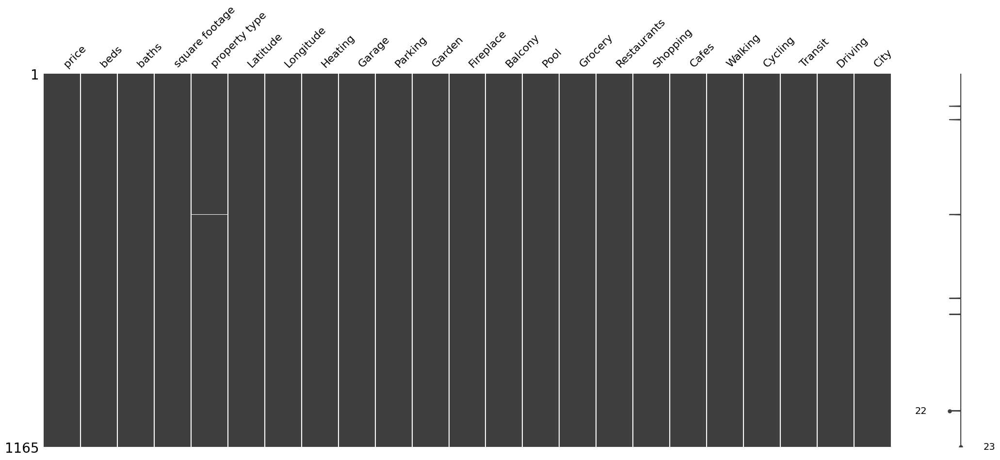

In [ ]:
msno.matrix(df_w_vancouver)

<Axes: >

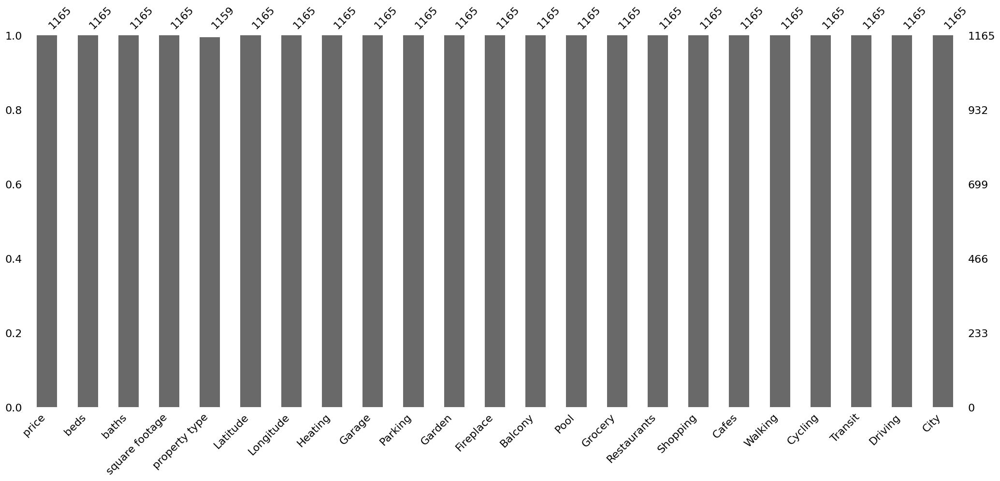

In [ ]:
msno.bar(df_w_vancouver)

In [ ]:
missing_percent = df_w_vancouver.isnull().mean()*100
print(missing_percent)

price             0.000000
beds              0.000000
baths             0.000000
square footage    0.000000
property type     0.515021
Latitude          0.000000
Longitude         0.000000
Heating           0.000000
Garage            0.000000
Parking           0.000000
Garden            0.000000
Fireplace         0.000000
Balcony           0.000000
Pool              0.000000
Grocery           0.000000
Restaurants       0.000000
Shopping          0.000000
Cafes             0.000000
Walking           0.000000
Cycling           0.000000
Transit           0.000000
Driving           0.000000
City              0.000000
dtype: float64


In [ ]:
imputer = SimpleImputer(strategy='constant',fill_value='Unknown')
df_w_vancouver['property type'] = imputer.fit_transform(df_w_vancouver[['property type']]).ravel()
df_w_vancouver['property type'].value_counts()

/tmp/ipython-input-155-1223683588.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_w_vancouver['property type'] = imputer.fit_transform(df_w_vancouver[['property type']]).ravel()


,count
property type,
house,874
condo,230
townhouse,45
duplex,10
Unknown,6


In [ ]:
cols = ['Garage', 'Parking', 'Garden', 'Fireplace', 'Balcony', 'Pool']
df_w_vancouver[cols] = df_w_vancouver[cols].applymap(apply_fun)
df_w_vancouver

/tmp/ipython-input-156-2834426566.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_w_vancouver[cols] = df_w_vancouver[cols].applymap(apply_fun)
/tmp/ipython-input-156-2834426566.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_w_vancouver[cols] = df_w_vancouver[cols].applymap(apply_fun)


,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
198,999000,2,2,1286.0,condo,49.326391,-123.134442,Baseboard,1,1,...,0,9.8,5.7,5.9,7.2,5.5,6.6,7.3,7.2,WEST VANCOUVER
272,999900,2,2,780.0,condo,49.325654,-123.124699,Forced Air,1,1,...,0,6.9,9.1,9.1,8.8,5.9,6.5,8.0,8.3,WEST VANCOUVER
529,1399900,2,2,1029.0,condo,49.325654,-123.124701,Forced Air,1,1,...,0,6.2,10.0,5.1,5.0,9.1,5.8,9.4,8.2,WEST VANCOUVER
1030,169900,1,1,456.0,house,49.323967,-123.133471,Electric,0,1,...,0,6.2,6.7,6.1,7.9,5.8,8.6,9.8,6.5,WEST VANCOUVER
1409,789900,1,1,523.0,condo,49.325657,-123.124712,Forced Air,1,1,...,0,6.3,8.4,5.2,9.3,9.6,6.0,6.2,6.8,WEST VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,house,49.340936,-123.202161,Forced Air,1,1,...,0,9.1,5.1,4.7,6.4,9.4,9.4,7.5,6.7,WEST VANCOUVER
16286,2891000,4,4,2640.0,house,49.331369,-123.156732,Forced Air,0,1,...,0,9.4,6.1,5.2,8.9,9.5,5.0,9.6,8.0,WEST VANCOUVER
16287,2698750,2,2,732.0,house,49.331148,-123.156726,Forced Air,0,1,...,0,8.2,6.2,9.0,8.8,6.1,7.6,4.9,6.0,WEST VANCOUVER
16295,4238000,4,4,3864.0,house,49.367367,-123.283567,Forced Air,1,1,...,0,9.4,6.1,7.6,7.9,8.3,4.8,9.4,4.9,WEST VANCOUVER


In [ ]:
df_w_vancouver = df_w_vancouver.drop(columns=['City'],axis=1)
df_w_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Balcony,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving
198,999000,2,2,1286.0,condo,49.326391,-123.134442,Baseboard,1,1,...,1,0,9.8,5.7,5.9,7.2,5.5,6.6,7.3,7.2
272,999900,2,2,780.0,condo,49.325654,-123.124699,Forced Air,1,1,...,1,0,6.9,9.1,9.1,8.8,5.9,6.5,8.0,8.3
529,1399900,2,2,1029.0,condo,49.325654,-123.124701,Forced Air,1,1,...,1,0,6.2,10.0,5.1,5.0,9.1,5.8,9.4,8.2
1030,169900,1,1,456.0,house,49.323967,-123.133471,Electric,0,1,...,0,0,6.2,6.7,6.1,7.9,5.8,8.6,9.8,6.5
1409,789900,1,1,523.0,condo,49.325657,-123.124712,Forced Air,1,1,...,1,0,6.3,8.4,5.2,9.3,9.6,6.0,6.2,6.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,house,49.340936,-123.202161,Forced Air,1,1,...,1,0,9.1,5.1,4.7,6.4,9.4,9.4,7.5,6.7
16286,2891000,4,4,2640.0,house,49.331369,-123.156732,Forced Air,0,1,...,0,0,9.4,6.1,5.2,8.9,9.5,5.0,9.6,8.0
16287,2698750,2,2,732.0,house,49.331148,-123.156726,Forced Air,0,1,...,0,0,8.2,6.2,9.0,8.8,6.1,7.6,4.9,6.0
16295,4238000,4,4,3864.0,house,49.367367,-123.283567,Forced Air,1,1,...,0,0,9.4,6.1,7.6,7.9,8.3,4.8,9.4,4.9


In [ ]:
df_sim_w_vancouver = pd.get_dummies(df_w_vancouver, columns=['Heating'], drop_first=False)
df_sim_w_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
198,999000,2,2,1286.0,condo,49.326391,-123.134442,1,1,1,...,7.2,True,False,False,False,False,False,False,False,False
272,999900,2,2,780.0,condo,49.325654,-123.124699,1,1,0,...,8.3,False,False,True,False,False,False,False,False,False
529,1399900,2,2,1029.0,condo,49.325654,-123.124701,1,1,0,...,8.2,False,False,True,False,False,False,False,False,False
1030,169900,1,1,456.0,house,49.323967,-123.133471,0,1,0,...,6.5,False,True,False,False,False,False,False,False,False
1409,789900,1,1,523.0,condo,49.325657,-123.124712,1,1,1,...,6.8,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,house,49.340936,-123.202161,1,1,1,...,6.7,False,False,True,False,False,False,False,False,False
16286,2891000,4,4,2640.0,house,49.331369,-123.156732,0,1,0,...,8.0,False,False,True,False,False,False,False,False,False
16287,2698750,2,2,732.0,house,49.331148,-123.156726,0,1,0,...,6.0,False,False,True,False,False,False,False,False,False
16295,4238000,4,4,3864.0,house,49.367367,-123.283567,1,1,0,...,4.9,False,False,True,False,False,False,False,False,False


In [ ]:
df_w_vancouver = pd.get_dummies(df_w_vancouver, columns=['property type', 'Heating'], drop_first=False)
df_w_vancouver

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
198,999000,2,2,1286.0,49.326391,-123.134442,1,1,1,1,...,False,True,False,False,False,False,False,False,False,False
272,999900,2,2,780.0,49.325654,-123.124699,1,1,0,0,...,False,False,False,True,False,False,False,False,False,False
529,1399900,2,2,1029.0,49.325654,-123.124701,1,1,0,0,...,False,False,False,True,False,False,False,False,False,False
1030,169900,1,1,456.0,49.323967,-123.133471,0,1,0,1,...,False,False,True,False,False,False,False,False,False,False
1409,789900,1,1,523.0,49.325657,-123.124712,1,1,1,0,...,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,49.340936,-123.202161,1,1,1,1,...,False,False,False,True,False,False,False,False,False,False
16286,2891000,4,4,2640.0,49.331369,-123.156732,0,1,0,1,...,False,False,False,True,False,False,False,False,False,False
16287,2698750,2,2,732.0,49.331148,-123.156726,0,1,0,1,...,False,False,False,True,False,False,False,False,False,False
16295,4238000,4,4,3864.0,49.367367,-123.283567,1,1,0,1,...,False,False,False,True,False,False,False,False,False,False


In [ ]:
cols = ['Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_sim_w_vancouver[cols] = df_sim_w_vancouver[cols].applymap(transform_integer)
df_sim_w_vancouver

/tmp/ipython-input-160-1820689903.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_sim_w_vancouver[cols] = df_sim_w_vancouver[cols].applymap(transform_integer)


,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
198,999000,2,2,1286.0,condo,49.326391,-123.134442,1,1,1,...,7.2,1,0,0,0,0,0,0,0,0
272,999900,2,2,780.0,condo,49.325654,-123.124699,1,1,0,...,8.3,0,0,1,0,0,0,0,0,0
529,1399900,2,2,1029.0,condo,49.325654,-123.124701,1,1,0,...,8.2,0,0,1,0,0,0,0,0,0
1030,169900,1,1,456.0,house,49.323967,-123.133471,0,1,0,...,6.5,0,1,0,0,0,0,0,0,0
1409,789900,1,1,523.0,condo,49.325657,-123.124712,1,1,1,...,6.8,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,house,49.340936,-123.202161,1,1,1,...,6.7,0,0,1,0,0,0,0,0,0
16286,2891000,4,4,2640.0,house,49.331369,-123.156732,0,1,0,...,8.0,0,0,1,0,0,0,0,0,0
16287,2698750,2,2,732.0,house,49.331148,-123.156726,0,1,0,...,6.0,0,0,1,0,0,0,0,0,0
16295,4238000,4,4,3864.0,house,49.367367,-123.283567,1,1,0,...,4.9,0,0,1,0,0,0,0,0,0


In [ ]:
cols = ['property type_Unknown', 'property type_condo',
       'property type_duplex', 'property type_house',
       'property type_townhouse', 'Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_w_vancouver[cols] = df_w_vancouver[cols].applymap(transform_integer)
df_w_vancouver

/tmp/ipython-input-161-1584545193.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_w_vancouver[cols] = df_w_vancouver[cols].applymap(transform_integer)


,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
198,999000,2,2,1286.0,49.326391,-123.134442,1,1,1,1,...,0,1,0,0,0,0,0,0,0,0
272,999900,2,2,780.0,49.325654,-123.124699,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
529,1399900,2,2,1029.0,49.325654,-123.124701,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
1030,169900,1,1,456.0,49.323967,-123.133471,0,1,0,1,...,0,0,1,0,0,0,0,0,0,0
1409,789900,1,1,523.0,49.325657,-123.124712,1,1,1,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,5963.0,49.340936,-123.202161,1,1,1,1,...,0,0,0,1,0,0,0,0,0,0
16286,2891000,4,4,2640.0,49.331369,-123.156732,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
16287,2698750,2,2,732.0,49.331148,-123.156726,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
16295,4238000,4,4,3864.0,49.367367,-123.283567,1,1,0,1,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
df_scaled_w_vancouver= scaler(df_w_vancouver,['square footage'])
df_scaled_w_vancouver

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
198,999000,2,2,0.103439,49.326391,-123.134442,1,1,1,1,...,0,1,0,0,0,0,0,0,0,0
272,999900,2,2,0.059270,49.325654,-123.124699,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
529,1399900,2,2,0.081006,49.325654,-123.124701,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
1030,169900,1,1,0.030988,49.323967,-123.133471,0,1,0,1,...,0,0,1,0,0,0,0,0,0,0
1409,789900,1,1,0.036837,49.325657,-123.124712,1,1,1,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,0.511697,49.340936,-123.202161,1,1,1,1,...,0,0,0,1,0,0,0,0,0,0
16286,2891000,4,4,0.221631,49.331369,-123.156732,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
16287,2698750,2,2,0.055080,49.331148,-123.156726,0,1,0,1,...,0,0,0,1,0,0,0,0,0,0
16295,4238000,4,4,0.328474,49.367367,-123.283567,1,1,0,1,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
df_sim_w_vancouver=  scaler(df_sim_w_vancouver,['square footage'])
df_sim_w_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
198,999000,2,2,0.103439,condo,49.326391,-123.134442,1,1,1,...,7.2,1,0,0,0,0,0,0,0,0
272,999900,2,2,0.059270,condo,49.325654,-123.124699,1,1,0,...,8.3,0,0,1,0,0,0,0,0,0
529,1399900,2,2,0.081006,condo,49.325654,-123.124701,1,1,0,...,8.2,0,0,1,0,0,0,0,0,0
1030,169900,1,1,0.030988,house,49.323967,-123.133471,0,1,0,...,6.5,0,1,0,0,0,0,0,0,0
1409,789900,1,1,0.036837,condo,49.325657,-123.124712,1,1,1,...,6.8,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,0.511697,house,49.340936,-123.202161,1,1,1,...,6.7,0,0,1,0,0,0,0,0,0
16286,2891000,4,4,0.221631,house,49.331369,-123.156732,0,1,0,...,8.0,0,0,1,0,0,0,0,0,0
16287,2698750,2,2,0.055080,house,49.331148,-123.156726,0,1,0,...,6.0,0,0,1,0,0,0,0,0,0
16295,4238000,4,4,0.328474,house,49.367367,-123.283567,1,1,0,...,4.9,0,0,1,0,0,0,0,0,0


### North Vancouver

<Axes: >

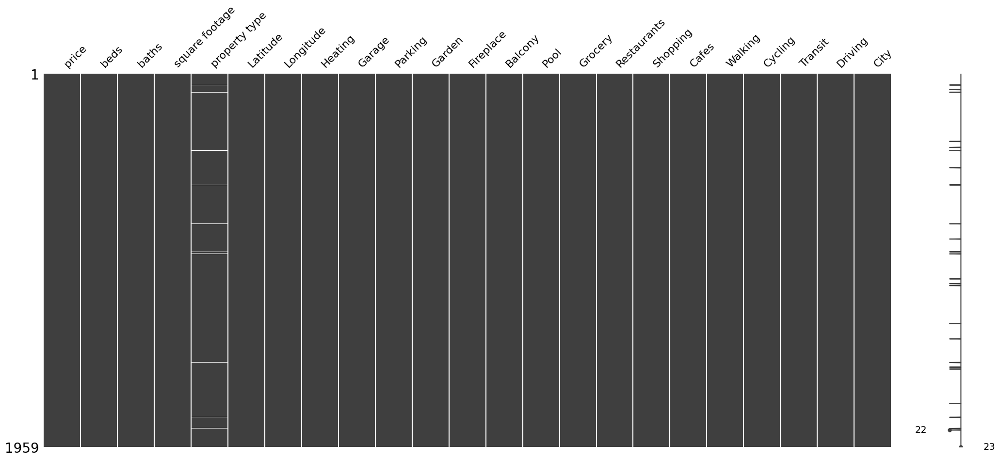

In [ ]:
msno.matrix(df_n_vancouver)

<Axes: >

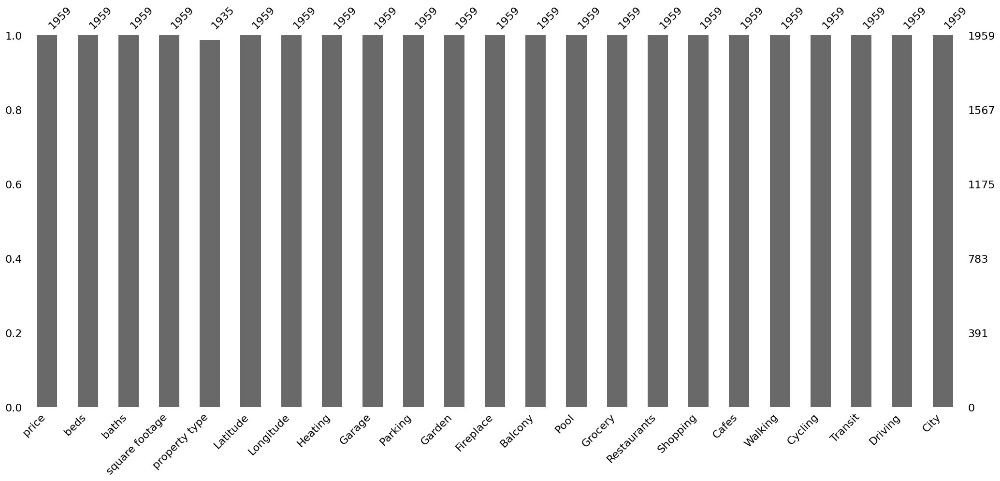

In [ ]:
msno.bar(df_n_vancouver)

In [ ]:
missing_percent = df_n_vancouver.isnull().mean()*100
print(missing_percent)

price             0.000000
beds              0.000000
baths             0.000000
square footage    0.000000
property type     1.225115
Latitude          0.000000
Longitude         0.000000
Heating           0.000000
Garage            0.000000
Parking           0.000000
Garden            0.000000
Fireplace         0.000000
Balcony           0.000000
Pool              0.000000
Grocery           0.000000
Restaurants       0.000000
Shopping          0.000000
Cafes             0.000000
Walking           0.000000
Cycling           0.000000
Transit           0.000000
Driving           0.000000
City              0.000000
dtype: float64


In [ ]:
imputer = SimpleImputer(strategy='constant',fill_value='Unknown')
df_n_vancouver['property type'] = imputer.fit_transform(df_n_vancouver[['property type']]).ravel()
df_n_vancouver['property type'].value_counts()

/tmp/ipython-input-167-2197598814.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_n_vancouver['property type'] = imputer.fit_transform(df_n_vancouver[['property type']]).ravel()


,count
property type,
condo,908
house,688
townhouse,290
duplex,49
Unknown,24


In [ ]:
cols = ['Garage', 'Parking', 'Garden', 'Fireplace', 'Balcony', 'Pool']
df_n_vancouver[cols] = df_n_vancouver[cols].applymap(apply_fun)
df_n_vancouver

/tmp/ipython-input-168-3724234082.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_n_vancouver[cols] = df_n_vancouver[cols].applymap(apply_fun)
/tmp/ipython-input-168-3724234082.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_n_vancouver[cols] = df_n_vancouver[cols].applymap(apply_fun)


,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving,City
6,799000,1,1,980.0,condo,49.311136,-123.083163,Baseboard,1,1,...,0,6.1,8.0,4.5,5.8,6.2,8.2,6.2,6.8,NORTH VANCOUVER
20,679900,2,2,1025.0,condo,49.324933,-123.070351,Baseboard,1,1,...,0,8.2,6.9,9.0,7.9,9.1,9.9,9.6,3.9,NORTH VANCOUVER
35,899000,2,2,1030.0,condo,49.322862,-123.073689,Baseboard,1,1,...,0,7.7,6.0,5.3,5.5,6.4,9.3,6.2,7.9,NORTH VANCOUVER
37,1619000,3,3,1822.0,townhouse,49.315391,-123.067135,Baseboard,1,1,...,0,5.8,7.5,5.0,10.0,5.7,5.7,7.7,6.2,NORTH VANCOUVER
43,1124000,2,2,898.0,condo,49.324853,-123.122521,Heat Pump,1,1,...,0,9.5,7.1,8.5,9.2,6.8,6.7,8.8,3.6,NORTH VANCOUVER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,880.0,condo,49.319716,-123.070948,Forced Air,1,1,...,0,8.9,6.7,9.1,5.0,7.9,9.9,5.7,8.0,NORTH VANCOUVER
16129,835000,2,2,875.0,condo,49.323860,-123.101307,Electric,1,1,...,0,6.0,6.3,7.5,9.8,9.8,5.5,8.1,5.9,NORTH VANCOUVER
16144,3998000,5,5,4266.0,house,49.334973,-123.081166,Heat Pump,1,1,...,0,5.5,8.9,7.6,8.5,5.1,7.0,5.5,9.7,NORTH VANCOUVER
16178,1498000,2,2,1144.0,condo,49.309479,-123.078324,Forced Air,1,1,...,0,6.6,6.1,9.2,9.9,7.6,5.6,5.2,5.3,NORTH VANCOUVER


In [ ]:
df_n_vancouver = df_n_vancouver.drop(columns=['City'],axis=1)
df_n_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Heating,Garage,Parking,...,Balcony,Pool,Grocery,Restaurants,Shopping,Cafes,Walking,Cycling,Transit,Driving
6,799000,1,1,980.0,condo,49.311136,-123.083163,Baseboard,1,1,...,1,0,6.1,8.0,4.5,5.8,6.2,8.2,6.2,6.8
20,679900,2,2,1025.0,condo,49.324933,-123.070351,Baseboard,1,1,...,1,0,8.2,6.9,9.0,7.9,9.1,9.9,9.6,3.9
35,899000,2,2,1030.0,condo,49.322862,-123.073689,Baseboard,1,1,...,1,0,7.7,6.0,5.3,5.5,6.4,9.3,6.2,7.9
37,1619000,3,3,1822.0,townhouse,49.315391,-123.067135,Baseboard,1,1,...,0,0,5.8,7.5,5.0,10.0,5.7,5.7,7.7,6.2
43,1124000,2,2,898.0,condo,49.324853,-123.122521,Heat Pump,1,1,...,1,0,9.5,7.1,8.5,9.2,6.8,6.7,8.8,3.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,880.0,condo,49.319716,-123.070948,Forced Air,1,1,...,1,0,8.9,6.7,9.1,5.0,7.9,9.9,5.7,8.0
16129,835000,2,2,875.0,condo,49.323860,-123.101307,Electric,1,1,...,1,0,6.0,6.3,7.5,9.8,9.8,5.5,8.1,5.9
16144,3998000,5,5,4266.0,house,49.334973,-123.081166,Heat Pump,1,1,...,1,0,5.5,8.9,7.6,8.5,5.1,7.0,5.5,9.7
16178,1498000,2,2,1144.0,condo,49.309479,-123.078324,Forced Air,1,1,...,1,0,6.6,6.1,9.2,9.9,7.6,5.6,5.2,5.3


In [ ]:
df_sim_n_vancouver = pd.get_dummies(df_n_vancouver, columns=['Heating'], drop_first=False)
df_sim_n_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
6,799000,1,1,980.0,condo,49.311136,-123.083163,1,1,0,...,6.8,True,False,False,False,False,False,False,False,False
20,679900,2,2,1025.0,condo,49.324933,-123.070351,1,1,0,...,3.9,True,False,False,False,False,False,False,False,False
35,899000,2,2,1030.0,condo,49.322862,-123.073689,1,1,1,...,7.9,True,False,False,False,False,False,False,False,False
37,1619000,3,3,1822.0,townhouse,49.315391,-123.067135,1,1,0,...,6.2,True,False,False,False,False,False,False,False,False
43,1124000,2,2,898.0,condo,49.324853,-123.122521,1,1,0,...,3.6,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,880.0,condo,49.319716,-123.070948,1,1,1,...,8.0,False,False,True,False,False,False,False,False,False
16129,835000,2,2,875.0,condo,49.323860,-123.101307,1,1,0,...,5.9,False,True,False,False,False,False,False,False,False
16144,3998000,5,5,4266.0,house,49.334973,-123.081166,1,1,0,...,9.7,False,False,False,False,True,False,False,False,False
16178,1498000,2,2,1144.0,condo,49.309479,-123.078324,1,1,0,...,5.3,False,False,True,False,False,False,False,False,False


In [ ]:
df_n_vancouver = pd.get_dummies(df_n_vancouver, columns=['property type', 'Heating'], drop_first=False)
df_n_vancouver

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
6,799000,1,1,980.0,49.311136,-123.083163,1,1,0,1,...,False,True,False,False,False,False,False,False,False,False
20,679900,2,2,1025.0,49.324933,-123.070351,1,1,0,1,...,False,True,False,False,False,False,False,False,False,False
35,899000,2,2,1030.0,49.322862,-123.073689,1,1,1,1,...,False,True,False,False,False,False,False,False,False,False
37,1619000,3,3,1822.0,49.315391,-123.067135,1,1,0,1,...,True,True,False,False,False,False,False,False,False,False
43,1124000,2,2,898.0,49.324853,-123.122521,1,1,0,0,...,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,880.0,49.319716,-123.070948,1,1,1,0,...,False,False,False,True,False,False,False,False,False,False
16129,835000,2,2,875.0,49.323860,-123.101307,1,1,0,1,...,False,False,True,False,False,False,False,False,False,False
16144,3998000,5,5,4266.0,49.334973,-123.081166,1,1,0,1,...,False,False,False,False,False,True,False,False,False,False
16178,1498000,2,2,1144.0,49.309479,-123.078324,1,1,0,0,...,False,False,False,True,False,False,False,False,False,False


In [ ]:
cols = ['Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_sim_n_vancouver[cols] = df_sim_n_vancouver[cols].applymap(transform_integer)
df_sim_n_vancouver

/tmp/ipython-input-172-3047048308.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_sim_n_vancouver[cols] = df_sim_n_vancouver[cols].applymap(transform_integer)


,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
6,799000,1,1,980.0,condo,49.311136,-123.083163,1,1,0,...,6.8,1,0,0,0,0,0,0,0,0
20,679900,2,2,1025.0,condo,49.324933,-123.070351,1,1,0,...,3.9,1,0,0,0,0,0,0,0,0
35,899000,2,2,1030.0,condo,49.322862,-123.073689,1,1,1,...,7.9,1,0,0,0,0,0,0,0,0
37,1619000,3,3,1822.0,townhouse,49.315391,-123.067135,1,1,0,...,6.2,1,0,0,0,0,0,0,0,0
43,1124000,2,2,898.0,condo,49.324853,-123.122521,1,1,0,...,3.6,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,880.0,condo,49.319716,-123.070948,1,1,1,...,8.0,0,0,1,0,0,0,0,0,0
16129,835000,2,2,875.0,condo,49.323860,-123.101307,1,1,0,...,5.9,0,1,0,0,0,0,0,0,0
16144,3998000,5,5,4266.0,house,49.334973,-123.081166,1,1,0,...,9.7,0,0,0,0,1,0,0,0,0
16178,1498000,2,2,1144.0,condo,49.309479,-123.078324,1,1,0,...,5.3,0,0,1,0,0,0,0,0,0


In [ ]:
cols = ['property type_Unknown', 'property type_condo',
       'property type_duplex', 'property type_house',
       'property type_townhouse', 'Heating_Baseboard', 'Heating_Electric',
       'Heating_Forced Air', 'Heating_Geothermal', 'Heating_Heat Pump',
       'Heating_Hot Water', 'Heating_Natural Gas', 'Heating_Other',
       'Heating_Radiant']
df_n_vancouver[cols] = df_n_vancouver[cols].applymap(transform_integer)
df_n_vancouver

/tmp/ipython-input-173-2192395039.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_n_vancouver[cols] = df_n_vancouver[cols].applymap(transform_integer)


,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
6,799000,1,1,980.0,49.311136,-123.083163,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
20,679900,2,2,1025.0,49.324933,-123.070351,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
35,899000,2,2,1030.0,49.322862,-123.073689,1,1,1,1,...,0,1,0,0,0,0,0,0,0,0
37,1619000,3,3,1822.0,49.315391,-123.067135,1,1,0,1,...,1,1,0,0,0,0,0,0,0,0
43,1124000,2,2,898.0,49.324853,-123.122521,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,880.0,49.319716,-123.070948,1,1,1,0,...,0,0,0,1,0,0,0,0,0,0
16129,835000,2,2,875.0,49.323860,-123.101307,1,1,0,1,...,0,0,1,0,0,0,0,0,0,0
16144,3998000,5,5,4266.0,49.334973,-123.081166,1,1,0,1,...,0,0,0,0,0,1,0,0,0,0
16178,1498000,2,2,1144.0,49.309479,-123.078324,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
df_scaled_n_vancouver= scaler(df_n_vancouver,['square footage'])
df_scaled_n_vancouver

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
6,799000,1,1,0.097135,49.311136,-123.083163,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
20,679900,2,2,0.105244,49.324933,-123.070351,1,1,0,1,...,0,1,0,0,0,0,0,0,0,0
35,899000,2,2,0.106145,49.322862,-123.073689,1,1,1,1,...,0,1,0,0,0,0,0,0,0,0
37,1619000,3,3,0.248874,49.315391,-123.067135,1,1,0,1,...,1,1,0,0,0,0,0,0,0,0
43,1124000,2,2,0.082357,49.324853,-123.122521,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,0.079113,49.319716,-123.070948,1,1,1,0,...,0,0,0,1,0,0,0,0,0,0
16129,835000,2,2,0.078212,49.323860,-123.101307,1,1,0,1,...,0,0,1,0,0,0,0,0,0,0
16144,3998000,5,5,0.689313,49.334973,-123.081166,1,1,0,1,...,0,0,0,0,0,1,0,0,0,0
16178,1498000,2,2,0.126689,49.309479,-123.078324,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
df_sim_n_vancouver=  scaler(df_sim_n_vancouver,['square footage'])
df_sim_n_vancouver

,price,beds,baths,square footage,property type,Latitude,Longitude,Garage,Parking,Garden,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
6,799000,1,1,0.097135,condo,49.311136,-123.083163,1,1,0,...,6.8,1,0,0,0,0,0,0,0,0
20,679900,2,2,0.105244,condo,49.324933,-123.070351,1,1,0,...,3.9,1,0,0,0,0,0,0,0,0
35,899000,2,2,0.106145,condo,49.322862,-123.073689,1,1,1,...,7.9,1,0,0,0,0,0,0,0,0
37,1619000,3,3,0.248874,townhouse,49.315391,-123.067135,1,1,0,...,6.2,1,0,0,0,0,0,0,0,0
43,1124000,2,2,0.082357,condo,49.324853,-123.122521,1,1,0,...,3.6,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15974,1339900,2,2,0.079113,condo,49.319716,-123.070948,1,1,1,...,8.0,0,0,1,0,0,0,0,0,0
16129,835000,2,2,0.078212,condo,49.323860,-123.101307,1,1,0,...,5.9,0,1,0,0,0,0,0,0,0
16144,3998000,5,5,0.689313,house,49.334973,-123.081166,1,1,0,...,9.7,0,0,0,0,1,0,0,0,0
16178,1498000,2,2,0.126689,condo,49.309479,-123.078324,1,1,0,...,5.3,0,0,1,0,0,0,0,0,0


### PCA

In [ ]:
X_tmp = df_scaled_vancouver.drop(columns=['price'],axis=1)
X_tmp

,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,Balcony,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
0,2,2,0.104185,49.275734,-123.101635,1,1,0,1,1,...,0,0,1,0,0,0,0,0,0,0
1,2,2,0.150072,49.274663,-123.112380,1,1,0,1,1,...,0,1,0,0,0,0,0,0,0,0
4,2,2,0.117172,49.287694,-123.125721,1,1,1,1,1,...,0,0,1,0,0,0,0,0,0,0
5,2,2,0.145455,49.269413,-123.111259,1,1,0,0,1,...,1,0,1,0,0,0,0,0,0,0
7,0,0,0.047908,49.288179,-123.127755,1,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,4,4,0.598846,49.252858,-123.130726,1,1,0,1,1,...,0,0,0,1,0,0,0,0,0,0
16301,5,5,0.307359,49.252931,-123.064532,0,1,0,1,0,...,0,0,1,0,0,0,0,0,0,0
16302,6,6,0.272727,49.262273,-123.046440,1,1,0,1,0,...,0,0,1,0,0,0,0,0,0,0
16304,6,6,0.260029,49.257877,-123.088942,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
pca = PCA()
X_pca = pca.fit_transform(X_tmp)

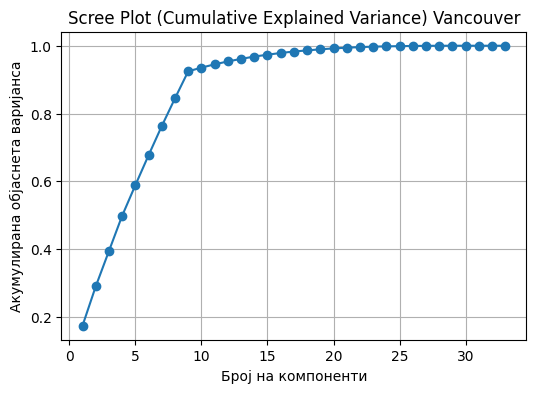

In [ ]:
plt.figure(figsize=(6,4))
plt.plot(range(1, len(X_tmp.columns)+1), pca.explained_variance_ratio_.cumsum(), marker='o')
plt.title('Scree Plot (Cumulative Explained Variance) Vancouver')
plt.xlabel('Број на компоненти')
plt.ylabel('Акумулирана објаснета варијанса')
plt.grid(True)
plt.show()

In [ ]:
y = df_scaled_vancouver['price']

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X_pca,y,test_size=0.2)

In [ ]:
scaler = MinMaxScaler()
y_train = scaler.fit_transform(y_train.values.reshape(-1,1))

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[ 1.38875544e-02  1.69710173e-03 -6.34789225e-04 -1.82060966e-04
  -3.58902407e-04  4.39738577e-04 -2.93263749e-04 -5.77777349e-05
  -5.11384335e-05 -4.00033929e-04 -6.93349548e-03 -1.39699310e-03
   4.76318886e-03  1.17710119e-02  5.68310197e-03 -7.68068217e-03
  -1.09122033e-02  7.69543930e-03  3.29490741e-02  2.30150559e-02
   9.92872211e-03  1.36673835e-02 -2.85843690e-03  2.47240418e-02
  -1.58496959e-02 -1.87813761e-02 -1.84185977e-01  3.20271856e-01
  -4.51329451e-02  1.98931857e-01  7.64188884e-14 -2.19436123e-12
  -9.04509203e-13]]
Intercepts: [0.0552601]


In [ ]:
pred = model.predict(X_test)
true_val = scaler.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val)}')
print(f'R2 score:{r2_score(y_test,true_val)}')

MSE:989513851662.3165
R2 score:0.7097191177170978


#### VIF

In [ ]:
X_vif = df_scaled_richmond[['beds','baths','square footage','Latitude','Longitude','Grocery','Restaurants','Shopping','Cafes','Walking','Cycling','Transit','Driving']]
vif_data = pd.DataFrame()
vif_data['Feature'] = X_vif.columns
vif_data['VIF'] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
vif_data

/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,Feature,VIF
0,beds,inf
1,baths,inf
2,square footage,9.979958e+00
3,Latitude,4.576618e+06
4,Longitude,4.582421e+06
5,Grocery,2.754028e+01
6,Restaurants,2.584831e+01
7,Shopping,1.818379e+01
8,Cafes,1.915772e+01
9,Walking,2.374236e+01


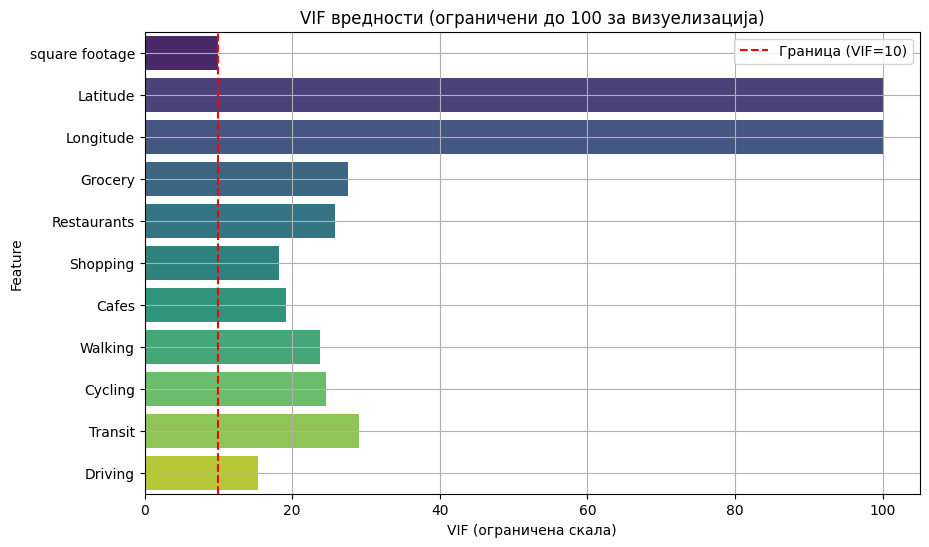

In [ ]:
# Basic VIF bar plot
vif_data_sorted = vif_data[(vif_data['Feature']!= 'beds') & (vif_data['Feature']!= 'baths')]
vif_data_capped = vif_data_sorted.copy()
vif_data_capped['VIF_capped'] = vif_data_capped['VIF'].apply(lambda x: min(x, 100))

plt.figure(figsize=(10, 6))
sns.barplot(data=vif_data_capped, x='VIF_capped', y='Feature',hue='Feature', palette='viridis')
plt.title('VIF вредности (ограничени до 100 за визуелизација)')
plt.xlabel('VIF (ограничена скала)')
plt.axvline(x=10, color='red', linestyle='--', label='Граница (VIF=10)')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
features_to_drop = ['beds', 'baths', 'Latitude', 'Longitude', 'Transit', 'Grocery','price']
X_clean = df_scaled_richmond.drop(columns=features_to_drop,axis=1)
y =  df_scaled_richmond['price']

In [ ]:
X_clean

,square footage,Garage,Parking,Garden,Fireplace,Balcony,Pool,Restaurants,Shopping,Cafes,...,property type_townhouse,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
2,0.115909,1,1,0,0,1,0,6.9,8.1,4.5,...,0,0,0,0,1,0,0,0,0,0
19,0.364583,1,1,1,0,1,0,8.4,5.3,4.6,...,0,0,0,0,0,1,0,0,0,0
54,0.117045,1,1,0,0,1,0,9.5,5.0,4.7,...,0,0,1,0,0,0,0,0,0,0
67,0.295265,1,1,0,0,1,0,6.0,8.6,4.3,...,1,0,0,1,0,0,0,0,0,0
68,0.179545,1,1,0,0,1,0,9.4,6.6,8.4,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,0.174242,1,1,1,0,1,0,5.6,4.8,8.8,...,0,0,0,0,0,1,0,0,0,0
10095,0.804924,1,1,0,1,0,0,6.1,9.4,9.7,...,0,1,0,0,0,0,0,0,0,0
10096,0.725758,1,1,0,1,0,0,8.6,8.5,6.0,...,0,0,0,0,0,0,0,0,0,1
10098,0.179924,1,1,1,1,0,0,5.3,4.5,8.2,...,1,0,1,0,0,0,0,0,0,0


In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X_clean,y,test_size=0.2,random_state=42)
y_train = scaler.fit_transform(y_train.values.reshape(-1,1))

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[ 6.79354511e-01  7.45711572e-03 -4.91483062e-02 -1.10071016e-02
   1.91096363e-03  1.29507423e-02  1.87748552e-02  6.27857906e-04
  -1.48289632e-03 -3.21968340e-03 -2.05780347e-03 -3.38224274e-03
   5.19801949e-04 -1.54124298e-02 -1.76268652e-02 -6.62210071e-02
   1.01878252e-01 -2.61794948e-03 -4.17593381e-02 -1.47742476e-02
  -7.83167943e-03  3.92867513e-03  1.45086535e-02 -1.80584722e-02
  -7.39194129e-03  3.01888882e-02  4.11894617e-02]]
Intercepts: [0.19170576]


In [ ]:
pred = model.predict(X_test)
true_val = scaler.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val)}')
print(f'R2 score:{r2_score(y_test,true_val)}')

MSE:104443624329.81525
R2 score:0.8215738300877705


## Training and Testing

### Vancouver

In [ ]:
X,y = df_scaled_vancouver.drop(columns='price',axis=1),df_scaled_vancouver['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
scaler_1 = MinMaxScaler()
y_train = scaler_1.fit_transform(y_train.values.reshape(-1,1))

### Linear Models

#### Linear Regression

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[-2.10453560e-03 -2.10453560e-03  3.59813113e-01  1.88381502e-01
  -7.91890422e-02  6.21215558e-03  4.86381096e-02 -2.59370714e-03
   1.38128566e-03  3.84483971e-03  2.89684841e-04  1.18320573e-04
  -1.89818726e-04  5.29902029e-05 -1.78557511e-04 -1.52179504e-04
  -9.44973272e-05  5.39587669e-04  4.68060434e-04  5.75852332e-03
   3.04636903e-03 -5.06814432e-03 -3.29608744e-03 -4.40660591e-04
  -9.74982447e-03 -3.64852262e-03  2.56922872e-03 -2.56651504e-03
   5.96059694e-03 -1.18106019e-03 -2.26144514e-03  7.56753923e-03
   3.31000255e-03]]
Intercepts: [-19.09046344]


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.002105
baths,-0.002105
square footage,0.359813
Latitude,0.188382
Longitude,-0.079189
Garage,0.006212
Parking,0.048638
Garden,-0.002594
Fireplace,0.001381
Balcony,0.003845


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val)}')
print(f'R2 score:{r2_score(y_test,true_val)}')

MSE:1481101523234.0679
R2 score:0.6173740041256934


Text(0, 0.5, 'Predicted Y')

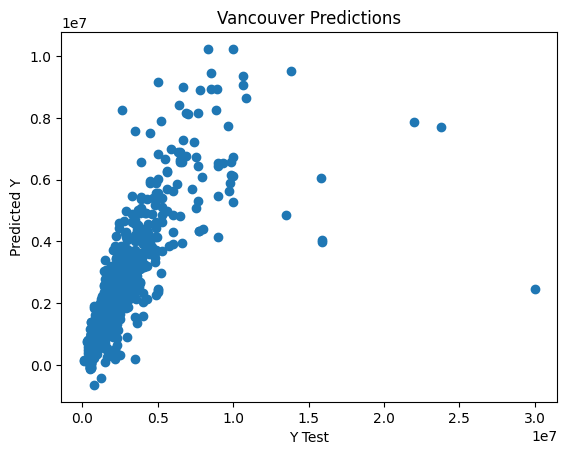

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Vancouver Predictions')
plt.ylabel('Predicted Y')

#### Lasso Regression

In [ ]:
model = LassoCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-4.31893343e-03 -6.21301122e-18  3.54991591e-01  8.87605811e-02
 -6.59286764e-02  5.93586293e-03  4.23509261e-02 -2.37460034e-03
  1.23349767e-03  4.45980625e-03 -0.00000000e+00  8.03678047e-05
 -1.89211374e-04  6.94703468e-05 -1.31482197e-04 -9.83305555e-05
 -8.20875280e-05  4.56930607e-04  4.70743291e-04  3.08924161e-03
  4.43630896e-03 -3.91668944e-03 -1.75952613e-03 -0.00000000e+00
 -8.77836914e-03 -2.81350795e-03  2.70742698e-03 -0.00000000e+00
  5.09057580e-03 -0.00000000e+00 -9.85257277e-04  5.03602036e-03
  2.53346622e-03]
Intercepts: -12.544875080326943
Learning rate 4.451096774604282e-05


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:1664: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-4.318933e-03
baths,-6.213011e-18
square footage,3.549916e-01
Latitude,8.876058e-02
Longitude,-6.592868e-02
Garage,5.935863e-03
Parking,4.235093e-02
Garden,-2.374600e-03
Fireplace,1.233498e-03
Balcony,4.459806e-03


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:1490265323094.0803
R2 score:0.6150066390312509


Text(0, 0.5, 'Predicted Y')

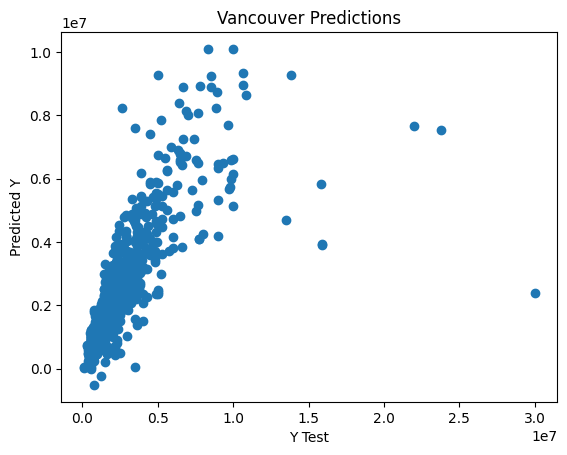

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Vancouver Predictions')
plt.ylabel('Predicted Y')

#### Ridge Regression

In [ ]:
model = RidgeCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-2.09637038e-03 -2.09637038e-03  3.59165503e-01  1.82095362e-01
 -7.93308226e-02  6.20187886e-03  4.83979769e-02 -2.59401872e-03
  1.38848113e-03  3.88718114e-03  2.45619701e-04  1.17642030e-04
 -1.91112236e-04  5.48298446e-05 -1.77244411e-04 -1.50014579e-04
 -9.50001585e-05  5.36455221e-04  4.69155726e-04  5.75335464e-03
  3.06674187e-03 -5.07683882e-03 -3.26590435e-03 -4.77353344e-04
 -9.73351710e-03 -3.64675206e-03  2.56788799e-03 -2.52487481e-03
  5.88273721e-03 -1.16313240e-03 -2.26881353e-03  7.57818068e-03
  3.30828401e-03]
Intercepts: [-18.79796198]
Learning rate 0.1


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.002096
baths,-0.002096
square footage,0.359166
Latitude,0.182095
Longitude,-0.079331
Garage,0.006202
Parking,0.048398
Garden,-0.002594
Fireplace,0.001388
Balcony,0.003887


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:1481382384616.8718
R2 score:0.6173014467320157


Text(0, 0.5, 'Predicted Y')

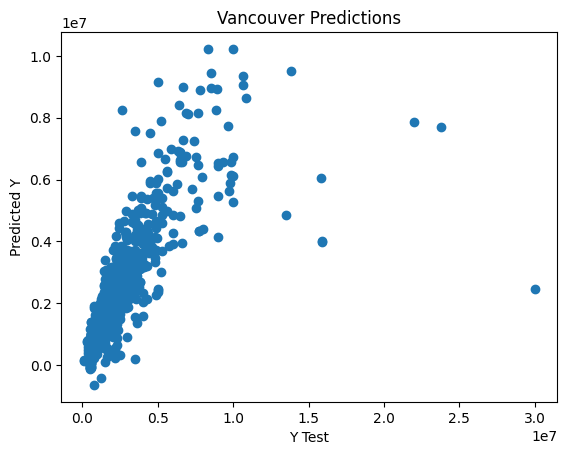

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Vancouver Predictions')
plt.ylabel('Predicted Y')

#### Bayes Ridge Regression

In [ ]:
model = BayesianRidge()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-2.08876654e-03 -2.08876654e-03  3.58592941e-01  1.76896811e-01
 -7.94297363e-02  6.19422374e-03  4.81859813e-02 -2.59343303e-03
  1.39543623e-03  3.92288058e-03  2.09361061e-04  1.17078351e-04
 -1.92189764e-04  5.63313944e-05 -1.76160312e-04 -1.48174128e-04
 -9.54011728e-05  5.33832815e-04  4.70088707e-04  5.74820951e-03
  3.08257080e-03 -5.08523373e-03 -3.23778916e-03 -5.07757417e-04
 -9.72080940e-03 -3.64596207e-03  2.56603967e-03 -2.49013121e-03
  5.81756254e-03 -1.14752732e-03 -2.27396077e-03  7.58647318e-03
  3.30831538e-03]
Intercepts: -18.553794954884687
Learning rate 940.0713186057125


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.002089
baths,-0.002089
square footage,0.358593
Latitude,0.176897
Longitude,-0.079430
Garage,0.006194
Parking,0.048186
Garden,-0.002593
Fireplace,0.001395
Balcony,0.003923


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:1481659094841.7134
R2 score:0.6172299617435205


Text(0, 0.5, 'Predicted Y')

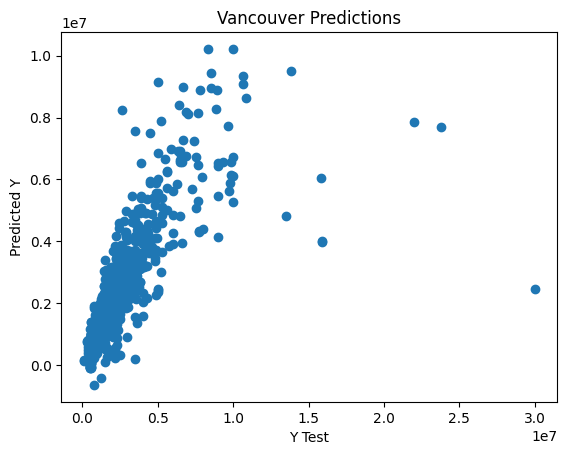

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Vancouver Predictions')
plt.ylabel('Predicted Y')

### Simpson Paradox property type

#### house type

In [ ]:
df_sim_vancouver['property type'].value_counts()

,count
property type,
condo,5171
house,1685
townhouse,746
duplex,713
Unknown,108


In [ ]:
df_vancouver_house = df_sim_vancouver[df_sim_vancouver['property type']=='house']
df_vancouver_house = df_vancouver_house.drop(columns=['property type'],axis=1)
df_vancouver_house

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
18,2199000,3,3,0.436508,49.250304,-123.103150,0,1,0,1,...,5.1,0,0,1,0,0,0,0,0,0
24,1049000,4,4,0.226407,49.279885,-123.068552,0,1,0,0,...,4.3,0,0,0,0,0,0,1,0,0
47,3700000,6,6,0.441126,49.250455,-123.095897,1,1,0,1,...,5.8,0,0,0,1,0,0,0,0,0
48,4380000,5,5,0.497114,49.224401,-123.151887,1,1,0,1,...,6.6,0,0,0,0,0,0,0,0,1
50,1598000,3,3,0.262049,49.285472,-123.053355,1,1,1,1,...,3.7,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16299,7880000,4,4,0.598846,49.252858,-123.130726,1,1,0,1,...,5.6,0,0,1,0,0,0,0,0,0
16301,3000000,5,5,0.307359,49.252931,-123.064532,0,1,0,1,...,9.9,0,1,0,0,0,0,0,0,0
16302,3880000,6,6,0.272727,49.262273,-123.046440,1,1,0,1,...,5.2,0,1,0,0,0,0,0,0,0
16304,3350000,6,6,0.260029,49.257877,-123.088942,0,1,0,0,...,9.6,0,0,0,0,0,0,1,0,0


In [ ]:
X,y = df_vancouver_house.drop(columns='price',axis=1),df_vancouver_house['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
y_train = scaler_1.fit_transform(y_train.values.reshape(-1,1))

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[-5.56232948e-03 -5.56232948e-03  3.08014960e-01  4.06882974e-01
  -2.78333002e-01  2.65680894e-03  3.89492945e-02 -8.78512842e-03
  -4.82505489e-03  8.87328717e-03 -1.30506757e-03  1.49640173e-03
  -3.05360590e-04 -3.16329035e-04 -1.23690911e-03 -1.67918227e-04
   1.06833947e-03  3.50670508e-04  1.93286311e-03 -2.07722450e-02
  -2.78698783e-03 -1.70431838e-02  1.58884587e-02  3.98340192e-02
  -7.50425710e-03 -4.77362282e-03 -8.45200044e-03  5.60981914e-03]]
Intercepts: [-54.34238275]


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.005562
baths,-0.005562
square footage,0.308015
Latitude,0.406883
Longitude,-0.278333
Garage,0.002657
Parking,0.038949
Garden,-0.008785
Fireplace,-0.004825
Balcony,0.008873


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:2488598816039.9497
R2 score:0.562882964797601


Text(0, 0.5, 'Predicted Y')

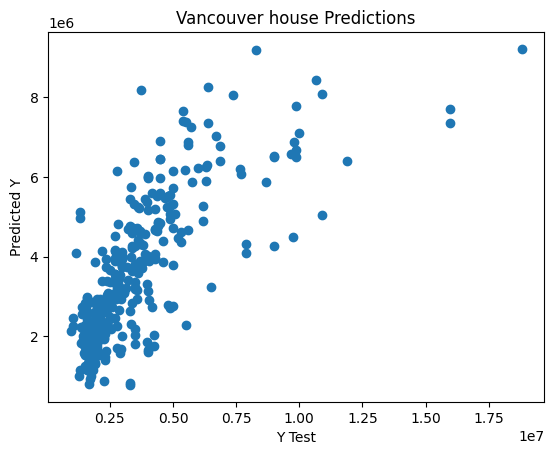

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Vancouver house Predictions')
plt.ylabel('Predicted Y')

#### Condo

In [ ]:
df_vancouver_condo = df_sim_vancouver[df_sim_vancouver['property type']=='condo']
df_vancouver_condo = df_vancouver_condo.drop(columns=['property type'],axis=1)
df_vancouver_condo

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
0,749900,2,2,0.104185,49.275734,-123.101635,1,1,0,1,...,2.6,0,1,0,0,0,0,0,0,0
1,1549900,2,2,0.150072,49.274663,-123.112380,1,1,0,1,...,2.5,1,0,0,0,0,0,0,0,0
4,1098000,2,2,0.117172,49.287694,-123.125721,1,1,1,1,...,8.8,0,1,0,0,0,0,0,0,0
7,449000,0,0,0.047908,49.288179,-123.127755,1,1,0,0,...,5.1,1,0,0,0,0,0,0,0,0
8,565000,1,1,0.086147,49.236122,-123.027776,1,1,1,0,...,7.2,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16231,1880000,2,2,0.130159,49.269547,-123.110062,1,1,1,0,...,6.5,0,0,0,0,1,0,0,0,0
16234,839900,2,2,0.107071,49.253135,-123.083004,1,1,0,0,...,9.2,0,1,0,0,0,0,0,0,0
16235,748900,2,2,0.094084,49.253135,-123.083004,1,1,0,0,...,6.9,0,1,0,0,0,0,0,0,0
16236,798000,1,1,0.080087,49.271418,-123.101673,1,1,1,0,...,9.8,0,0,1,0,0,0,0,0,0


In [ ]:
X,y = df_vancouver_condo.drop(columns='price',axis=1),df_vancouver_condo['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
y_train = scaler_1.fit_transform(y_train.values.reshape(-1,1))

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[-7.62482596e-03 -7.62482596e-03  7.36354975e-01  1.34965503e-01
   1.46325608e-02  3.59691787e-03 -1.02522441e-02 -1.74393531e-03
  -4.75416878e-04  3.07018159e-03 -7.66677082e-05 -3.75452125e-04
  -1.57769295e-05 -3.01398476e-05  2.01939322e-04 -1.24818570e-04
  -1.49379816e-04  6.59645265e-04  7.37252880e-04 -3.50966028e-03
   3.40492091e-04  1.39919190e-02  2.87168429e-04  1.37625173e-02
  -1.01985897e-02 -1.96614389e-02  2.45880020e-02 -1.96004100e-02]]
Intercepts: [-4.86866348]


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.007625
baths,-0.007625
square footage,0.736355
Latitude,0.134966
Longitude,0.014633
Garage,0.003597
Parking,-0.010252
Garden,-0.001744
Fireplace,-0.000475
Balcony,0.003070


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:411062387814.35693
R2 score:0.7457965977075389


Text(0, 0.5, 'Predicted Y')

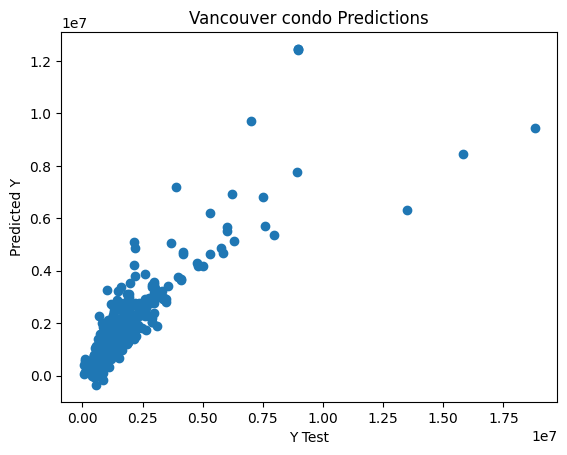

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Vancouver condo Predictions')
plt.ylabel('Predicted Y')

#### Townhouse

In [ ]:
df_vancouver_townhouse = df_sim_vancouver[df_sim_vancouver['property type']=='townhouse']
df_vancouver_townhouse = df_vancouver_townhouse.drop(columns=['property type'],axis=1)
df_vancouver_townhouse

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
5,1348000,2,2,0.145455,49.269413,-123.111259,1,1,0,0,...,6.3,0,1,0,0,0,0,0,0,0
22,1590000,3,3,0.218903,49.220825,-123.141115,1,1,1,0,...,5.8,0,0,1,0,0,0,0,0,0
40,1239000,3,3,0.211688,49.206717,-123.065032,1,1,1,1,...,8.7,1,0,0,0,0,0,0,0,0
65,1498800,3,3,0.210390,49.291035,-123.043433,1,1,1,1,...,8.9,0,0,0,1,0,0,0,0,0
87,1498000,3,3,0.205195,49.254371,-123.066595,1,1,0,0,...,3.8,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16084,1648000,3,3,0.197980,49.279952,-123.107408,1,1,1,0,...,9.2,1,0,0,0,0,0,0,0,0
16097,2398000,3,3,0.219192,49.273314,-123.119764,1,1,0,1,...,5.1,1,0,0,0,0,0,0,0,0
16143,2380000,3,3,0.350072,49.255177,-123.234530,1,1,0,1,...,7.1,0,0,0,0,1,0,0,0,0
16207,1888000,4,4,0.315584,49.271430,-123.249670,1,1,0,1,...,8.5,1,0,0,0,0,0,0,0,0


In [ ]:
X,y = df_vancouver_townhouse.drop(columns='price',axis=1),df_vancouver_townhouse['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                   0.001311
baths                  0.001311
square footage         1.049087
Latitude               0.869714
Longitude             -0.161535
Garage                 0.013990
Parking               -0.002453
Garden                -0.013403
Fireplace             -0.000951
Balcony                0.008096
Pool                   0.003316
Grocery                0.000637
Restaurants            0.001299
Shopping              -0.000002
Cafes                 -0.000153
Walking                0.001056
Cycling               -0.001441
Transit                0.000755
Driving                0.000212
Heating_Baseboard     -0.022326
Heating_Electric      -0.003847
Heating_Forced Air     0.031321
Heating_Geothermal    -0.043841
Heating_Heat Pump      0.024961
Heating_Hot Water     -0.002827
Heating_Natural Gas   -0.021329
Heating_Other          0.020727
Heating_Radiant        0.017162
dtype: float64
R2 scores: [0.60634603 0.67046003 0.57932677 0.674820

#### Duplex

In [ ]:
df_vancouver_duplex = df_sim_vancouver[df_sim_vancouver['property type']=='duplex']
df_vancouver_duplex = df_vancouver_duplex.drop(columns=['property type'],axis=1)
df_vancouver_duplex

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
21,1699999,3,3,0.206494,49.226035,-123.097875,1,1,0,1,...,6.7,0,0,0,0,0,0,0,0,1
30,1738000,3,3,0.219048,49.236396,-123.086829,1,1,0,1,...,3.7,0,0,0,0,1,0,0,0,0
31,1788000,3,3,0.219048,49.236396,-123.086829,1,1,0,1,...,8.4,0,0,0,0,1,0,0,0,0
53,2268000,4,4,0.227994,49.245025,-123.100252,1,0,0,1,...,7.7,0,0,0,0,1,0,0,0,0
55,2168000,4,4,0.227994,49.245025,-123.100252,1,0,0,1,...,7.7,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15967,1849000,3,3,0.201587,49.256775,-123.083275,1,1,0,0,...,5.5,0,0,0,0,1,0,0,0,0
15980,2388000,3,3,0.187590,49.258710,-123.188480,1,1,0,0,...,7.3,0,0,0,0,0,0,0,0,1
16219,2500000,4,4,0.210823,49.262597,-123.065011,1,1,0,1,...,9.5,0,0,0,0,0,0,1,0,0
16220,2500000,5,5,0.204762,49.262521,-123.065266,1,1,0,1,...,4.7,0,0,0,0,0,0,1,0,0


In [ ]:
X,y = df_vancouver_duplex.drop(columns='price',axis=1),df_vancouver_duplex['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                  -0.001012
baths                 -0.001012
square footage         0.466630
Latitude               0.130863
Longitude             -0.555612
Garage                 0.015107
Parking                0.036085
Garden                -0.005749
Fireplace             -0.005954
Balcony               -0.000083
Pool                   0.001289
Grocery                0.001431
Restaurants           -0.000547
Shopping              -0.001201
Cafes                  0.000310
Walking               -0.000452
Cycling               -0.000126
Transit               -0.001097
Driving                0.000296
Heating_Baseboard     -0.008800
Heating_Electric       0.007012
Heating_Forced Air     0.014024
Heating_Geothermal     0.004397
Heating_Heat Pump      0.006052
Heating_Hot Water     -0.001516
Heating_Natural Gas    0.004868
Heating_Other         -0.025164
Heating_Radiant       -0.000873
dtype: float64
R2 scores: [0.78142447 0.21381443 0.45109082 0.524188

### Ensemble models

In [ ]:
X,y = df_vancouver.drop(columns='price',axis=1),df_vancouver['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

#### Decision Tree

In [ ]:
params = {
    'max_depth':[4,5,6,7]
}
grid  = GridSearchCV(DecisionTreeRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 7}


In [ ]:
model = DecisionTreeRegressor(**grid.best_params_)
model.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=7)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:628192047678.1515
R2 score:0.7756085274082843


Text(0, 0.5, 'Predicted Y')

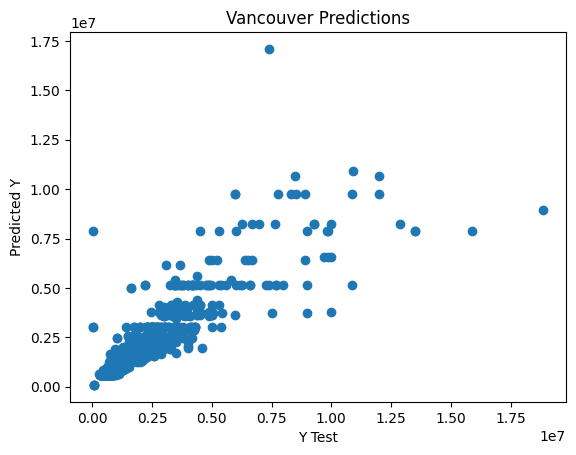

In [ ]:
plt.scatter(y_test,pred)
plt.title('Vancouver Predictions')
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.736479
Latitude                   0.145822
Longitude                  0.067192
beds                       0.010738
property type_house        0.010277
Heating_Other              0.007597
property type_Unknown      0.003541
Cycling                    0.003157
Walking                    0.003121
Heating_Forced Air         0.002893
Heating_Baseboard          0.002508
Garage                     0.001420
property type_townhouse    0.001152
baths                      0.001099
Heating_Geothermal         0.001086
Restaurants                0.000667
Heating_Natural Gas        0.000617
Balcony                    0.000450
Heating_Heat Pump          0.000066
Garden                     0.000063
Grocery                    0.000036
Heating_Electric           0.000019
Parking                    0.000000
Pool                       0.000000
Fireplace                  0.000000
Shopping                   0.000000
Cafes                      0.000000
Driving                    0

#### Random Forest

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(RandomForestRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 7, 'n_estimators': 150}


In [ ]:
model = RandomForestRegressor(**grid.best_params_)
model.fit(X_train,y_train)

RandomForestRegressor(max_depth=7, n_estimators=150)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:462740504175.9519
R2 score:0.8347081540690344


Text(0.5, 1.0, 'Vancouver Predictions')

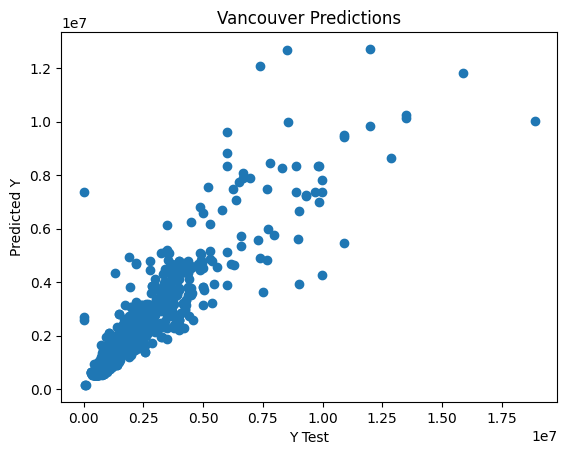

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Vancouver Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.707666
Latitude                   0.094590
Longitude                  0.085707
Cafes                      0.013009
property type_house        0.011964
Heating_Heat Pump          0.008608
Driving                    0.008360
Grocery                    0.007872
Cycling                    0.007477
Transit                    0.006810
Shopping                   0.005788
Heating_Other              0.005319
baths                      0.004590
Garage                     0.003927
Restaurants                0.003807
beds                       0.003643
Heating_Baseboard          0.003160
Walking                    0.002979
property type_condo        0.002669
Fireplace                  0.002494
property type_Unknown      0.001985
Heating_Radiant            0.001705
Balcony                    0.001362
Garden                     0.000807
Heating_Forced Air         0.000797
Heating_Natural Gas        0.000616
Heating_Electric           0.000570
Heating_Hot Water          0

#### XGBOOST Regression

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(XGBRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 4, 'n_estimators': 200}


In [ ]:
model = XGBRegressor(**grid.best_params_)
model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:399884091392.0
R2 score:0.8571605682373047


Text(0, 0.5, 'Predicted Y')

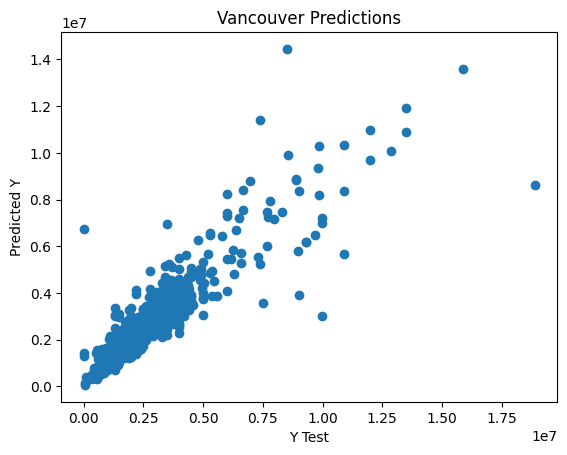

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.title('Vancouver Predictions')
plt.ylabel('Predicted Y')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.213295
property type_condo        0.138924
Longitude                  0.072274
Garage                     0.065907
property type_house        0.065448
Latitude                   0.062886
Heating_Radiant            0.047579
property type_Unknown      0.043230
Heating_Baseboard          0.040416
beds                       0.029246
Heating_Hot Water          0.029182
property type_townhouse    0.022349
Parking                    0.017129
Heating_Forced Air         0.015159
Fireplace                  0.014927
Balcony                    0.013587
Heating_Other              0.012674
Driving                    0.012330
Heating_Heat Pump          0.010944
Transit                    0.010670
Garden                     0.008700
Cycling                    0.008466
Cafes                      0.007958
Grocery                    0.007823
Heating_Natural Gas        0.007089
Shopping                   0.005136
Restaurants                0.004219
Heating_Electric           0

### Burnaby

In [ ]:
X,y = df_scaled_burnaby.drop(columns='price',axis=1),df_scaled_burnaby['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
y_train = scaler_1.fit_transform(y_train.values.reshape(-1,1))

### Linear Models

#### Linear Regression

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[ 5.05034480e-03  5.05034480e-03  4.32043441e-01  4.21091251e-02
  -1.92383423e-01  5.95014786e-03  8.01664698e-02 -3.18271887e-03
  -6.92295040e-03 -4.25423957e-03  8.41609727e-04 -4.25839053e-05
   1.37714321e-04  2.97646245e-04 -1.57060930e-04 -4.22744176e-04
   7.94513255e-04 -5.70056728e-04  2.64917516e-05 -2.60137946e-02
  -1.99633831e-02 -1.11666115e-03  7.69709713e-02 -2.98771325e-02
  -1.08899792e-02 -4.26765703e-03  8.26240093e-03  1.00757474e-02
   7.81304854e-03 -2.74477330e-02 -9.12374146e-03  4.12535630e-03
   2.14525576e-02]]
Intercepts: [-25.74502425]


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,0.005050
baths,0.005050
square footage,0.432043
Latitude,0.042109
Longitude,-0.192383
Garage,0.005950
Parking,0.080166
Garden,-0.003183
Fireplace,-0.006923
Balcony,-0.004254


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val)}')
print(f'R2 score:{r2_score(y_test,true_val)}')

MSE:48783231633.7888
R2 score:0.7222309166997156


Text(0, 0.5, 'Predicted Y')

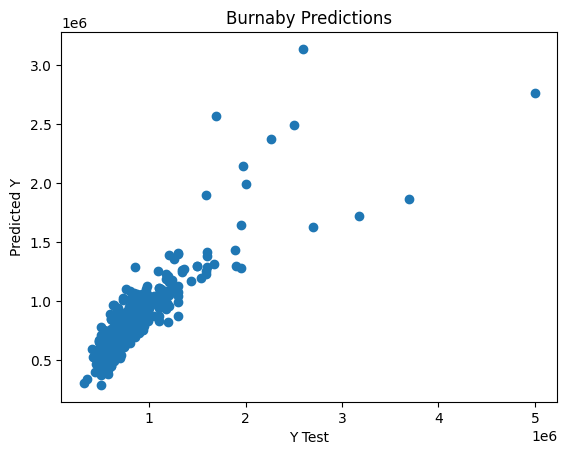

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Burnaby Predictions')
plt.ylabel('Predicted Y')

#### Lasso Regression

In [ ]:
model = LassoCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [ 1.07951762e-02  0.00000000e+00  4.19384803e-01  8.79632769e-03
 -1.81443293e-01  5.16134386e-03  7.01619231e-02 -2.83995674e-03
 -6.66818764e-03 -4.04966054e-03  7.11826759e-04 -4.56798367e-05
  1.25908506e-04  2.92627966e-04 -1.51587604e-04 -4.14089481e-04
  7.95247377e-04 -5.64510470e-04  3.13619176e-05 -4.46720899e-03
 -0.00000000e+00  1.69330843e-02  9.75498940e-02 -9.86600856e-03
 -1.47582340e-02 -8.02449791e-03  4.83385327e-03  5.73227745e-03
  4.25109430e-03 -2.96900696e-02 -9.48727178e-03 -0.00000000e+00
  1.66894474e-02]
Intercepts: -22.765057662030312
Learning rate 2.072697769786079e-05


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:1664: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,0.010795
baths,0.000000
square footage,0.419385
Latitude,0.008796
Longitude,-0.181443
Garage,0.005161
Parking,0.070162
Garden,-0.002840
Fireplace,-0.006668
Balcony,-0.004050


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:49379805803.01408
R2 score:0.7188340556358506


Text(0, 0.5, 'Predicted Y')

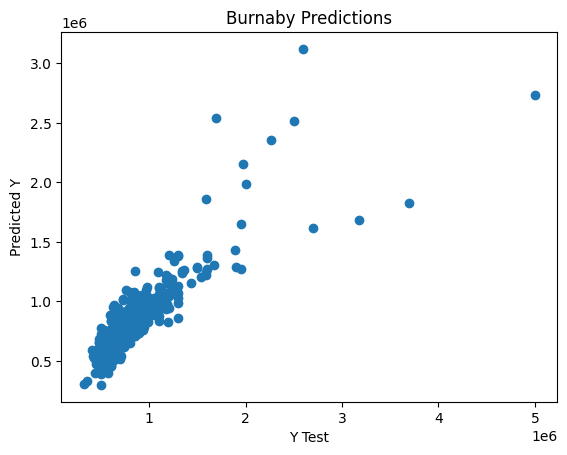

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Burnaby Predictions')
plt.ylabel('Predicted Y')

#### Ridge Regression

In [ ]:
model = RidgeCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [ 5.53858906e-03  5.53858906e-03  4.15697336e-01  4.14023539e-02
 -1.80668265e-01  6.05151124e-03  7.81846576e-02 -2.95258984e-03
 -6.68816160e-03 -4.18426507e-03  1.01560136e-03 -3.73987760e-05
  1.45731384e-04  2.97988028e-04 -1.57830590e-04 -4.28387424e-04
  7.98112095e-04 -5.85082922e-04  2.09824995e-05 -2.67254132e-02
 -2.09521514e-02 -4.01935198e-04  7.84141847e-02 -3.03346849e-02
 -1.11020713e-02 -4.41146483e-03  8.30783080e-03  1.01156253e-02
  7.70417132e-03 -2.75728000e-02 -8.33051324e-03  3.92037361e-03
  2.13688483e-02]
Intercepts: [-24.26694054]
Learning rate 0.1


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,0.005539
baths,0.005539
square footage,0.415697
Latitude,0.041402
Longitude,-0.180668
Garage,0.006052
Parking,0.078185
Garden,-0.002953
Fireplace,-0.006688
Balcony,-0.004184


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:49189065794.58573
R2 score:0.7199201189308687


Text(0, 0.5, 'Predicted Y')

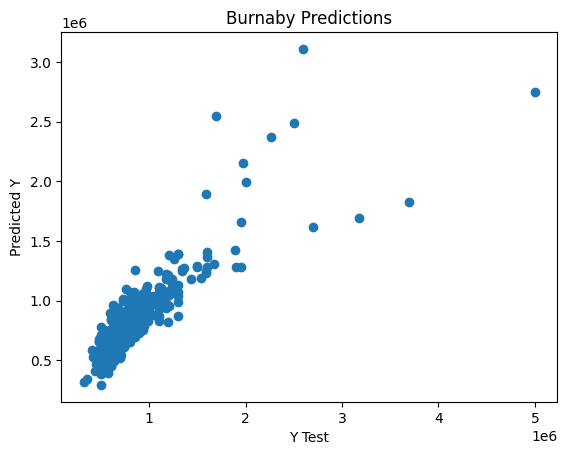

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Burnaby Predictions')
plt.ylabel('Predicted Y')

#### Bayes Ridge Regression

In [ ]:
model = BayesianRidge()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [ 5.68772210e-03  5.68772210e-03  4.10708257e-01  4.11033620e-02
 -1.77207778e-01  6.08041519e-03  7.75653319e-02 -2.88271284e-03
 -6.61678751e-03 -4.16154359e-03  1.06746600e-03 -3.58775432e-05
  1.48197929e-04  2.98040819e-04 -1.58079702e-04 -4.30073902e-04
  7.99266260e-04 -5.89634250e-04  1.93103756e-05 -2.69363847e-02
 -2.12537302e-02 -1.87124176e-04  7.88505004e-02 -3.04732612e-02
 -1.11663050e-02 -4.45530267e-03  8.32122438e-03  1.01261488e-02
  7.66951528e-03 -2.76064464e-02 -8.08756343e-03  3.85658970e-03
  2.13421394e-02]
Intercepts: -23.825853187956913
Learning rate 1028.4132129310544


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,0.005688
baths,0.005688
square footage,0.410708
Latitude,0.041103
Longitude,-0.177208
Garage,0.006080
Parking,0.077565
Garden,-0.002883
Fireplace,-0.006617
Balcony,-0.004162


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:49326007286.36904
R2 score:0.7191403814808373


Text(0, 0.5, 'Predicted Y')

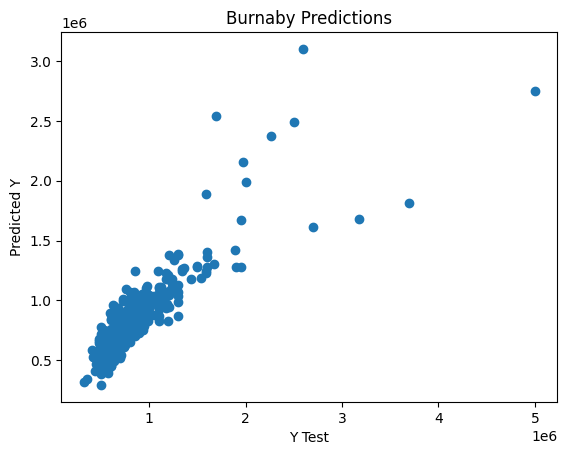

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Burnaby Predictions')
plt.ylabel('Predicted Y')

### Simpson Paradox

#### Condo

In [ ]:
df_sim_burnaby['property type'].value_counts()

,count
property type,
condo,1791
townhouse,229
house,59
Unknown,23
duplex,17


In [ ]:
df_burnaby_condo = df_sim_burnaby[df_sim_burnaby['property type']=='condo']
df_burnaby_condo = df_burnaby_condo.drop(columns=['property type'],axis=1)
df_burnaby_condo

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
11,725000,2,2,0.164769,49.224460,-122.989907,1,1,0,0,...,7.8,1,0,0,0,0,0,0,0,0
15,829000,3,3,0.113841,49.210263,-122.953027,1,1,0,0,...,9.9,1,0,0,0,0,0,0,0,0
16,938800,2,2,0.127621,49.265877,-123.008050,1,1,0,1,...,6.7,1,0,0,0,0,0,0,0,0
17,968000,2,2,0.114440,49.225111,-123.004010,1,1,1,0,...,7.0,0,1,0,0,0,0,0,0,0
26,614900,1,1,0.034552,49.262820,-123.004147,1,1,1,0,...,7.7,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,818000,2,2,0.078690,49.263236,-122.998963,1,1,0,0,...,8.1,0,0,0,0,1,0,0,0,0
16222,1568000,3,3,0.161574,49.263247,-123.003660,1,1,1,0,...,9.1,0,0,0,0,1,0,0,0,0
16243,968888,1,1,0.025564,49.266649,-123.000654,1,1,0,0,...,5.8,0,1,0,0,0,0,0,0,0
16244,968888,1,1,0.025564,49.266649,-123.000654,1,1,0,0,...,8.3,0,1,0,0,0,0,0,0,0


In [ ]:
X,y = df_burnaby_condo.drop(columns='price',axis=1),df_burnaby_condo['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)
y_train = scaler_1.fit_transform(y_train.values.reshape(-1,1))

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[-2.75656387e-03 -2.75656387e-03  1.47551708e+00  3.08921919e-02
  -4.22514940e-01  9.20136973e-03  3.62565130e-02 -2.96799525e-03
  -6.05354117e-03  4.05038774e-03  1.04107027e-02 -4.44203227e-04
  -6.03689935e-04 -7.60156237e-04  5.00557567e-04  2.77821486e-04
  -2.26726760e-04 -1.06959908e-03 -5.36786380e-04 -3.66092411e-02
  -1.96144341e-02  1.85053337e-02  2.14596444e-02  1.95468610e-02
  -6.32418143e-02 -5.90075137e-02  3.23339986e-02  8.66271655e-02]]
Intercepts: [-53.44481936]


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.002757
baths,-0.002757
square footage,1.475517
Latitude,0.030892
Longitude,-0.422515
Garage,0.009201
Parking,0.036257
Garden,-0.002968
Fireplace,-0.006054
Balcony,0.004050


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:18666420192.236168
R2 score:0.6793244678583545


Text(0, 0.5, 'Predicted Y')

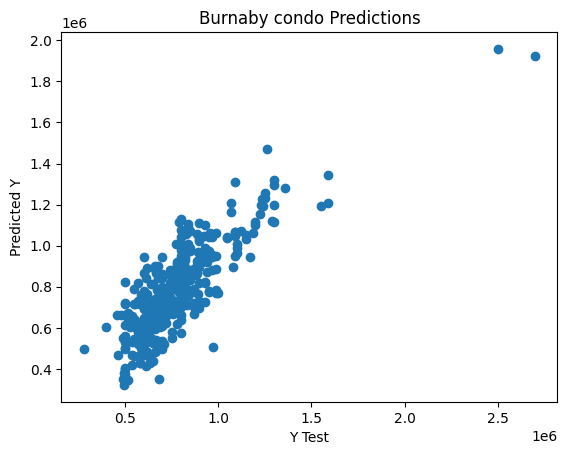

In [ ]:
plt.scatter(y_test,true_val)
plt.xlabel('Y Test')
plt.title('Burnaby condo Predictions')
plt.ylabel('Predicted Y')

#### house

In [ ]:
df_burnaby_house = df_sim_burnaby[df_sim_burnaby['property type']=='house']
df_burnaby_house = df_burnaby_house.drop(columns=['property type'],axis=1)
df_burnaby_house

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
274,1599999,3,3,0.274016,49.231915,-122.927084,1,1,0,1,...,8.8,0,0,1,0,0,0,0,0,0
355,1980000,3,3,0.259437,49.234370,-122.999540,1,1,0,0,...,6.8,0,0,1,0,0,0,0,0,0
695,1850000,3,3,0.314959,49.227173,-122.946859,0,1,0,1,...,4.0,0,0,1,0,0,0,0,0,0
708,1775000,3,3,0.290194,49.217710,-122.937266,1,1,0,1,...,7.3,0,0,1,0,0,0,0,0,0
883,1999900,2,2,0.194328,49.231553,-123.001272,0,1,0,0,...,8.1,0,0,0,0,0,0,0,1,0
1038,1899000,3,3,0.289395,49.206075,-122.975714,0,1,0,0,...,5.1,1,0,0,0,0,0,0,0,0
1114,1860000,3,3,0.278610,49.245472,-123.018325,1,1,0,1,...,8.3,0,0,1,0,0,0,0,0,0
1313,1579000,3,3,0.318155,49.211919,-122.933373,0,1,0,0,...,4.7,0,0,1,0,0,0,0,0,0
1469,1970000,3,3,0.278011,49.205260,-122.946812,1,1,0,1,...,8.6,1,0,0,0,0,0,0,0,0
1578,1995000,3,3,0.286199,49.215305,-122.977248,0,1,0,1,...,5.2,0,0,0,0,0,0,0,1,0


In [ ]:
X,y = df_burnaby_house.drop(columns='price',axis=1),df_burnaby_house['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                   2.784772e-02
baths                  2.784772e-02
square footage         7.328360e-01
Latitude               1.699982e+00
Longitude              6.176842e-01
Garage                -1.478249e-02
Parking                3.441691e-16
Garden                -5.779404e-02
Fireplace             -5.874118e-02
Balcony               -1.693040e-01
Pool                  -1.591969e-01
Grocery               -7.620234e-03
Restaurants            1.705401e-02
Shopping               2.446902e-02
Cafes                  2.804256e-03
Walking               -4.680171e-03
Cycling                2.836887e-02
Transit               -6.448135e-03
Driving               -2.786934e-03
Heating_Baseboard     -6.277828e-02
Heating_Electric      -1.174596e-02
Heating_Forced Air     1.794327e-02
Heating_Geothermal     0.000000e+00
Heating_Heat Pump      0.000000e+00
Heating_Hot Water      0.000000e+00
Heating_Natural Gas    2.387150e-02
Heating_Other          3.270

#### Townhouse

In [ ]:
df_burnaby_townhouse = df_sim_burnaby[df_sim_burnaby['property type']=='townhouse']
df_burnaby_townhouse = df_burnaby_townhouse.drop(columns=['property type'],axis=1)
df_burnaby_townhouse

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
66,998000,3,3,0.142201,49.217184,-122.950352,1,1,1,0,...,9.8,1,0,0,0,0,0,0,0,0
105,989900,2,2,0.187537,49.235200,-123.013044,1,1,0,1,...,6.7,1,0,0,0,0,0,0,0,0
107,989900,2,2,0.187537,49.235200,-123.013044,1,1,0,1,...,8.0,1,0,0,0,0,0,0,0,0
111,1135000,3,3,0.144997,49.214864,-122.953021,1,1,0,0,...,8.3,0,1,0,0,0,0,0,0,0
122,555000,1,1,0.042740,49.214864,-122.953021,1,1,0,0,...,6.9,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13430,1329000,3,3,0.177152,49.263293,-122.998022,1,1,0,0,...,7.7,0,1,0,0,0,0,0,0,0
13702,1299000,2,2,0.251847,49.262676,-123.001085,1,1,1,0,...,9.1,0,0,1,0,0,0,0,0,0
13894,898000,2,2,0.174955,49.253159,-123.016175,1,1,1,1,...,9.4,0,1,0,0,0,0,0,0,0
15068,1336000,3,3,0.188935,49.252254,-122.994497,1,1,1,0,...,7.6,0,0,0,0,1,0,0,0,0


In [ ]:
X,y = df_burnaby_townhouse.drop(columns='price',axis=1),df_burnaby_townhouse['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                   6.140525e-02
baths                  6.140525e-02
square footage         1.644954e+00
Latitude               1.738411e-01
Longitude             -1.642745e+00
Garage                 1.958490e-01
Parking                1.329453e-01
Garden                -3.299890e-02
Fireplace             -4.793919e-02
Balcony               -4.744185e-02
Pool                   3.491299e-03
Grocery                2.679178e-03
Restaurants            1.653090e-03
Shopping              -1.865299e-03
Cafes                  3.141574e-03
Walking               -2.140585e-03
Cycling                9.071322e-03
Transit               -2.654449e-03
Driving                5.124926e-03
Heating_Baseboard     -2.933812e-02
Heating_Electric       1.103853e-02
Heating_Forced Air    -4.870187e-02
Heating_Geothermal     1.110223e-16
Heating_Heat Pump      1.344289e-01
Heating_Hot Water     -1.361683e-01
Heating_Natural Gas   -2.668960e-02
Heating_Other         -9.235

#### Duplex

In [ ]:
df_burnaby_duplex = df_sim_burnaby[df_sim_burnaby['property type']=='duplex']
df_burnaby_duplex = df_burnaby_duplex.drop(columns=['property type'],axis=1)
df_burnaby_duplex

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
1007,1144800,3,3,0.188536,49.193664,-122.925686,1,1,0,1,...,8.6,1,0,0,0,0,0,0,0,0
1352,1428000,3,3,0.166167,49.282166,-123.008447,1,1,0,1,...,5.2,0,0,0,0,0,1,0,0,0
2330,1965000,3,3,0.322548,49.276244,-122.984004,1,1,0,1,...,9.4,0,0,0,0,0,1,0,0,0
2364,1595000,3,3,0.269223,49.223676,-122.948877,1,1,0,1,...,4.3,0,0,0,0,0,1,0,0,0
2557,1588000,3,3,0.348712,49.254149,-122.981507,1,1,0,1,...,6.5,0,1,0,0,0,0,0,0,0
4043,1428000,3,3,0.166167,49.282166,-123.008447,1,1,1,0,...,7.6,0,0,0,0,0,1,0,0,0
5002,1965000,3,3,0.322548,49.276244,-122.984004,1,1,1,0,...,9.6,0,0,0,0,0,1,0,0,0
7843,1898000,3,3,0.292990,49.282165,-123.008012,1,1,1,0,...,8.2,0,0,0,0,1,0,0,0,0
7845,1898000,3,3,0.292990,49.282180,-123.008093,1,1,1,0,...,5.3,0,0,0,0,1,0,0,0,0
8214,999000,3,3,0.133413,49.250230,-122.977570,1,1,1,0,...,4.0,0,0,0,0,0,1,0,0,0


In [ ]:
X,y = df_burnaby_duplex.drop(columns='price',axis=1),df_burnaby_duplex['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                  -0.000059
baths                 -0.000015
square footage         0.229055
Latitude               0.049798
Longitude             -0.017083
Garage                 0.160561
Parking                0.160580
Garden                -0.028917
Fireplace              0.028917
Balcony                0.043119
Pool                   0.000009
Grocery               -0.005434
Restaurants            0.021611
Shopping              -0.004199
Cafes                 -0.034162
Walking               -0.025615
Cycling               -0.092403
Transit                0.038461
Driving               -0.023044
Heating_Baseboard     -0.335011
Heating_Electric       0.104787
Heating_Forced Air     0.000000
Heating_Geothermal     0.000000
Heating_Heat Pump      0.271617
Heating_Hot Water      0.119101
Heating_Natural Gas    0.000000
Heating_Other         -0.160483
Heating_Radiant        0.000000
dtype: float64
R2 scores: [-39.67039559   0.14902967   0.62624991  -

### Ensemble Models

In [ ]:
X,y = df_burnaby.drop(columns='price',axis=1),df_burnaby['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

#### Desicion Tree

In [ ]:
params = {
    'max_depth':[4,5,6,7]
}
grid  = GridSearchCV(DecisionTreeRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 4}


In [ ]:
model = DecisionTreeRegressor(**grid.best_params_)
model.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=4)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:46991533788.11567
R2 score:0.6629617404795699


Text(0, 0.5, 'Predicted Y')

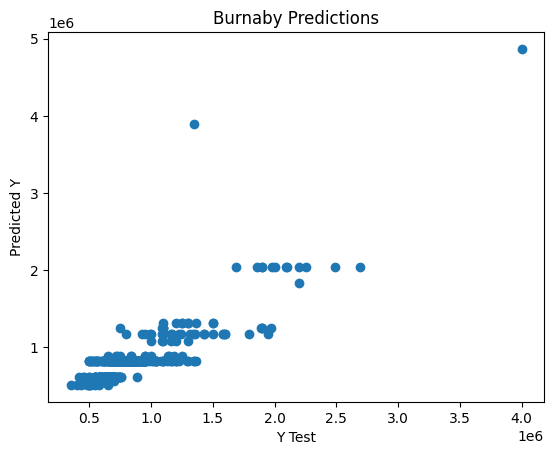

In [ ]:
plt.scatter(y_test,pred)
plt.title('Burnaby Predictions')
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.662575
baths                      0.088106
Latitude                   0.069782
property type_townhouse    0.052775
Longitude                  0.051428
beds                       0.033125
Heating_Baseboard          0.031169
property type_house        0.011042
Garage                     0.000000
Balcony                    0.000000
Pool                       0.000000
Grocery                    0.000000
Restaurants                0.000000
Shopping                   0.000000
Parking                    0.000000
Garden                     0.000000
Fireplace                  0.000000
Cycling                    0.000000
Walking                    0.000000
Cafes                      0.000000
Transit                    0.000000
property type_condo        0.000000
property type_Unknown      0.000000
Driving                    0.000000
property type_duplex       0.000000
Heating_Electric           0.000000
Heating_Forced Air         0.000000
Heating_Geothermal         0

#### Random Forest

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(RandomForestRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 7, 'n_estimators': 100}


In [ ]:
model = RandomForestRegressor(**grid.best_params_)
model.fit(X_train,y_train)

RandomForestRegressor(max_depth=7)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:20908425119.646282
R2 score:0.8500381101963304


Text(0.5, 1.0, 'Burnaby Predictions')

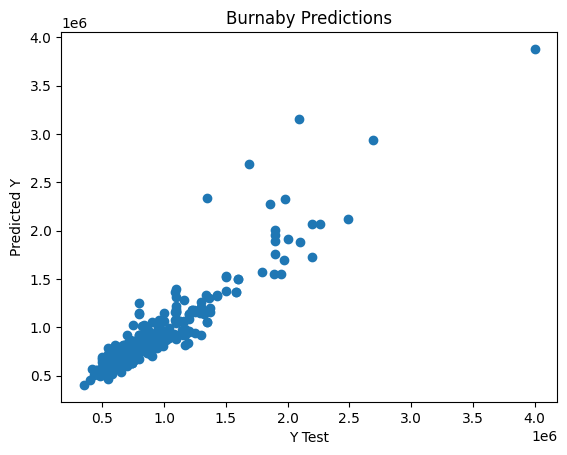

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Burnaby Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.560750
property type_house        0.101974
baths                      0.046782
Longitude                  0.039967
Cycling                    0.036394
property type_townhouse    0.031533
Latitude                   0.031141
beds                       0.029046
Heating_Baseboard          0.025318
Walking                    0.020228
Shopping                   0.011166
Transit                    0.008801
property type_condo        0.007026
Cafes                      0.006673
Parking                    0.006605
Restaurants                0.006521
Driving                    0.005639
Grocery                    0.004682
Heating_Heat Pump          0.004516
Heating_Hot Water          0.002305
Fireplace                  0.002053
Garage                     0.001975
Heating_Electric           0.001702
Heating_Forced Air         0.001584
Heating_Radiant            0.001337
Garden                     0.001022
Heating_Natural Gas        0.000980
Heating_Other              0

#### XGBOOST Regression

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(XGBRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 7, 'n_estimators': 100}


In [ ]:
model = XGBRegressor(**grid.best_params_)
model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:29618255872.0
R2 score:0.7875684499740601


Text(0.5, 1.0, 'Burnaby Predictions')

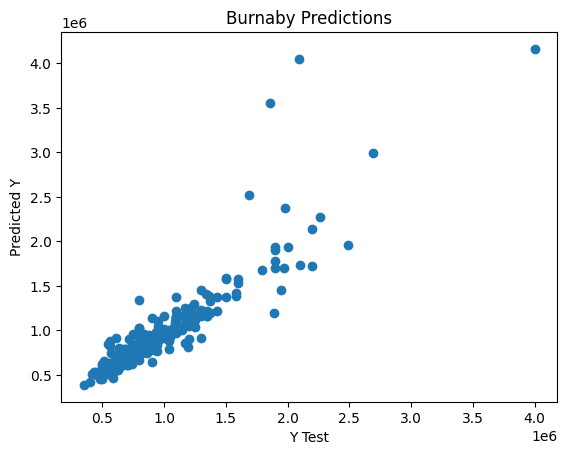

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Burnaby Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

property type_house        0.529862
property type_townhouse    0.138817
Parking                    0.097410
square footage             0.046993
Heating_Baseboard          0.036751
Heating_Hot Water          0.033530
property type_condo        0.028096
beds                       0.018457
Heating_Heat Pump          0.012756
Heating_Other              0.008020
Heating_Electric           0.006369
Cycling                    0.006063
Latitude                   0.005913
Longitude                  0.005716
Walking                    0.004193
Garage                     0.003417
Heating_Forced Air         0.002941
property type_Unknown      0.002470
Heating_Natural Gas        0.002015
Shopping                   0.001431
Heating_Geothermal         0.001419
Restaurants                0.001184
Pool                       0.001111
Balcony                    0.000863
Heating_Radiant            0.000795
Driving                    0.000793
Garden                     0.000776
Fireplace                  0

### Richmond

In [ ]:
X,y = df_scaled_richmond.drop(columns='price',axis=1),df_scaled_richmond['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
y_train = scaler_1.fit_transform(y_train.values.reshape(-1,1))

### Linear Models

#### Linear Regression

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[ 1.34025733e-02  1.34025733e-02  5.99706256e-01 -1.88217643e-01
  -3.99639511e-01  4.03389263e-03 -2.25080225e-02 -1.40598990e-02
   7.15763271e-04  7.88614710e-03  3.90145434e-03  1.44330268e-03
  -8.29447695e-05 -1.64899986e-03 -2.11764265e-03 -8.28016564e-04
  -2.25864176e-03  3.53343665e-04  5.17161233e-04 -1.07048337e-02
   9.05405893e-03 -7.65125477e-02  8.02146510e-02 -2.05132854e-03
  -3.83812831e-02 -2.05990143e-02 -1.75187107e-03  8.01052405e-03
   2.18999580e-02 -2.23675194e-02 -3.18444245e-03  2.11807327e-02
   3.51929156e-02]]
Intercepts: [-39.87616586]


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,0.013403
baths,0.013403
square footage,0.599706
Latitude,-0.188218
Longitude,-0.399640
Garage,0.004034
Parking,-0.022508
Garden,-0.014060
Fireplace,0.000716
Balcony,0.007886


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val)}')
print(f'R2 score:{r2_score(y_test,true_val)}')

MSE:101645511063.33101
R2 score:0.8350380513636295


Text(0.5, 1.0, 'Richmond Predictions')

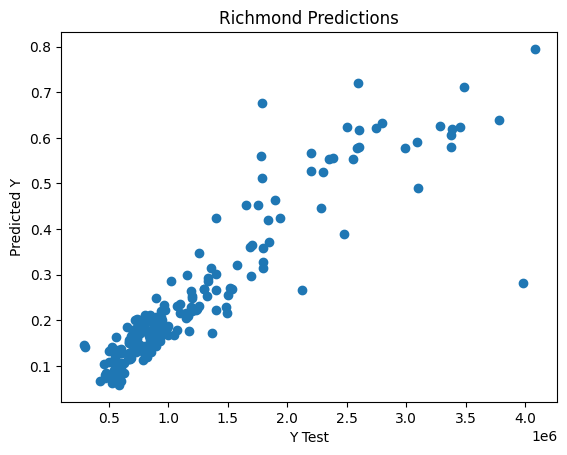

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Richmond Predictions')

#### Lasso Regression

In [ ]:
model = LassoCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [ 2.83714850e-02  5.79454040e-17  5.75368145e-01 -0.00000000e+00
 -2.32486193e-01  4.34932057e-03 -0.00000000e+00 -1.15009420e-02
  5.34413958e-04  4.75657724e-03  2.74390540e-03  1.51134051e-03
  1.01927539e-04 -1.30906595e-03 -1.89217640e-03 -8.58525730e-04
 -2.42280579e-03  1.46546538e-04  5.08126446e-04 -0.00000000e+00
  1.26319762e-02 -4.90879107e-02  9.09605578e-02 -0.00000000e+00
 -3.80419110e-02 -2.05320747e-02 -3.60617887e-03  6.42160206e-04
  1.85035736e-02 -2.02075592e-02 -0.00000000e+00  6.26718031e-03
  3.69628962e-02]
Intercepts: -28.57538520444793
Learning rate 0.00016718116060313496


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:1664: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,2.837148e-02
baths,5.794540e-17
square footage,5.753681e-01
Latitude,-0.000000e+00
Longitude,-2.324862e-01
Garage,4.349321e-03
Parking,-0.000000e+00
Garden,-1.150094e-02
Fireplace,5.344140e-04
Balcony,4.756577e-03


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:101775090736.85234
R2 score:0.8348277546646005


Text(0.5, 1.0, 'Richmond Predictions')

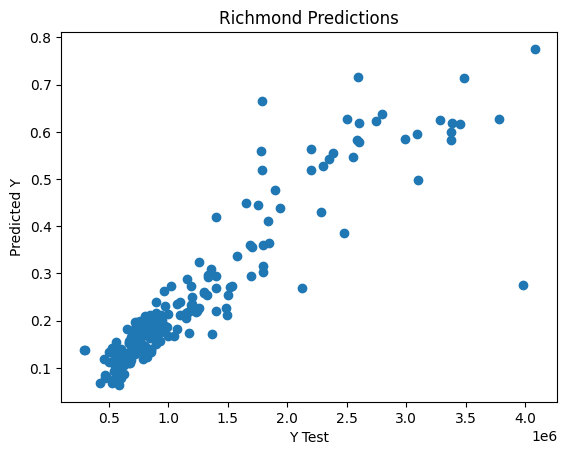

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Richmond Predictions')

#### Ridge Regression

In [ ]:
model = RidgeCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [ 1.38344307e-02  1.38344307e-02  5.87400108e-01 -1.31403927e-01
 -3.54568104e-01  4.48211072e-03 -2.24800376e-02 -1.32843703e-02
  1.17936356e-03  7.53963089e-03  3.93800301e-03  1.49125837e-03
 -1.12874434e-05 -1.60418139e-03 -2.08096490e-03 -8.34049351e-04
 -2.27912239e-03  2.86166821e-04  5.59681150e-04 -1.13312222e-02
  7.07771269e-03 -7.32722997e-02  8.17475849e-02 -4.22177564e-03
 -3.84271604e-02 -2.07979429e-02 -2.55311606e-03  7.03940865e-03
  2.12712317e-02 -2.27126150e-02 -2.58809708e-03  2.23739733e-02
  3.63943176e-02]
Intercepts: [-37.11944852]
Learning rate 0.1


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,0.013834
baths,0.013834
square footage,0.587400
Latitude,-0.131404
Longitude,-0.354568
Garage,0.004482
Parking,-0.022480
Garden,-0.013284
Fireplace,0.001179
Balcony,0.007540


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:101480808334.75475
R2 score:0.8353053497693087


Text(0.5, 1.0, 'Richmond Predictions')

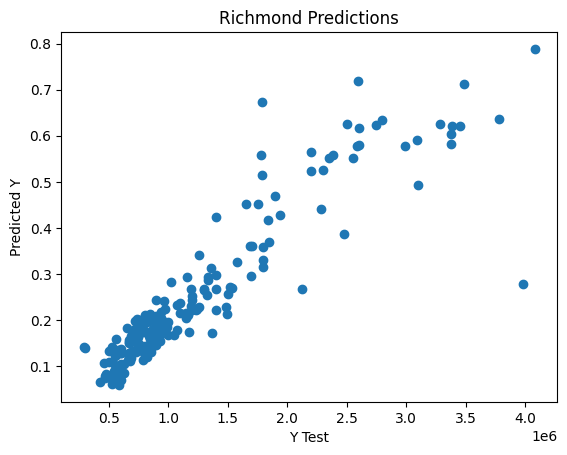

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Richmond Predictions')

#### Bayes Ridge Regression

In [ ]:
model = BayesianRidge()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [ 1.47328021e-02  1.47328021e-02  5.60983809e-01 -8.17159234e-02
 -2.76299601e-01  5.41668472e-03 -2.16534337e-02 -1.20824992e-02
  1.96951356e-03  7.23968297e-03  4.06838151e-03  1.55516989e-03
  9.59207592e-05 -1.53580194e-03 -2.01225854e-03 -8.50163975e-04
 -2.32329661e-03  1.32783827e-04  5.97240900e-04 -1.23853491e-02
  3.41472620e-03 -6.70170575e-02  8.42840213e-02 -8.29634090e-03
 -3.87882600e-02 -2.11487651e-02 -4.04350950e-03  5.40988452e-03
  2.03277435e-02 -2.30939831e-02 -1.86412776e-03  2.48292082e-02
  3.83718093e-02]
Intercepts: -29.923812157412822
Learning rate 204.8518139977709


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,0.014733
baths,0.014733
square footage,0.560984
Latitude,-0.081716
Longitude,-0.276300
Garage,0.005417
Parking,-0.021653
Garden,-0.012082
Fireplace,0.001970
Balcony,0.007240


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:101536902344.76582
R2 score:0.8352143140009658


Text(0.5, 1.0, 'Richmond Predictions')

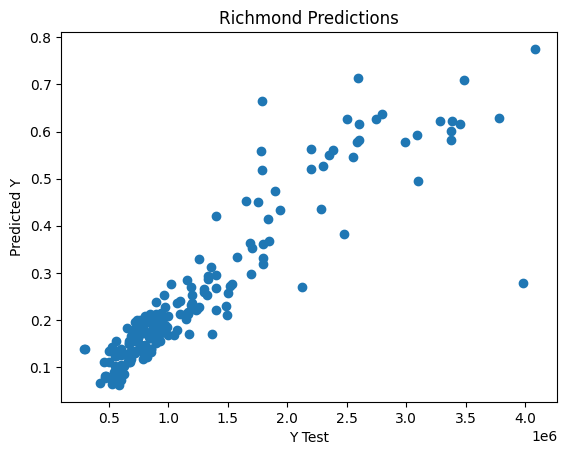

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Richmond Predictions')

### Simpson Paradox

In [ ]:
df_sim_richmond['property type'].value_counts()

,count
property type,
condo,566
townhouse,213
house,205
duplex,9
Unknown,7


#### condo

In [ ]:
df_richmond_condo = df_sim_richmond[df_sim_richmond['property type']=='condo']
df_richmond_condo = df_richmond_condo.drop(columns=['property type'],axis=1)
df_richmond_condo

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
2,650000,2,2,0.115909,49.179185,-123.120570,1,1,0,0,...,7.3,0,0,0,1,0,0,0,0,0
19,3690000,3,3,0.364583,49.176185,-123.147197,1,1,1,0,...,9.6,0,0,0,0,1,0,0,0,0
54,599900,1,1,0.117045,49.175680,-123.125519,1,1,0,0,...,4.0,0,1,0,0,0,0,0,0,0
68,1388000,2,2,0.179545,49.176548,-123.148416,1,1,0,0,...,9.5,0,0,1,0,0,0,0,0,0
78,749900,2,2,0.158144,49.180868,-123.120889,1,1,1,0,...,5.7,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10061,679900,2,2,0.175000,49.169428,-123.123788,1,1,0,0,...,9.0,0,1,0,0,0,0,0,0,0
10063,1249800,2,2,0.215152,49.171412,-123.137844,0,0,0,0,...,5.8,1,0,0,0,0,0,0,0,0
10078,999000,2,2,0.136174,49.164929,-123.140339,1,1,1,0,...,4.8,0,0,1,0,0,0,0,0,0
10082,849900,1,1,0.100189,49.176185,-123.147197,1,1,1,0,...,8.1,0,0,0,0,1,0,0,0,0


In [ ]:
X,y = df_richmond_condo.drop(columns='price',axis=1),df_richmond_condo['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                  -0.005785
baths                 -0.005785
square footage         1.537071
Latitude               0.350395
Longitude             -0.360350
Garage                 0.016678
Parking               -0.057395
Garden                -0.007312
Fireplace             -0.006994
Balcony                0.003168
Pool                   0.010382
Grocery                0.000622
Restaurants           -0.001702
Shopping              -0.001485
Cafes                 -0.001510
Walking                0.000151
Cycling                0.001164
Transit                0.000538
Driving                0.001749
Heating_Baseboard     -0.035223
Heating_Electric      -0.023093
Heating_Forced Air     0.032641
Heating_Geothermal     0.015588
Heating_Heat Pump      0.036615
Heating_Hot Water     -0.047427
Heating_Natural Gas   -0.006896
Heating_Other          0.027796
Heating_Radiant        0.000000
dtype: float64
R2 scores: [0.44704373 0.68655942 0.41439505 0.656333

#### house

In [ ]:
df_richmond_house = df_sim_richmond[df_sim_richmond['property type']=='house']
df_richmond_house = df_richmond_house.drop(columns=['property type'],axis=1)
df_richmond_house

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
97,1389000,4,4,0.506439,49.186278,-123.150001,0,1,0,1,...,6.8,1,0,0,0,0,0,0,0,0
118,2398000,5,5,0.639015,49.196610,-123.103481,1,1,1,1,...,3.7,0,0,0,0,0,1,0,0,0
186,1910000,5,5,0.518182,49.181267,-123.113779,1,1,0,1,...,5.2,0,0,0,0,0,0,1,0,0
482,1698000,3,3,0.353788,49.179786,-123.107508,1,1,0,1,...,7.5,0,0,1,0,0,0,0,0,0
762,3100888,4,4,0.470644,49.189084,-123.123173,0,1,0,1,...,5.3,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10053,2748000,5,5,0.571402,49.153883,-123.133390,1,1,0,1,...,6.8,0,0,0,0,0,0,0,0,1
10089,1790000,3,3,0.390909,49.130828,-123.161318,1,1,0,1,...,7.6,0,0,1,0,0,0,0,0,0
10095,2780000,4,4,0.804924,49.154923,-123.146758,1,1,0,1,...,7.3,1,0,0,0,0,0,0,0,0
10096,2599000,5,5,0.725758,49.144139,-123.097768,1,1,0,1,...,8.3,0,0,0,0,0,0,0,0,1


In [ ]:
X,y = df_richmond_house.drop(columns='price',axis=1),df_richmond_house['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                  -6.334806e-03
baths                 -6.334806e-03
square footage         8.155393e-01
Latitude              -1.255933e+00
Longitude             -2.932734e-01
Garage                -5.827126e-02
Parking                1.165734e-15
Garden                -5.260326e-02
Fireplace              3.300321e-02
Balcony               -3.474992e-02
Pool                   5.803389e-02
Grocery               -2.937887e-03
Restaurants           -9.791953e-03
Shopping              -2.221182e-03
Cafes                 -8.383275e-03
Walking                1.090585e-03
Cycling               -1.280364e-02
Transit               -6.884979e-03
Driving               -9.670221e-03
Heating_Baseboard     -1.162933e-01
Heating_Electric      -1.280151e-02
Heating_Forced Air    -7.623347e-03
Heating_Geothermal    -1.887379e-16
Heating_Heat Pump      7.806436e-02
Heating_Hot Water      1.356715e-02
Heating_Natural Gas    8.485554e-03
Heating_Other         -2.224

#### townhouse

In [ ]:
df_richmond_townhouse = df_sim_richmond[df_sim_richmond['property type']=='townhouse']
df_richmond_townhouse = df_richmond_townhouse.drop(columns=['property type'],axis=1)
df_richmond_townhouse

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
67,1395000,4,4,0.295265,49.177802,-123.096142,1,1,0,0,...,3.8,0,0,1,0,0,0,0,0,0
96,888000,3,3,0.281629,49.174506,-122.969338,1,1,0,1,...,6.2,1,0,0,0,0,0,0,0,0
214,1289000,3,3,0.255682,49.180281,-123.084361,1,1,0,1,...,7.1,0,0,1,0,0,0,0,0,0
220,1499900,3,3,0.260606,49.183455,-123.121920,1,1,1,1,...,4.8,0,0,0,1,0,0,0,0,0
268,1330000,4,4,0.356818,49.177984,-123.113195,1,1,0,1,...,4.5,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10041,1399000,3,3,0.302462,49.157693,-123.159301,1,1,0,1,...,8.8,1,0,0,0,0,0,0,0,0
10046,1049000,2,2,0.206439,49.167693,-123.117761,1,1,1,1,...,6.5,0,1,0,0,0,0,0,0,0
10052,1163000,3,3,0.268182,49.143855,-123.131236,1,1,1,1,...,9.3,0,1,0,0,0,0,0,0,0
10084,1338000,4,4,0.321780,49.124128,-123.161123,1,1,0,1,...,8.3,0,1,0,0,0,0,0,0,0


In [ ]:
X,y = df_richmond_townhouse.drop(columns='price',axis=1),df_richmond_townhouse['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                   0.023081
baths                  0.023081
square footage         1.020671
Latitude              -0.182576
Longitude             -1.079866
Garage                 0.083886
Parking                0.029905
Garden                -0.037262
Fireplace             -0.016594
Balcony                0.029083
Pool                   0.019257
Grocery                0.001103
Restaurants           -0.002499
Shopping              -0.000962
Cafes                  0.000579
Walking               -0.002842
Cycling                0.004022
Transit                0.008818
Driving                0.000504
Heating_Baseboard     -0.047613
Heating_Electric      -0.040718
Heating_Forced Air    -0.041517
Heating_Geothermal     0.079857
Heating_Heat Pump      0.049223
Heating_Hot Water     -0.060027
Heating_Natural Gas   -0.069374
Heating_Other          0.000000
Heating_Radiant        0.130168
dtype: float64
R2 scores: [0.56614598 0.66692844 0.16153821 0.525151

### Ensemble Models

In [ ]:
X,y = df_richmond.drop(columns='price',axis=1),df_richmond['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

#### Desicion Tree

In [ ]:
params = {
    'max_depth':[4,5,6,7]
}
grid  = GridSearchCV(DecisionTreeRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 4}


In [ ]:
model = DecisionTreeRegressor(**grid.best_params_)
model.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=4)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:144355067335.05966
R2 score:0.789010745629636


Text(0, 0.5, 'Predicted Y')

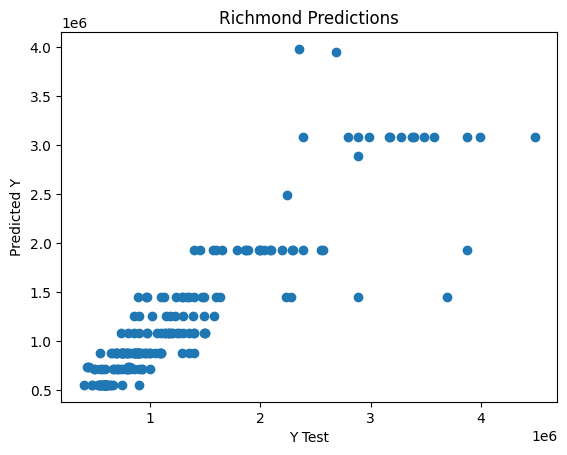

In [ ]:
plt.scatter(y_test,pred)
plt.title('Richmond Predictions')
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

property type_house        0.691971
square footage             0.246966
Latitude                   0.024663
baths                      0.013693
Cycling                    0.006541
Heating_Baseboard          0.005397
Heating_Geothermal         0.005077
Longitude                  0.002884
Grocery                    0.002381
Shopping                   0.000426
beds                       0.000000
Fireplace                  0.000000
Balcony                    0.000000
Restaurants                0.000000
Garden                     0.000000
Parking                    0.000000
Garage                     0.000000
Walking                    0.000000
Cafes                      0.000000
Pool                       0.000000
Transit                    0.000000
property type_condo        0.000000
property type_Unknown      0.000000
property type_duplex       0.000000
Driving                    0.000000
property type_townhouse    0.000000
Heating_Electric           0.000000
Heating_Forced Air         0

#### Random Forest

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(RandomForestRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 7, 'n_estimators': 170}


In [ ]:
model = RandomForestRegressor(**grid.best_params_)
model.fit(X_train,y_train)

RandomForestRegressor(max_depth=7, n_estimators=170)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:105008131643.79045
R2 score:0.8465201962954063


Text(0.5, 1.0, 'Richmond Predictions')

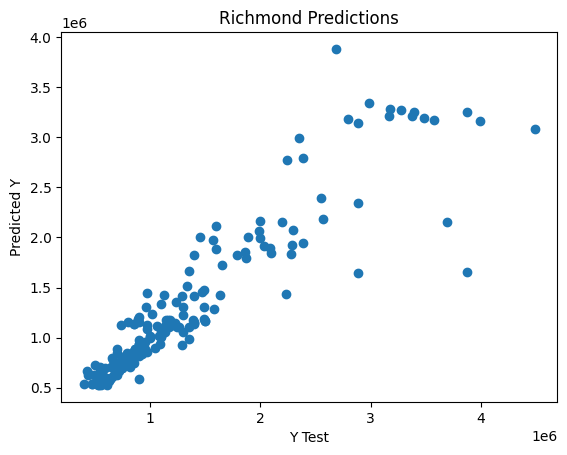

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Richmond Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

property type_house        0.457938
square footage             0.407545
Latitude                   0.029674
beds                       0.014325
Longitude                  0.012676
Cycling                    0.009918
baths                      0.009882
Cafes                      0.006478
Transit                    0.005499
Driving                    0.005485
Grocery                    0.005076
Heating_Baseboard          0.004253
Walking                    0.003899
Restaurants                0.003812
Heating_Heat Pump          0.003498
Heating_Geothermal         0.003328
Shopping                   0.003167
property type_condo        0.002746
Fireplace                  0.002128
Pool                       0.001609
property type_townhouse    0.001323
Heating_Forced Air         0.001308
Garage                     0.001012
Heating_Hot Water          0.000790
Heating_Radiant            0.000665
Garden                     0.000557
Heating_Electric           0.000521
Heating_Other              0

#### XGBOOST Regression

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(XGBRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 4, 'n_estimators': 100}


In [ ]:
model = XGBRegressor(**grid.best_params_)
model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:83486515200.0
R2 score:0.8779761791229248


Text(0.5, 1.0, 'Richmond Predictions')

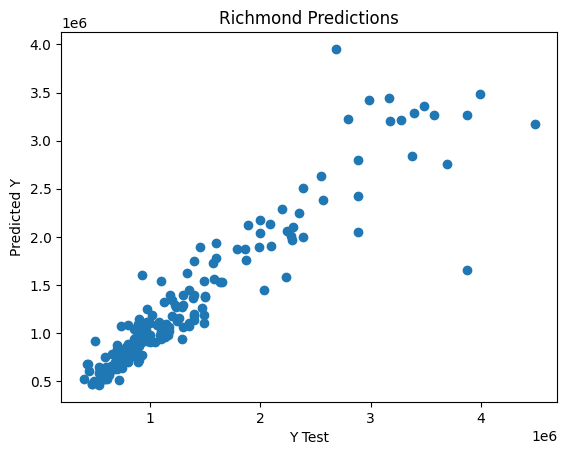

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('Richmond Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

property type_house        0.873798
square footage             0.036617
Heating_Baseboard          0.012170
Heating_Heat Pump          0.009042
Fireplace                  0.009005
Heating_Geothermal         0.007832
property type_condo        0.005825
Heating_Forced Air         0.005058
beds                       0.004942
Heating_Electric           0.003907
Latitude                   0.003502
Longitude                  0.002749
Cycling                    0.002366
Heating_Hot Water          0.002258
Garage                     0.002206
Garden                     0.002201
Heating_Natural Gas        0.002021
Heating_Other              0.001779
Cafes                      0.001759
Restaurants                0.001702
Driving                    0.001693
Heating_Radiant            0.001682
Grocery                    0.001257
Pool                       0.001156
Walking                    0.001116
Transit                    0.000911
Shopping                   0.000900
Parking                    0

### West Vancouver

In [ ]:
len(df_scaled_w_vancouver)

1165

In [ ]:
X,y = df_scaled_w_vancouver.drop(columns='price',axis=1),df_scaled_w_vancouver['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
y_train = scaler_1.fit_transform(y_train.values.reshape(-1,1))

### Linear Model

#### Linear Regression

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[-4.68170156e-03 -4.68170156e-03  3.28267250e-01 -8.86105645e-01
  -1.69278752e-01 -8.84754131e-03 -3.27967798e-02 -5.49607209e-03
  -1.48154561e-03 -4.85270061e-03 -9.99306274e-03  4.61925400e-04
   2.94194023e-04 -4.32329318e-04  4.84549739e-04 -1.40887386e-04
   8.73501443e-04 -1.20985978e-03 -6.23340852e-04 -1.00977106e-02
   3.27440315e-03  7.13340918e-03  1.08083526e-03 -1.39093698e-03
  -1.03673778e-02 -3.41282944e-03  9.93900311e-04  1.78747173e-02
   2.46147362e-03  8.89862758e-03 -3.41946890e-03 -1.22553984e-02
  -7.73644250e-04]]
Intercepts: [22.92801415]


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.004682
baths,-0.004682
square footage,0.328267
Latitude,-0.886106
Longitude,-0.169279
Garage,-0.008848
Parking,-0.032797
Garden,-0.005496
Fireplace,-0.001482
Balcony,-0.004853


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val)}')
print(f'R2 score:{r2_score(y_test,true_val)}')

MSE:3549665418925.294
R2 score:0.613512072197439


Text(0.5, 1.0, 'West Vancouver Predictions')

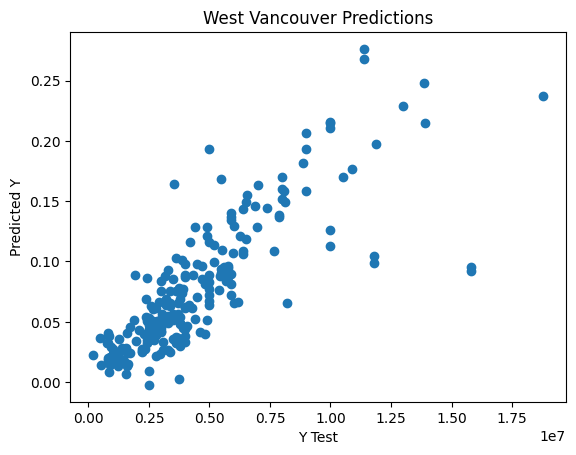

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('West Vancouver Predictions')

#### Lasso Regression

In [ ]:
model = LassoCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-9.92143354e-03 -2.88634719e-18  3.15259068e-01 -8.35890056e-02
 -7.44094259e-02 -6.39136853e-03 -0.00000000e+00 -5.83854804e-03
 -2.22414639e-03 -5.03519021e-03 -9.16772054e-03  5.58476131e-04
  2.70338880e-04 -3.54049299e-04  5.73960127e-04  0.00000000e+00
  9.04617590e-04 -8.72821248e-04 -5.98527370e-04 -3.14044525e-03
  3.84583489e-03  0.00000000e+00  0.00000000e+00 -1.39331375e-03
 -8.13669266e-03 -2.41381180e-03  1.26210912e-03  0.00000000e+00
  3.19571969e-03  1.10738880e-02 -2.14392743e-03 -8.43141730e-03
  0.00000000e+00]
Intercepts: -5.01785203583064
Learning rate 4.898520858973318e-05


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:1664: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-9.921434e-03
baths,-2.886347e-18
square footage,3.152591e-01
Latitude,-8.358901e-02
Longitude,-7.440943e-02
Garage,-6.391369e-03
Parking,-0.000000e+00
Garden,-5.838548e-03
Fireplace,-2.224146e-03
Balcony,-5.035190e-03


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:3531873844626.12
R2 score:0.6154492205964323


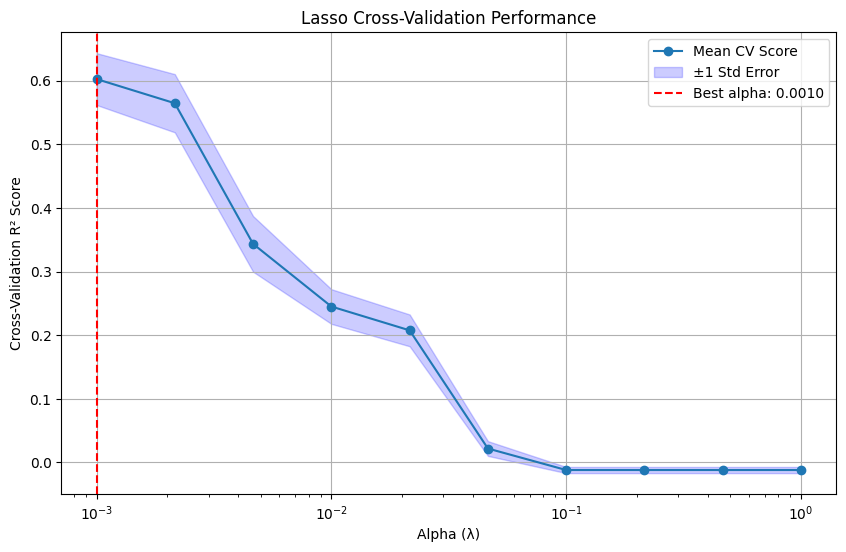

Најдобра вредност на alpha: 0.001
Највисок R² скор од cross-validation: 0.6026


In [ ]:
from sklearn.linear_model import Lasso
lasso = Lasso(random_state=0, max_iter=50000)

# 2. Избери опсег за алфа вредности (λ)
alphas = np.logspace(-3, 0, 10)
y= scaler_1.fit_transform(y.values.reshape(-1,1))
# 3. Постави GridSearchCV за Lasso со cross-validation
param_grid = {'alpha': alphas}
clf = GridSearchCV(lasso, param_grid, cv=5)
clf.fit(X, y)

# 4. Извлечи резултати од cross-validation
scores = clf.cv_results_['mean_test_score']
scores_std = clf.cv_results_['std_test_score']
std_error = scores_std / np.sqrt(5)

# 5. Направи визуелизација на резултатите
plt.figure(figsize=(10, 6))
plt.semilogx(alphas, scores, marker='o', label='Mean CV Score')
plt.fill_between(alphas, scores - std_error, scores + std_error, alpha=0.2, color='blue', label='±1 Std Error')
plt.axvline(clf.best_params_['alpha'], color='red', linestyle='--', label=f'Best alpha: {clf.best_params_["alpha"]:.4f}')
plt.xlabel('Alpha (λ)')
plt.ylabel('Cross-Validation R² Score')
plt.title('Lasso Cross-Validation Performance')
plt.grid(True)
plt.legend()
plt.show()

# 6. Прикажи резултати
print(f'Најдобра вредност на alpha: {clf.best_params_["alpha"]}')
print(f'Највисок R² скор од cross-validation: {np.max(scores):.4f}')

Text(0.5, 1.0, 'West Vancouver Predictions')

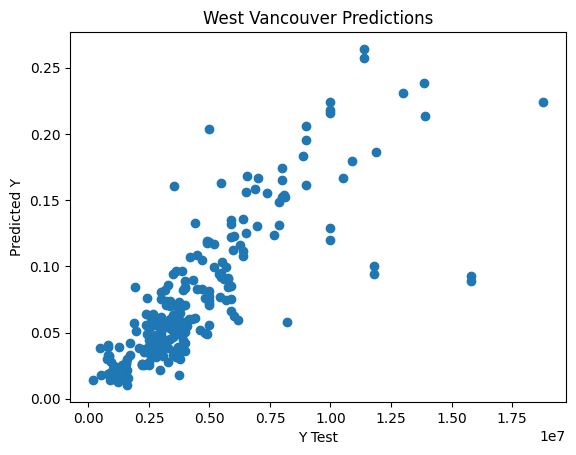

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('West Vancouver Predictions')

#### Ridge Regression

In [ ]:
model = RidgeCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-4.83619407e-03 -4.83619407e-03  3.19626891e-01 -3.34455803e-01
 -1.17237464e-01 -7.37096860e-03 -1.74756610e-02 -5.94219478e-03
 -2.25972495e-03 -5.29646646e-03 -9.98703427e-03  5.09043419e-04
  3.23420265e-04 -3.84043559e-04  5.40359098e-04 -2.94171125e-05
  9.19407854e-04 -1.00523550e-03 -6.48744875e-04 -9.41721937e-03
  5.66828116e-03  2.82852174e-03  1.66317073e-03 -7.42754269e-04
 -8.64207365e-03 -2.56371528e-03  1.73011259e-03  6.05683786e-03
  4.45959291e-03  1.11191070e-02 -2.39090944e-03 -1.02946201e-02
  5.25668131e-04]
Intercepts: [2.10127276]
Learning rate 0.1


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.004836
baths,-0.004836
square footage,0.319627
Latitude,-0.334456
Longitude,-0.117237
Garage,-0.007371
Parking,-0.017476
Garden,-0.005942
Fireplace,-0.002260
Balcony,-0.005296


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:3506079552327.6343
R2 score:0.6182577057360243


Text(0.5, 1.0, 'West Vancouver Predictions')

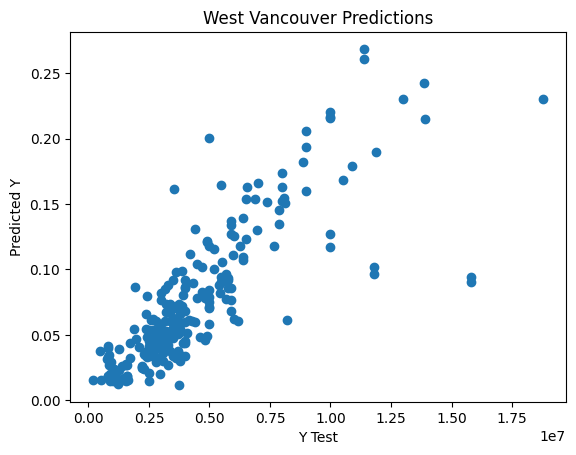

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('West Vancouver Predictions')

#### Bayes Ridge Regression

In [ ]:
model = BayesianRidge()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-4.67242768e-03 -4.67242768e-03  3.08539984e-01 -1.05562128e-01
 -8.34272962e-02 -6.29485296e-03 -9.24323669e-03 -6.07156878e-03
 -2.35555032e-03 -5.26138790e-03 -9.96907379e-03  5.33507693e-04
  3.13600777e-04 -3.36694524e-04  5.89107936e-04  9.36859984e-06
  9.18196127e-04 -9.03979187e-04 -6.42206657e-04 -8.43910213e-03
  5.98088333e-03  1.19445312e-03  2.19359732e-03 -9.29831635e-04
 -8.53641601e-03 -2.64650722e-03  1.54150194e-03  2.11775408e-03
  4.69807131e-03  1.22671715e-02 -1.66048640e-03 -9.37379395e-03
  1.59270473e-03]
Intercepts: -5.037607781724893
Learning rate 587.4905599249797


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.004672
baths,-0.004672
square footage,0.308540
Latitude,-0.105562
Longitude,-0.083427
Garage,-0.006295
Parking,-0.009243
Garden,-0.006072
Fireplace,-0.002356
Balcony,-0.005261


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:3468371098365.1343
R2 score:0.6223634059958019


Text(0.5, 1.0, 'West Vancouver Predictions')

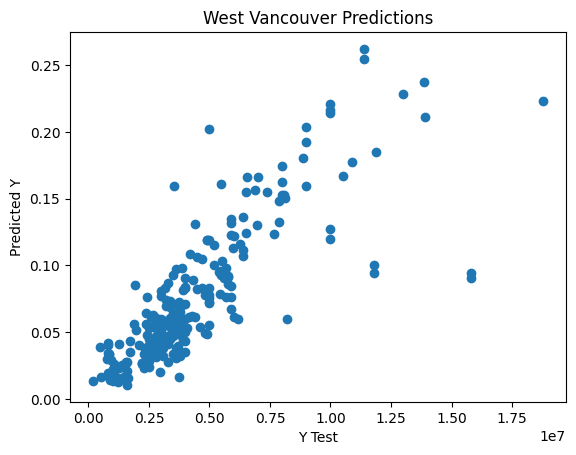

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('West Vancouver Predictions')

### Simpson Paradox

In [ ]:
df_sim_w_vancouver['property type'].value_counts()

,count
property type,
house,874
condo,230
townhouse,45
duplex,10
Unknown,6


#### house

In [ ]:
df_w_vancouver_house = df_sim_w_vancouver[df_sim_w_vancouver['property type']=='house']
df_w_vancouver_house = df_w_vancouver_house.drop(columns=['property type'],axis=1)
df_w_vancouver_house

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
1030,169900,1,1,0.030988,49.323967,-123.133471,0,1,0,1,...,6.5,0,1,0,0,0,0,0,0,0
2574,439000,2,2,0.087291,49.322083,-123.133312,0,1,0,1,...,7.9,1,0,0,0,0,0,0,0,0
2690,6280000,5,5,0.493279,49.345825,-123.239742,1,1,1,1,...,9.7,0,0,0,0,0,0,1,0,0
2740,4988000,4,4,0.342615,49.340421,-123.171089,1,1,1,0,...,7.8,0,0,0,0,0,0,1,0,0
2763,3398000,6,6,0.264839,49.345208,-123.231949,0,1,1,0,...,4.7,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16278,4928000,5,5,0.511697,49.340936,-123.202161,1,1,1,1,...,6.7,0,0,1,0,0,0,0,0,0
16286,2891000,4,4,0.221631,49.331369,-123.156732,0,1,0,1,...,8.0,0,0,1,0,0,0,0,0,0
16287,2698750,2,2,0.055080,49.331148,-123.156726,0,1,0,1,...,6.0,0,0,1,0,0,0,0,0,0
16295,4238000,4,4,0.328474,49.367367,-123.283567,1,1,0,1,...,4.9,0,0,1,0,0,0,0,0,0


In [ ]:
X,y = df_w_vancouver_house.drop(columns='price',axis=1),df_w_vancouver_house['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                  -0.004881
baths                 -0.004881
square footage         0.300013
Latitude              -0.881529
Longitude             -0.128304
Garage                -0.007643
Parking               -0.028669
Garden                -0.007713
Fireplace             -0.003983
Balcony               -0.006290
Pool                  -0.009371
Grocery                0.000923
Restaurants            0.001014
Shopping               0.000094
Cafes                  0.000519
Walking                0.000252
Cycling                0.000896
Transit               -0.001447
Driving               -0.001087
Heating_Baseboard     -0.013941
Heating_Electric      -0.010442
Heating_Forced Air    -0.006198
Heating_Geothermal     0.036522
Heating_Heat Pump      0.002631
Heating_Hot Water      0.012560
Heating_Natural Gas   -0.004221
Heating_Other         -0.016289
Heating_Radiant       -0.000622
dtype: float64
R2 scores: [0.64383282 0.54877583 0.43864713 0.644371

#### condo

In [ ]:
df_w_vancouver_condo= df_sim_w_vancouver[df_sim_w_vancouver['property type']=='condo']
df_w_vancouver_condo = df_w_vancouver_condo.drop(columns=['property type'],axis=1)
df_w_vancouver_condo

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
198,999000,2,2,0.103439,49.326391,-123.134442,1,1,1,1,...,7.2,1,0,0,0,0,0,0,0,0
272,999900,2,2,0.059270,49.325654,-123.124699,1,1,0,0,...,8.3,0,0,1,0,0,0,0,0,0
529,1399900,2,2,0.081006,49.325654,-123.124701,1,1,0,0,...,8.2,0,0,1,0,0,0,0,0,0
1409,789900,1,1,0.036837,49.325657,-123.124712,1,1,1,0,...,6.8,0,0,1,0,0,0,0,0,0
1640,1578000,2,2,0.086679,49.325656,-123.124709,1,1,0,0,...,8.7,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16189,1849000,2,2,0.089822,49.328919,-123.137909,1,1,0,0,...,9.9,0,0,0,0,1,0,0,0,0
16210,1050000,1,1,0.067476,49.376227,-123.276057,1,1,1,1,...,7.0,0,0,0,1,0,0,0,0,0
16218,1599000,2,2,0.088949,49.376243,-123.276066,1,1,0,1,...,7.1,0,1,0,0,0,0,0,0,0
16240,849800,2,2,0.081704,49.330395,-123.161445,0,1,1,0,...,7.4,1,0,0,0,0,0,0,0,0


In [ ]:
X,y = df_w_vancouver_condo.drop(columns='price',axis=1),df_w_vancouver_condo['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                  -2.716460e-02
baths                 -2.716460e-02
square footage         2.988746e+00
Latitude              -7.811880e+00
Longitude             -2.261736e+00
Garage                -4.253869e-02
Parking                4.255554e-14
Garden                -2.995370e-03
Fireplace              3.089262e-02
Balcony                3.154601e-02
Pool                   1.127559e-02
Grocery               -3.114474e-03
Restaurants           -3.046162e-03
Shopping               1.352227e-04
Cafes                 -2.221826e-03
Walking                8.650071e-04
Cycling               -3.236585e-03
Transit               -2.973309e-03
Driving                2.192318e-03
Heating_Baseboard     -2.135758e-03
Heating_Electric      -1.616706e-02
Heating_Forced Air     1.154253e-01
Heating_Geothermal     7.330730e-02
Heating_Heat Pump      7.172283e-02
Heating_Hot Water      4.495941e-02
Heating_Natural Gas   -1.115088e-01
Heating_Other         -1.030

### Ensemble Models

In [ ]:
X,y = df_w_vancouver.drop(columns='price',axis=1),df_w_vancouver['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

#### Desicion Tree

In [ ]:
params = {
    'max_depth':[4,5,6,7]
}
grid  = GridSearchCV(DecisionTreeRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 6}


In [ ]:
model = DecisionTreeRegressor(**grid.best_params_)
model.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=6)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:3965156502726.281
R2 score:0.6976967037885056


Text(0.5, 1.0, 'West Vancouver Predictions')

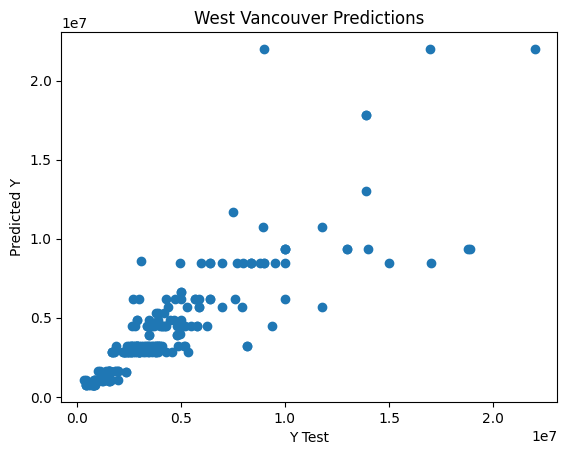

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('West Vancouver Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.826612
Latitude                   0.070652
Longitude                  0.053136
property type_condo        0.019716
Grocery                    0.011606
Transit                    0.007798
Heating_Hot Water          0.004446
Driving                    0.002488
baths                      0.001895
Heating_Radiant            0.000677
Walking                    0.000495
Heating_Baseboard          0.000363
beds                       0.000074
Garage                     0.000043
Garden                     0.000000
Fireplace                  0.000000
Parking                    0.000000
Cycling                    0.000000
Cafes                      0.000000
Shopping                   0.000000
Restaurants                0.000000
Balcony                    0.000000
Pool                       0.000000
property type_Unknown      0.000000
property type_duplex       0.000000
property type_townhouse    0.000000
property type_house        0.000000
Heating_Electric           0

#### Random Forest

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(RandomForestRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 7, 'n_estimators': 100}


In [ ]:
model = RandomForestRegressor(**grid.best_params_)
model.fit(X_train,y_train)

RandomForestRegressor(max_depth=7)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:2435707824243.0176
R2 score:0.8143017801767658


Text(0.5, 1.0, 'West Vancouver Predictions')

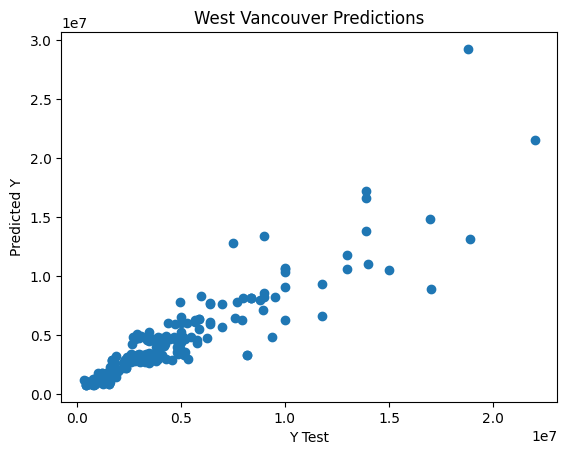

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('West Vancouver Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.697241
Latitude                   0.145652
Longitude                  0.055012
Driving                    0.013407
property type_condo        0.012955
Heating_Hot Water          0.012427
Grocery                    0.011244
Shopping                   0.008278
baths                      0.006999
Walking                    0.006315
beds                       0.005847
Restaurants                0.004182
Transit                    0.004152
Cycling                    0.003707
Heating_Geothermal         0.002617
Cafes                      0.002549
Heating_Natural Gas        0.002533
Garage                     0.001336
Heating_Radiant            0.000940
Garden                     0.000392
Heating_Electric           0.000387
Heating_Other              0.000370
Heating_Forced Air         0.000360
Heating_Baseboard          0.000287
Fireplace                  0.000224
property type_house        0.000207
Heating_Heat Pump          0.000161
Balcony                    0

#### XGBOOST Regression

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(XGBRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 5, 'n_estimators': 170}


In [ ]:
model = XGBRegressor(**grid.best_params_)
model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=170, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:1793992163328.0
R2 score:0.8632261753082275


Text(0.5, 1.0, 'West Vancouver Predictions')

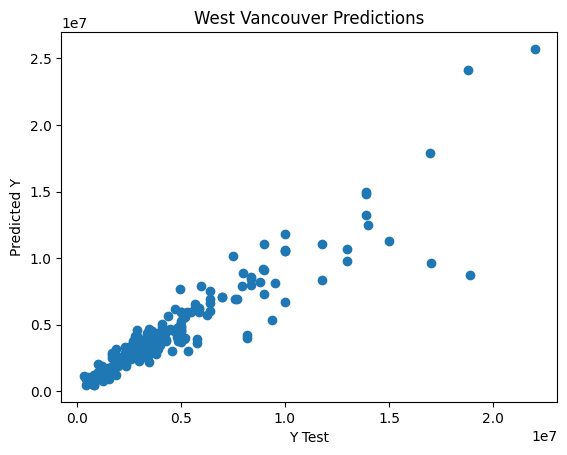

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('West Vancouver Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

property type_condo        0.342278
square footage             0.238611
Heating_Hot Water          0.116944
Balcony                    0.061270
Latitude                   0.052416
Longitude                  0.047383
beds                       0.032904
Heating_Radiant            0.020565
Grocery                    0.017392
property type_house        0.014595
Heating_Electric           0.006029
Garage                     0.005848
Heating_Baseboard          0.005380
Driving                    0.005126
Heating_Natural Gas        0.004818
Cycling                    0.003137
Walking                    0.002922
Transit                    0.002754
Garden                     0.002374
Heating_Heat Pump          0.002331
Cafes                      0.002219
Restaurants                0.002144
Shopping                   0.002122
Heating_Forced Air         0.002010
Parking                    0.001408
Fireplace                  0.001284
Heating_Geothermal         0.001177
Pool                       0

### North Vancouver

In [ ]:
X,y = df_scaled_n_vancouver.drop(columns='price',axis=1),df_scaled_n_vancouver['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
y_train = scaler_1.fit_transform(y_train.values.reshape(-1,1))

### Linear Models

#### Linear Regression

In [ ]:
model = LinearRegression()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)

Model coeficient: [[-3.37058351e-03 -3.37058351e-03  3.68001508e-01 -1.99583858e-01
  -6.42536498e-02  8.65067616e-03  2.85608739e-02 -4.91468003e-03
  -6.19439098e-03 -3.80243677e-03 -1.59177422e-03  6.26564179e-04
   5.84234279e-04 -2.81418236e-04  1.25151936e-03  6.53562761e-04
  -1.63941542e-04  8.87826614e-04 -4.31309452e-04 -5.14508398e-03
  -5.21009566e-03  9.31422850e-03  1.02259240e-02 -9.18497284e-03
  -1.47595348e-02 -1.81506497e-03  2.95878596e-03  2.79056784e-04
   1.83254467e-02 -1.22223569e-02  7.16504377e-03  9.51750800e-05
  -2.65516483e-05]]
Intercepts: [1.92043698]


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.003371
baths,-0.003371
square footage,0.368002
Latitude,-0.199584
Longitude,-0.064254
Garage,0.008651
Parking,0.028561
Garden,-0.004915
Fireplace,-0.006194
Balcony,-0.003802


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform(pred)
print(f'MSE:{mean_squared_error(y_test,true_val)}')
print(f'R2 score:{r2_score(y_test,true_val)}')

MSE:218024764124.1163
R2 score:0.765008304884202


Text(0.5, 1.0, 'North Vancouver Predictions')

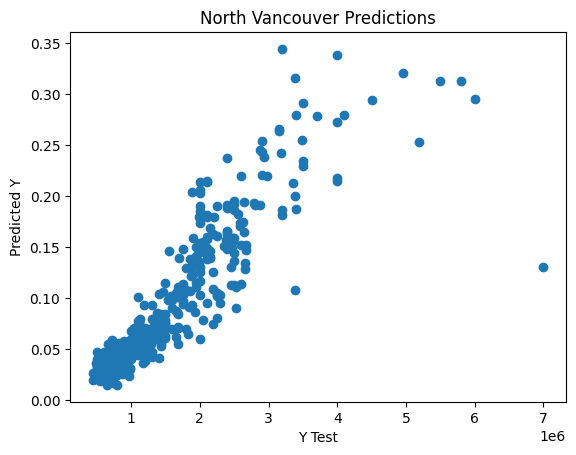

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('North Vancouver Predictions')

#### Lasso Regression

In [ ]:
model = LassoCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-5.81275396e-03 -0.00000000e+00  3.56231737e-01 -0.00000000e+00
 -0.00000000e+00  7.80716479e-03  1.71376272e-02 -4.51827452e-03
 -6.32338258e-03 -3.18898344e-03 -3.90674136e-04  6.18861716e-04
  6.12298102e-04 -2.27626347e-04  1.19678753e-03  5.29960963e-04
 -1.39848054e-04  8.78018945e-04 -4.32039086e-04 -0.00000000e+00
 -0.00000000e+00  1.14103991e-02  1.31102011e-02 -4.36922405e-03
 -1.51636795e-02 -2.31091036e-03  1.52061652e-03 -0.00000000e+00
  1.77225772e-02 -1.09810039e-02  6.23946823e-03  0.00000000e+00
 -0.00000000e+00]
Intercepts: -0.007846035254755551
Learning rate 7.643528558135451e-05


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:1664: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.005813
baths,-0.000000
square footage,0.356232
Latitude,-0.000000
Longitude,-0.000000
Garage,0.007807
Parking,0.017138
Garden,-0.004518
Fireplace,-0.006323
Balcony,-0.003189


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:209687351066.47943
R2 score:0.7739945447508776


Text(0.5, 1.0, 'North Vancouver Predictions')

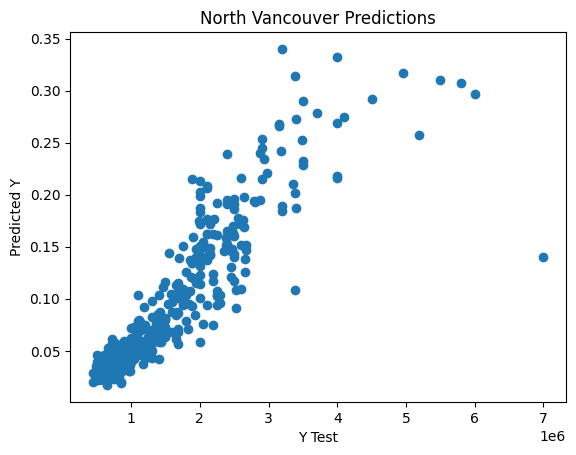

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('North Vancouver Predictions')

#### Ridge Regression

In [ ]:
model = RidgeCV()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-3.29007816e-03 -3.29007816e-03  3.64423988e-01 -1.34490455e-01
 -5.43541291e-02  8.68380548e-03  2.76818904e-02 -4.94405970e-03
 -6.30267733e-03 -3.78400342e-03 -1.58987274e-03  6.38720613e-04
  5.86106455e-04 -2.87917707e-04  1.24958467e-03  6.32542641e-04
 -1.62737137e-04  8.88496155e-04 -4.34724659e-04 -5.41593158e-03
 -5.15015660e-03  9.64455747e-03  1.00727808e-02 -9.15125005e-03
 -1.48670215e-02 -1.87748093e-03  2.76194513e-03 -7.79826719e-05
  1.84686533e-02 -1.21621033e-02  7.32608346e-03  4.50140667e-04
 -2.22342066e-05]
Intercepts: [-0.07043789]
Learning rate 0.1


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.003290
baths,-0.003290
square footage,0.364424
Latitude,-0.134490
Longitude,-0.054354
Garage,0.008684
Parking,0.027682
Garden,-0.004944
Fireplace,-0.006303
Balcony,-0.003784


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:215691051634.94983
R2 score:0.767523629489392


Text(0.5, 1.0, 'North Vancouver Predictions')

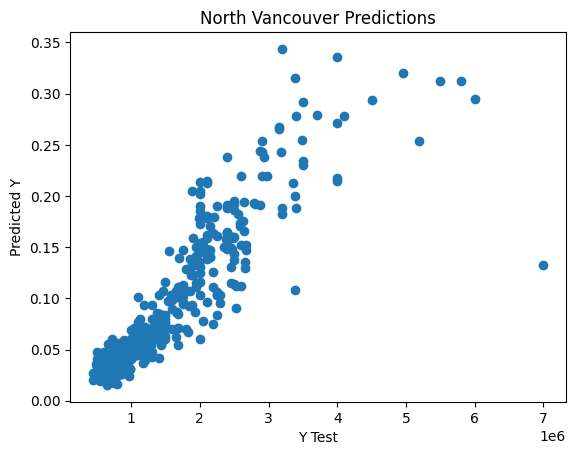

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('North Vancouver Predictions')

#### Bayes Ridge Regression

In [ ]:
model = BayesianRidge()
model.fit(X_train,y_train)
print(f'Model coeficient: {model.coef_}')
print('Intercepts:',model.intercept_)
print('Learning rate',model.alpha_)

Model coeficient: [-3.14489958e-03 -3.14489958e-03  3.59512537e-01 -8.72494929e-02
 -4.58530253e-02  8.82064510e-03  2.66334772e-02 -4.93979997e-03
 -6.37038903e-03 -3.74690333e-03 -1.57182032e-03  6.43010594e-04
  5.89511427e-04 -2.96555451e-04  1.25049055e-03  6.15250346e-04
 -1.63399593e-04  8.89388868e-04 -4.36018850e-04 -5.71247602e-03
 -5.23520097e-03  9.93113362e-03  1.01836280e-02 -9.16708463e-03
 -1.49682331e-02 -1.94370488e-03  2.55882688e-03 -3.73235838e-04
  1.85952157e-02 -1.21195250e-02  7.49748061e-03  8.36954300e-04
 -8.37785665e-05]
Intercepts: -1.3528889420212755
Learning rate 801.9639456528737


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
coeff_df = pd.DataFrame(model.coef_.T,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
beds,-0.003145
baths,-0.003145
square footage,0.359513
Latitude,-0.087249
Longitude,-0.045853
Garage,0.008821
Parking,0.026633
Garden,-0.004940
Fireplace,-0.006370
Balcony,-0.003747


In [ ]:
pred = model.predict(X_test)
true_val = scaler_1.inverse_transform([pred])
print(f'MSE:{mean_squared_error(y_test,true_val.ravel())}')
print(f'R2 score:{r2_score(y_test,true_val.ravel())}')

MSE:213306283789.30573
R2 score:0.770093982636003


Text(0.5, 1.0, 'North Vancouver Predictions')

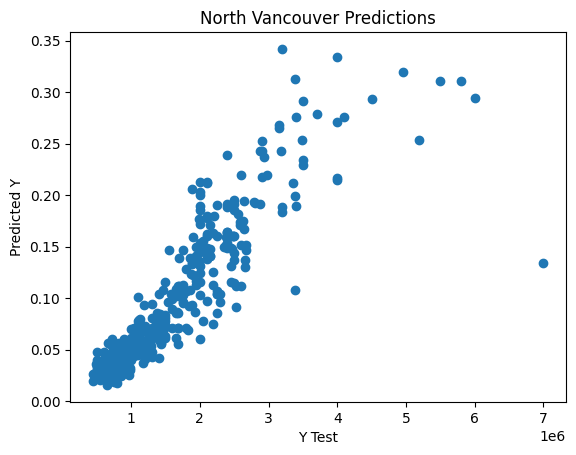

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('North Vancouver Predictions')

### Simpson paradox

In [ ]:
df_sim_n_vancouver['property type'].value_counts()

,count
property type,
condo,908
house,688
townhouse,290
duplex,49
Unknown,24


#### condo

In [ ]:
df_n_vancouver_condo= df_sim_n_vancouver[df_sim_n_vancouver['property type']=='condo']
df_n_vancouver_condo = df_n_vancouver_condo.drop(columns=['property type'],axis=1)
df_n_vancouver_condo

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
6,799000,1,1,0.097135,49.311136,-123.083163,1,1,0,1,...,6.8,1,0,0,0,0,0,0,0,0
20,679900,2,2,0.105244,49.324933,-123.070351,1,1,0,1,...,3.9,1,0,0,0,0,0,0,0,0
35,899000,2,2,0.106145,49.322862,-123.073689,1,1,1,1,...,7.9,1,0,0,0,0,0,0,0,0
43,1124000,2,2,0.082357,49.324853,-123.122521,1,1,0,0,...,3.6,0,0,0,0,1,0,0,0,0
60,899000,2,2,0.092990,49.316014,-122.980387,1,1,0,0,...,7.7,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15972,1299900,2,2,0.103082,49.319716,-123.070948,1,1,1,0,...,6.5,0,0,1,0,0,0,0,0,0
15973,1799900,3,3,0.226888,49.319716,-123.070948,1,1,1,0,...,6.0,0,0,1,0,0,0,0,0,0
15974,1339900,2,2,0.079113,49.319716,-123.070948,1,1,1,0,...,8.0,0,0,1,0,0,0,0,0,0
16129,835000,2,2,0.078212,49.323860,-123.101307,1,1,0,1,...,5.9,0,1,0,0,0,0,0,0,0


In [ ]:
X,y = df_n_vancouver_condo.drop(columns='price',axis=1),df_n_vancouver_condo['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                  -0.000306
baths                 -0.000306
square footage         1.223408
Latitude              -0.769771
Longitude             -0.204463
Garage                 0.033149
Parking               -0.047635
Garden                -0.004656
Fireplace             -0.001825
Balcony               -0.001338
Pool                  -0.003307
Grocery                0.000645
Restaurants           -0.001519
Shopping              -0.002009
Cafes                  0.001691
Walking               -0.000974
Cycling               -0.001417
Transit                0.001040
Driving                0.000693
Heating_Baseboard     -0.027278
Heating_Electric      -0.011622
Heating_Forced Air     0.020055
Heating_Geothermal     0.012438
Heating_Heat Pump      0.059142
Heating_Hot Water     -0.027200
Heating_Natural Gas   -0.010648
Heating_Other         -0.010718
Heating_Radiant       -0.004171
dtype: float64
R2 scores: [0.8085197  0.79120936 0.72367072 0.744962

#### house

In [ ]:
df_n_vancouver_house= df_sim_n_vancouver[df_sim_n_vancouver['property type']=='house']
df_n_vancouver_house = df_n_vancouver_house.drop(columns=['property type'],axis=1)
df_n_vancouver_house

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
90,2868000,6,6,0.635610,49.316431,-123.053393,1,1,0,1,...,3.6,0,0,1,0,0,0,0,0,0
143,1975000,4,4,0.379528,49.309186,-123.049343,1,1,0,1,...,3.7,0,0,0,0,0,0,1,0,0
230,1699000,5,5,0.353938,49.323444,-123.038834,0,1,0,1,...,4.1,0,0,1,0,0,0,0,0,0
238,5488000,4,4,0.535232,49.318546,-122.942365,1,1,1,1,...,8.1,0,0,1,0,0,0,0,0,0
285,2498000,4,4,0.283294,49.325321,-123.064076,1,1,0,1,...,8.6,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15883,5499000,5,5,0.873130,49.349216,-123.094024,1,1,0,1,...,6.3,0,0,1,0,0,0,0,0,0
15897,2398000,3,3,0.399351,49.356129,-123.083029,0,1,0,1,...,4.7,1,0,0,0,0,0,0,0,0
15910,1599000,6,6,0.423680,49.331413,-123.067415,1,1,0,0,...,6.4,0,0,1,0,0,0,0,0,0
15950,2650000,5,5,0.366372,49.350186,-123.081342,0,1,0,1,...,8.3,0,0,1,0,0,0,0,0,0


In [ ]:
X,y = df_n_vancouver_house.drop(columns='price',axis=1),df_n_vancouver_house['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                  -6.011922e-03
baths                 -6.011922e-03
square footage         3.444395e-01
Latitude               3.185761e-01
Longitude              1.033011e-01
Garage                 2.439556e-03
Parking                4.058445e-02
Garden                -6.477649e-03
Fireplace             -5.817090e-03
Balcony               -5.401771e-03
Pool                  -8.886393e-03
Grocery                1.415808e-03
Restaurants            1.273053e-03
Shopping              -1.748349e-04
Cafes                  1.340869e-03
Walking                1.437340e-03
Cycling               -6.189126e-04
Transit                9.728779e-04
Driving               -6.875708e-04
Heating_Baseboard     -2.008238e-02
Heating_Electric      -2.942963e-04
Heating_Forced Air    -1.021265e-02
Heating_Geothermal     6.585444e-17
Heating_Heat Pump      1.634123e-02
Heating_Hot Water     -9.785313e-03
Heating_Natural Gas    7.352187e-03
Heating_Other         -1.007

#### Townhouse

In [ ]:
df_n_vancouver_townhouse= df_sim_n_vancouver[df_sim_n_vancouver['property type']=='townhouse']
df_n_vancouver_townhouse = df_n_vancouver_townhouse.drop(columns=['property type'],axis=1)
df_n_vancouver_townhouse

,price,beds,baths,square footage,Latitude,Longitude,Garage,Parking,Garden,Fireplace,...,Driving,Heating_Baseboard,Heating_Electric,Heating_Forced Air,Heating_Geothermal,Heating_Heat Pump,Heating_Hot Water,Heating_Natural Gas,Heating_Other,Heating_Radiant
37,1619000,3,3,0.248874,49.315391,-123.067135,1,1,0,1,...,6.2,1,0,0,0,0,0,0,0,0
49,1465000,4,4,0.194810,49.315193,-123.028610,1,1,1,1,...,9.0,0,1,0,0,0,0,0,0,0
129,1299000,3,3,0.204902,49.311737,-122.970461,1,1,0,1,...,9.7,0,0,1,0,0,0,0,0,0
134,1450000,4,4,0.261849,49.315913,-123.079424,0,1,0,1,...,8.8,0,0,1,0,0,0,0,0,0
178,1098000,2,2,0.100739,49.321969,-123.092893,1,1,1,1,...,4.7,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15955,1649900,4,4,0.204361,49.308780,-123.066941,1,1,0,0,...,5.2,0,0,1,0,0,0,0,0,0
15956,1619900,4,4,0.204361,49.308780,-123.066941,1,1,0,0,...,9.9,0,0,1,0,0,0,0,0,0
15957,1619900,3,3,0.204361,49.308780,-123.066941,1,1,0,0,...,8.9,0,0,1,0,0,0,0,0,0
15958,1609900,3,3,0.225987,49.308780,-123.066941,1,1,0,0,...,7.4,0,0,1,0,0,0,0,0,0


In [ ]:
X,y = df_n_vancouver_townhouse.drop(columns='price',axis=1),df_n_vancouver_townhouse['price']
y = scaler_1.fit_transform(y.values.reshape(-1,1))
kf = KFold(n_splits=5, shuffle=True, random_state=42)
model = LinearRegression()
coefs = []
for train_index, val_index in kf.split(X):
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y[train_index], y[val_index]

    model.fit(X_train, y_train)
    coefs.append(model.coef_.ravel()) # Store coefficients for each fold

# Convert to DataFrame for easier viewing
coef_df = pd.DataFrame(coefs, columns=X.columns)
print("\nAverage Coefficients Across Folds:")
print(coef_df.mean())
scores = cross_val_score(model, X, y, cv=kf, scoring='r2')
print("R2 scores:", scores)
print("Average R2:", np.mean(scores))


Average Coefficients Across Folds:
beds                   9.145339e-03
baths                  9.145339e-03
square footage         1.176935e+00
Latitude              -2.130193e-01
Longitude             -8.374044e-01
Garage                 1.307355e-01
Parking               -3.765374e-01
Garden                 3.148672e-03
Fireplace             -1.120664e-02
Balcony                3.285572e-02
Pool                   2.691098e-02
Grocery                3.908698e-03
Restaurants            8.787491e-04
Shopping               1.656341e-03
Cafes                  1.464929e-03
Walking               -4.091841e-03
Cycling                8.221944e-03
Transit                5.402799e-03
Driving                4.300861e-03
Heating_Baseboard     -3.528935e-02
Heating_Electric      -4.086312e-02
Heating_Forced Air     1.777408e-02
Heating_Geothermal    -2.109424e-16
Heating_Heat Pump      3.771268e-03
Heating_Hot Water     -3.881184e-02
Heating_Natural Gas   -3.711705e-02
Heating_Other          1.377

### Ensemble Models

In [ ]:
X,y = df_n_vancouver.drop(columns='price',axis=1),df_n_vancouver['price']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

#### Desicion Tree

In [ ]:
params = {
    'max_depth':[4,5,6,7]
}
grid  = GridSearchCV(DecisionTreeRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 7}


In [ ]:
model = DecisionTreeRegressor(**grid.best_params_)
model.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=7)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:157426643495.3125
R2 score:0.8082295147966917


Text(0.5, 1.0, 'North Vancouver Predictions')

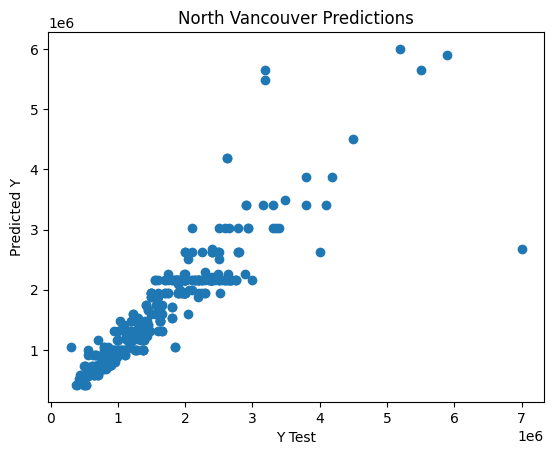

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('North Vancouver Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.860695
Longitude                  0.050974
Latitude                   0.026481
property type_townhouse    0.014661
beds                       0.011772
Shopping                   0.009278
Heating_Forced Air         0.004693
Heating_Baseboard          0.004416
Heating_Heat Pump          0.003342
Heating_Electric           0.003187
Cycling                    0.002224
Restaurants                0.001953
Parking                    0.001540
property type_house        0.001489
Walking                    0.000936
property type_condo        0.000862
Driving                    0.000797
Garage                     0.000598
Heating_Hot Water          0.000078
Grocery                    0.000019
Fireplace                  0.000004
baths                      0.000000
Balcony                    0.000000
Pool                       0.000000
Garden                     0.000000
Cafes                      0.000000
property type_duplex       0.000000
Transit                    0

#### Random Forest

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(RandomForestRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 7, 'n_estimators': 180}


In [ ]:
model = RandomForestRegressor(**grid.best_params_)
model.fit(X_train,y_train)

RandomForestRegressor(max_depth=7, n_estimators=180)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:138170824962.65414
R2 score:0.8316861392981517


Text(0.5, 1.0, 'North Vancouver Predictions')

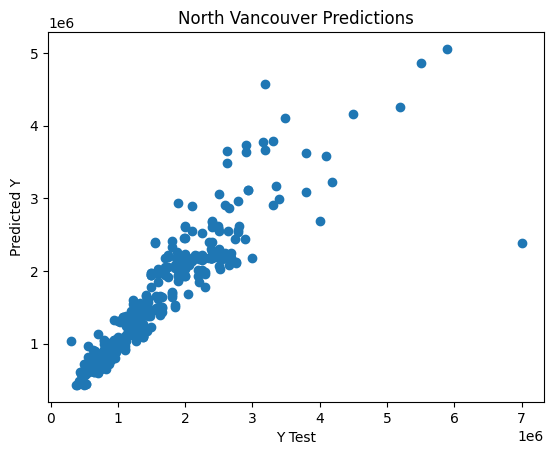

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('North Vancouver Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.852581
Longitude                  0.035229
Latitude                   0.034055
property type_townhouse    0.013668
Shopping                   0.005814
baths                      0.005667
beds                       0.005113
Cafes                      0.005106
Transit                    0.004432
property type_condo        0.004019
Heating_Heat Pump          0.003701
Driving                    0.003644
property type_house        0.003482
Heating_Forced Air         0.003385
Restaurants                0.003336
Heating_Baseboard          0.003198
Cycling                    0.002779
Walking                    0.002342
Garage                     0.001951
Heating_Natural Gas        0.001742
Grocery                    0.001112
Heating_Electric           0.001054
Fireplace                  0.000809
Balcony                    0.000614
Heating_Hot Water          0.000452
Garden                     0.000256
Parking                    0.000212
Heating_Radiant            0

#### XGBOOST Regression

In [ ]:
params = {
    'max_depth':[4,5,6,7],
    'n_estimators':[100,150,170,180,200]
}
grid  = GridSearchCV(XGBRegressor(),param_grid=params)
grid.fit(X_train,y_train)
print(grid.best_params_)

{'max_depth': 5, 'n_estimators': 150}


In [ ]:
model = XGBRegressor(**grid.best_params_)
model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=150, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
pred = model.predict(X_test)
print(f'MSE:{mean_squared_error(y_test,pred)}')
print(f'R2 score:{r2_score(y_test,pred)}')

MSE:92054618112.0
R2 score:0.8878629803657532


Text(0.5, 1.0, 'North Vancouver Predictions')

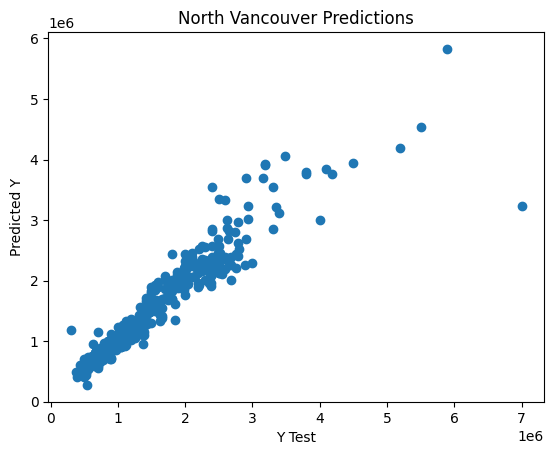

In [ ]:
plt.scatter(y_test,pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.title('North Vancouver Predictions')

In [ ]:
importances = model.feature_importances_
feature_names = X_train.columns
feat_importance = pd.Series(importances, index=feature_names)
feat_importance = feat_importance.sort_values(ascending=False)
print(feat_importance)

square footage             0.379233
property type_townhouse    0.215931
property type_condo        0.066955
Parking                    0.034495
Heating_Baseboard          0.033428
Heating_Heat Pump          0.032865
Garage                     0.032352
property type_house        0.027768
Heating_Natural Gas        0.024948
Longitude                  0.024471
Heating_Forced Air         0.021905
beds                       0.014707
Latitude                   0.012551
property type_duplex       0.008959
Heating_Other              0.008029
Heating_Electric           0.007605
Heating_Hot Water          0.007428
Balcony                    0.006024
Heating_Radiant            0.005812
Shopping                   0.005271
Driving                    0.004855
Transit                    0.004614
Cafes                      0.003625
Restaurants                0.003142
Fireplace                  0.002660
Cycling                    0.002491
Grocery                    0.002267
Walking                    0